#### Import Libraries

In [5]:
import gym
from gym import spaces
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from stable_baselines3 import PPO
from stable_baselines3.common.vec_env import DummyVecEnv
import random
from sklearn.preprocessing import StandardScaler
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')

# Set global styling for plots
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_theme(style="darkgrid")

# Set seed for reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/torch/utils/_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(


#### Data Processing

In [6]:
# Load the data
def load_data_sources():
    """
    Load all data sources for the portfolio optimization project.
    
    Returns:
        tuple: (stock_returns, fundamental_data, sentiment_data, economic_data)
    """
    try:
        # Load stock returns, sentiment and economic indicators data
        stock_returns = pd.read_csv('../data/processed/stock_return_data.csv')
        sentiment_data = pd.read_csv('../data/processed/sector_sentiment_with_metrics_quarterly_2014_2024.csv')
        economic_data = pd.read_csv('../data/processed/economic_indicators_quarterly_2014_2024.csv')

        # Load sector mapping from file
        global sector_mapping
        if 'sector_mapping' not in globals():
            sector_mapping = pd.read_csv('../data/sector_company_mapping.csv')

        # Load fundamental ratios
        fundamental_data = pd.DataFrame()
        for ticker in sector_mapping['ticker']:
            file_path = f'../data/processed/ratios/{ticker}_ratios.csv'
            if os.path.exists(file_path):
                sector_data = pd.read_csv(file_path)
                sector_data['sector'] = sector_mapping.loc[sector_mapping['ticker'] == ticker, 'sector'].values[0]
                fundamental_data = pd.concat([fundamental_data, sector_data])
            else:
                print(f"Warning: File not found for ticker {ticker}. Skipping.")

        # Load economic indicators
        economic_data['Date'] = pd.to_datetime(economic_data['Date'])
        economic_data.reset_index()

        # Rename date columns to 'Date' for consistency
        stock_returns.rename(columns={'DlyCalDt': 'Date'}, inplace=True)
        fundamental_data.rename(columns={'date': 'Date'}, inplace=True)

        # Datetime conversion
        stock_returns['Date'] = pd.to_datetime(stock_returns['Date'])
        fundamental_data['Date'] = pd.to_datetime(fundamental_data['Date'])
        sentiment_data['Date'] = pd.to_datetime(sentiment_data['Date'])

        print("All data sources loaded successfully")
        return stock_returns, fundamental_data, sentiment_data, economic_data
    
    except FileNotFoundError as e:
        print(f"Error loading data: {e}")
        print("Please ensure all required data files are in the correct directories")
        return None, None, None, None

# Preprocess the data
def preprocess_data(stock_returns, fundamental_data, sentiment_data, economic_data):
    """    Preprocess and align all data sources to daily frequency.        
    Args:        
        stock_returns: DataFrame with daily stock returns        
        fundamental_data: DataFrame with quarterly fundamental ratios        
        sentiment_data: DataFrame with daily or periodic sentiment scores        
        economic_data: DataFrame with quarterly economic indicators           
    Returns:        
        DataFrame: Merged dataset with all features aligned to daily frequency    
    
    """
    # Ensure all dates are in datetime format    
    for df in [stock_returns, fundamental_data, sentiment_data, economic_data]:
        if df is not None and 'Date' in df.columns:
            df['Date'] = pd.to_datetime(df['Date'])
            df['Year'] = df['Date'].dt.year
            df['Quarter'] = df['Date'].dt.quarter

    # Create a complete daily date range    
    min_date = stock_returns['Date'].min()
    max_date = stock_returns['Date'].max()
    all_dates = pd.DataFrame({'Date': pd.date_range(min_date, max_date, freq='D')})
    all_dates['Year'] = all_dates['Date'].dt.year
    all_dates['Quarter'] = all_dates['Date'].dt.quarter
    
    # Process stock returns    
    if 'Log_Return' not in stock_returns.columns:
        stock_returns['Log_Return'] = np.log(1 + stock_returns['DlyRet'].clip(-0.99, np.inf))

    stock_returns.rename(columns={'Ticker': 'ticker'}, inplace=True)
    stock_returns = pd.merge(stock_returns, sector_mapping, on='ticker', how='left')

    # Create sector-day panel for returns
    sector_returns = stock_returns.pivot_table(index='Date', columns='sector', values='Log_Return')
    sector_returns = sector_returns.add_suffix('_Return')
    sector_returns = sector_returns.reset_index()
    
    # Process fundamental data
    if fundamental_data is not None and not fundamental_data.empty:
        fundamental_features = [col for col in fundamental_data.columns if col not in ['Date', 'Year', 'Quarter', 'sector']]
        
        # Clean data
        for col in fundamental_features:
            if col in fundamental_data.columns:
                fundamental_data[col] = fundamental_data[col].replace([np.inf, -np.inf], np.nan)
                fundamental_data[col] = fundamental_data[col].clip(-1e6, 1e6)
        
        # Use train_end_date instead of current_date to prevent look-ahead bias
        fundamental_pivot = fundamental_data.pivot_table(
            index=['Year', 'Quarter'],
            columns='sector',
            values=fundamental_features,
            aggfunc='mean')
        
        fundamental_pivot = fundamental_pivot.fillna(method='ffill')
        
        if isinstance(fundamental_pivot.columns, pd.MultiIndex):
            fundamental_pivot.columns = ['_'.join([str(col[1]), str(col[0])]) for col in fundamental_pivot.columns]
            fundamental_pivot = fundamental_pivot.add_prefix('fund_')
            fundamental_pivot = fundamental_pivot.reset_index()
    else:
        fundamental_pivot = pd.DataFrame({'Year': [], 'Quarter': []})

    # Process sentiment data
    if sentiment_data is not None and not sentiment_data.empty:
    # Convert Date to datetime
        sentiment_data['Date'] = pd.to_datetime(sentiment_data['Date'])

        # Add Year and Quarter
        sentiment_data['Year'] = sentiment_data['Date'].dt.year
        sentiment_data['Quarter'] = sentiment_data['Date'].dt.quarter

        # Identify sentiment-related feature columns
        sentiment_features = [col for col in sentiment_data.columns if col not in ['Date', 'Year', 'Quarter']]

        # Clean and clip values
        for col in sentiment_features:
            if col in sentiment_data.columns:
                sentiment_data[col] = sentiment_data[col].replace([np.inf, -np.inf], np.nan)
                sentiment_data[col] = sentiment_data[col].clip(-10, 10)

        # Add prefix for clarity
        sentiment_data = sentiment_data.add_prefix('sent_')

        # Restore Date, Year, Quarter column names after prefixing
        sentiment_data = sentiment_data.rename(columns={
            'sent_Date': 'Date',
            'sent_Year': 'Year',
            'sent_Quarter': 'Quarter'
        })

        # Set the final pivoted/processed DataFrame
        sentiment_pivot = sentiment_data.copy()

    else:
        sentiment_pivot = pd.DataFrame({'Date': []})
          
    # Process economic indicators
    if economic_data is not None and not economic_data.empty:
        economic_features = [col for col in economic_data.columns if col not in ['Date', 'Year', 'Quarter']]
        
        for col in economic_features:
            economic_data[col] = pd.to_numeric(economic_data[col], errors='coerce')
            economic_data[col] = economic_data[col].replace([np.inf, -np.inf], np.nan)
            if pd.api.types.is_numeric_dtype(economic_data[col]):
                economic_data[col] = economic_data[col].clip(-1e6, 1e6)
        
        economic_pivot = economic_data.set_index(['Year', 'Quarter'])
        economic_features = [col for col in economic_pivot.columns if col not in ['Date']]
        economic_pivot = economic_pivot[economic_features]
        economic_pivot = economic_pivot.add_prefix('econ_')
        economic_pivot = economic_pivot.reset_index()
    
    else:
        economic_pivot = pd.DataFrame({'Year': [], 'Quarter': []})
        
    # Merge all datasets
    merged_data = pd.merge(all_dates, sector_returns, on='Date', how='left')

    if not fundamental_pivot.empty and 'Year' in fundamental_pivot.columns:
        merged_data = pd.merge(merged_data, fundamental_pivot, on=['Year', 'Quarter'], how='left')
    
    if not economic_pivot.empty and 'Year' in economic_pivot.columns:
        merged_data = pd.merge(merged_data, economic_pivot, on=['Year', 'Quarter'], how='left')
    
    #if not sentiment_pivot.empty and 'Year' in sentiment_pivot.columns:
        #merged_data = pd.merge(merged_data, sentiment_pivot, on=['Year', 'Quarter'], how='left')
    
    if 'Year' in sentiment_pivot.columns:
        sentiment_pivot = sentiment_pivot.drop(columns=['Date'], errors='ignore')
        merged_data = pd.merge(merged_data, sentiment_pivot, on=['Year', 'Quarter'], how='left')
    elif 'Date' in sentiment_pivot.columns:
        sentiment_pivot = sentiment_pivot.drop(columns=['Year', 'Quarter'], errors='ignore')
        merged_data = pd.merge(merged_data, sentiment_pivot, on='Date', how='left')
        
    # Drop non-numeric columns except Date, Year, Quarter
    non_numeric_cols = [col for col in merged_data.columns
                        if not pd.api.types.is_numeric_dtype(merged_data[col])
                        and col not in ['Date', 'Year', 'Quarter']]
    merged_data = merged_data.drop(columns=non_numeric_cols)
    merged_data.set_index('Date', inplace=True)

    # Handle missing values
    merged_data = merged_data.fillna(method='ffill')
    merged_data = merged_data.fillna(merged_data.mean())
    merged_data = merged_data.fillna(0)
    
    # Clean any remaining issues
    for col in merged_data.columns:
        if pd.api.types.is_numeric_dtype(merged_data[col]):
            merged_data[col] = merged_data[col].replace([np.inf, -np.inf], 0)
            
    # Standardize features
    feature_columns = [col for col in merged_data.columns
                       if any(prefix in col for prefix in ['fund_', 'sent_', 'econ_'])]
    
    if feature_columns:
        try:
            scaler = StandardScaler()
            merged_data[feature_columns] = scaler.fit_transform(merged_data[feature_columns])
            
        except Exception:
            # Manual standardization
            for col in feature_columns:
                mean = merged_data[col].mean()
                std = merged_data[col].std()
                if std > 0:
                    merged_data[col] = (merged_data[col] - mean) / std
                else:
                    merged_data[col] = 0
                merged_data[col] = merged_data[col].clip(-5, 5)
    return merged_data

In [7]:
# PORTFOLIO OPTIMIZATION FUNCTIONS
def monte_carlo_portfolio_optimization(returns_data, num_simulations=10000):
    """
    Use Monte Carlo simulations to find optimal initial weights.
    
    Parameters:
        returns_data (pd.DataFrame): DataFrame with sector returns
        num_simulations (int): Number of portfolio simulations
        
    Returns:
        pd.Series: Optimal initial weights based on Sharpe ratio
    """
    print(f"Running Monte Carlo simulation with {num_simulations} iterations...")
    
    # Extract return columns
    return_cols = [col for col in returns_data.columns if '_Return' in col]
    returns = returns_data[return_cols].dropna()
    
    n_assets = len(return_cols)
    
    # Calculate mean returns and covariance matrix
    mean_returns = returns.mean()
    cov_matrix = returns.cov()
    
    # Run simulations
    results = np.zeros((4, num_simulations))
    weights_record = np.zeros((num_simulations, n_assets))
    
    for i in range(num_simulations):
        # Generate random weights
        weights = np.random.random(n_assets)
        weights = weights / np.sum(weights)
        weights_record[i] = weights
        
        # Calculate portfolio metrics
        portfolio_return = np.sum(mean_returns * weights) * 252  # Annualized return
        portfolio_std_dev = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights))) * np.sqrt(252)  # Annualized volatility
        results[0, i] = portfolio_return
        results[1, i] = portfolio_std_dev
        
        # Calculate Sharpe Ratio (assuming risk-free rate of 0.02)
        results[2, i] = (portfolio_return - 0.02) / portfolio_std_dev
    
    # Find best Sharpe ratio
    max_sharpe_idx = np.argmax(results[2])
    best_weights = weights_record[max_sharpe_idx]
    
    # Create a Series with asset names
    best_weights_series = pd.Series(best_weights, index=return_cols)
    
    print(f"Monte Carlo simulation complete. Optimal Sharpe ratio: {results[2, max_sharpe_idx]:.4f}")
    return best_weights_series

def calculate_volatility_adjusted_weights(data):
    """
    Calculate portfolio weights inversely proportional to sector volatility.
    """
    return_cols = [col for col in data.columns if '_Return' in col]
    sector_volatility = data[return_cols].std()
    inverse_volatility = 1 / sector_volatility
    weights = inverse_volatility / inverse_volatility.sum()
    return weights

def enforce_diversification(weights, min_weight=0.05, max_weight=0.3):
    """
    Adjust portfolio weights to ensure diversification by capping and flooring weights.
    """
    weights = np.array(weights)
    weights = np.clip(weights, min_weight, max_weight)
    return weights / weights.sum()  # Normalize to ensure weights sum to 1

def calculate_drawdown(cumulative_returns):
    """
    Calculate the maximum drawdown of a portfolio.
    """
    peak = cumulative_returns.cummax()
    drawdown = (cumulative_returns - peak) / peak
    return drawdown

def calculate_dynamic_risk_free_rate(economic_data, current_date):
    """
    Calculate a dynamic risk-free rate based on economic indicators.
    Simplification: Use treasury yield if available, otherwise fixed rate.
    """
    if 'econ_TreasuryYield_10Y' in economic_data.columns:
        treasury_data = economic_data[['econ_TreasuryYield_10Y']]
        current_yield = treasury_data[treasury_data.index <= current_date].iloc[-1]['econ_TreasuryYield_10Y']
        # Convert annual yield to daily rate
        daily_rf = (1 + current_yield) ** (1/252) - 1
        return daily_rf
    else:
        # Default to 2% annual rate
        return (1.02 ** (1/252)) - 1

In [8]:
# WALK-FORWARD VALIDATION
def walk_forward_validation(data, initial_train_days=252, validation_days=30, test_days=30):
    """
    Implement walk-forward validation for time series data.
    
    Parameters:
        data (pd.DataFrame): DataFrame with 'Date' column
        initial_train_days (int): Number of days for initial training period
        validation_days (int): Number of days for validation
        test_days (int): Number of days for testing
        
    Returns:
        list: List of tuples (train_data, validation_data, test_data)
    """
    data = data.sort_index()
    dates = data.index.unique()
    
    if len(dates) < initial_train_days + validation_days + test_days:
        raise ValueError("Not enough data for the specified periods")
        
    splits = []
    
    # Start with initial training period
    current_idx = initial_train_days
    
    # Continue until we can't form a complete test period
    while current_idx + validation_days + test_days <= len(dates):
        # Define date ranges
        train_end_date = dates[current_idx - 1]
        validation_end_date = dates[current_idx + validation_days - 1]
        test_end_date = dates[current_idx + validation_days + test_days - 1]
        
        # Split data
        train_data = data[data.index <= train_end_date]
        validation_data = data[(data.index > train_end_date) & (data.index <= validation_end_date)]
        test_data = data[(data.index > validation_end_date) & (data.index <= test_end_date)]
        
        if not validation_data.empty and not test_data.empty:
            assert all(train_data.index < validation_data.index.min()), "Training data overlaps with validation data!"
            assert all(validation_data.index < test_data.index.min()), "Validation data overlaps with test data!"
        splits.append((train_data, validation_data, test_data))
        
        # Move forward by test period
        current_idx += test_days
        
    print(f"Created {len(splits)} walk-forward validation splits")
    return splits

In [9]:
# PORTFOLIO ENVIRONMENT
class PortfolioEnv(gym.Env):
    def __init__(self, data, initial_weights=None, transaction_cost=0.001, 
                 diversification_penalty=0.1, volatility_penalty=0.05):
        super(PortfolioEnv, self).__init__()
        
        # Store the data
        self.data = data.sort_index().copy()
        self.dates = self.data.index.unique()
        
        # Identify feature columns
        self.return_cols = [col for col in data.columns if '_Return' in col]
        self.num_assets = len(self.return_cols)
        
        # Extract sector names from return column names
        self.sector_names = [col.split('_')[0] for col in self.return_cols]
        
        # Get feature columns by type
        self.fundamental_cols = [col for col in data.columns if 'fund_' in col]
        self.sentiment_cols = [col for col in data.columns if 'sent_' in col]
        self.economic_cols = [col for col in data.columns if 'econ_' in col]
        
        # Define feature space
        self.all_feature_cols = self.return_cols + self.fundamental_cols + self.sentiment_cols + self.economic_cols
        
        # Environment parameters
        self.current_step = 0
        self.transaction_cost = transaction_cost
        self.diversification_penalty = diversification_penalty
        self.volatility_penalty = volatility_penalty
        
        # Portfolio tracking
        if initial_weights is None:
            self.portfolio_weights = np.ones(self.num_assets) / self.num_assets
        else:
            self.portfolio_weights = np.array(initial_weights)
            
        # History tracking
        self.returns_history = []
        self.weights_history = [self.portfolio_weights.copy()]
        self.portfolio_value_history = [1.0]  # Start with 1.0 (100%)
        
        # Define action and observation spaces
        self.action_space = spaces.Box(
            low=0, 
            high=1, 
            shape=(self.num_assets,), 
            dtype=np.float32
        )
        
        # Observation space includes returns, fundamentals, sentiment, and economic indicators
        self.observation_space = spaces.Box(
            low=-np.inf,
            high=np.inf, 
            shape=(len(self.all_feature_cols),),
            dtype=np.float32
        )
        
        # Random number generator for reproducibility
        self.rng = np.random.default_rng()

    def seed(self, seed=None):
        """Set random seed for reproducibility"""
        self.rng = np.random.default_rng(seed)
        random.seed(seed)
        np.random.seed(seed)
        return [seed]
    
    def _calculate_fundamental_outperformance(self, weights):
        """
        Calculate how well the portfolio is positioned based on fundamental factors
        """
        # Get current date and fundamental data
        current_date = self.dates[self.current_step]
        current_data = self.data[self.data.index == current_date]
        
        # If no fundamental data is available, return neutral score
        if not self.fundamental_cols:
            return 0.0
            
        # For each sector, calculate average fundamental score (e.g., PE ratio, ROE)
        fundamental_scores = []
        
        for i, sector in enumerate(self.sector_names):
            sector_fundamental_cols = [col for col in self.fundamental_cols if sector in col]
            
            if sector_fundamental_cols:
                # Average the standardized fundamental metrics (higher is better)
                sector_score = current_data[sector_fundamental_cols].mean(axis=1).values[0]
                fundamental_scores.append(sector_score)
            else:
                fundamental_scores.append(0.0)
        
        # Calculate weighted score based on portfolio weights
        weighted_score = np.dot(weights, fundamental_scores)
        return weighted_score

    def _calculate_sentiment_alignment(self, weights):
        """
        Calculate how well the portfolio is positioned based on sentiment factors
        """
        # Get current date and sentiment data
        current_date = self.dates[self.current_step]
        current_data = self.data[self.data.index == current_date]
        
        # If no sentiment data is available, return neutral score
        if not self.sentiment_cols:
            return 0.0
            
        # For each sector, get the sentiment score
        sentiment_scores = []
        
        for i, sector in enumerate(self.sector_names):
            sector_sentiment_cols = [col for col in self.sentiment_cols if sector in col]
            
            if sector_sentiment_cols:
                # Average the sentiment metrics (higher is better)
                sector_score = current_data[sector_sentiment_cols].mean(axis=1).values[0]
                sentiment_scores.append(sector_score)
            else:
                sentiment_scores.append(0.0)
        
        # Calculate weighted score based on portfolio weights
        weighted_score = np.dot(weights, sentiment_scores)
        return weighted_score

    def _calculate_economic_alignment(self, weights):
        """
        Calculate how well the portfolio is positioned based on economic indicators
        """
        # Get current date and economic data
        current_date = self.dates[self.current_step]
        current_data = self.data[self.data.index == current_date]
        
        # If no economic data is available, return neutral score
        if not self.economic_cols:
            return 0.0
            
        # Get current economic indicators
        economic_indicators = current_data[self.economic_cols].values[0]
        
        # Define sector sensitivities to economic factors (simplified)
        # Each row is a sector, each column is an economic factor
        # These should ideally be learned from historical data
        if len(self.economic_cols) > 0:
            sensitivities = np.random.rand(self.num_assets, len(self.economic_cols)) * 2 - 1
            
            # Calculate how well each sector is positioned for current economic conditions
            sector_alignment = sensitivities @ economic_indicators
            
            # Normalize to [0, 1] range
            sector_alignment = (sector_alignment - sector_alignment.min()) / (sector_alignment.max() - sector_alignment.min() + 1e-10)
            
            # Calculate weighted alignment based on portfolio weights
            weighted_alignment = np.dot(weights, sector_alignment)
            return weighted_alignment
        else:
            return 0.0

    def calculate_reward(self, portfolio_return, weights, previous_weights):
        """
        Calculate composite reward based on multiple factors
        """
        # Transaction cost penalty
        transaction_cost_penalty = np.sum(np.abs(weights - previous_weights)) * self.transaction_cost
        
        # Diversification penalty
        equal_weights = np.ones(self.num_assets) / self.num_assets
        diversification_penalty = self.diversification_penalty * np.sum((weights - equal_weights) ** 2)
        
        # Volatility penalty (if we have enough history)
        volatility_penalty = 0
        if len(self.returns_history) > 1:
            returns_std = np.std(self.returns_history[-10:] if len(self.returns_history) >= 10 else self.returns_history)
            volatility_penalty = self.volatility_penalty * returns_std
        
        # Component rewards
        fundamental_component = self._calculate_fundamental_outperformance(weights)
        sentiment_component = self._calculate_sentiment_alignment(weights)
        economic_component = self._calculate_economic_alignment(weights)
        
        # Combine all components into final reward
        # Portfolio return is still the main component
        reward = portfolio_return - transaction_cost_penalty - diversification_penalty - volatility_penalty
        reward += 0.2 * fundamental_component + 0.2 * sentiment_component + 0.1 * economic_component
        
        reward_components = {
            'portfolio_return': portfolio_return,
            'transaction_cost': -transaction_cost_penalty,
            'diversification': -diversification_penalty,
            'volatility': -volatility_penalty,
            'fundamental': fundamental_component,
            'sentiment': sentiment_component,
            'economic': economic_component,
            'total_reward': reward
        }
        
        return reward, reward_components
    
    def step(self, action):
        """
        Execute one time step within the environment
        """
        # Ensure action is valid - normalize weights to sum to 1
        action = np.array(action).reshape(-1)
        action_sum = np.sum(action)
        if action_sum > 0:
            action = action / action_sum
        else:
            action = np.ones(self.num_assets) / self.num_assets
            
        # Calculate transaction costs
        previous_weights = self.portfolio_weights.copy()
            
        # Update portfolio weights
        self.portfolio_weights = action
        self.weights_history.append(self.portfolio_weights.copy())
        
        # Get current observation data
        current_date = self.dates[self.current_step]
        current_data = self.data[self.data.index == current_date]
        
        # Extract returns for current period
        current_returns = current_data[self.return_cols].values[0]
        
        # Calculate portfolio return
        portfolio_return = np.dot(self.portfolio_weights, current_returns)
        
        # Handle invalid portfolio return
        if np.isnan(portfolio_return) or np.isinf(portfolio_return):
            portfolio_return = 0.0
        
        # Update portfolio value
        self.portfolio_value_history.append(self.portfolio_value_history[-1] * (1 + portfolio_return))
        
        # Update returns history
        self.returns_history.append(portfolio_return)
        
        # Calculate reward
        reward, reward_components = self.calculate_reward(
            portfolio_return=portfolio_return,
            weights=self.portfolio_weights,
            previous_weights=previous_weights
        )
        
        # Move to next step
        self.current_step += 1
        done = self.current_step >= len(self.dates) - 1
        
        # Prepare next observation
        if not done:
            next_date = self.dates[self.current_step]
            next_data = self.data[self.data.index == next_date]
            next_obs = next_data[self.all_feature_cols].values[0]
        else:
            next_obs = np.zeros(len(self.all_feature_cols))
        
        # Check for dynamic rebalancing
        # Rebalance if there are two consecutive negative returns
        if len(self.returns_history) >= 2 and self.returns_history[-1] < 0 and self.returns_history[-2] < 0:
            self.portfolio_weights = np.ones(self.num_assets) / self.num_assets
        
        info = {
            'date': current_date,
            'portfolio_return': portfolio_return,
            'portfolio_value': self.portfolio_value_history[-1],
            'weights': self.portfolio_weights.copy(),
            'reward_components': reward_components
        }
        
        return next_obs, reward, done, info
    
    def reset(self):
        """Reset the environment to initial state"""
        self.current_step = 0
        self.portfolio_weights = np.ones(self.num_assets) / self.num_assets
        self.returns_history = []
        self.weights_history = [self.portfolio_weights.copy()]
        self.portfolio_value_history = [1.0]
        
        # Get initial observation
        initial_date = self.dates[self.current_step]
        initial_data = self.data[self.data.index == initial_date]
        initial_obs = initial_data[self.all_feature_cols].values[0]
        
        # Handle invalid observations
        if np.isnan(initial_obs).any() or np.isinf(initial_obs).any():
            initial_obs = np.nan_to_num(initial_obs, nan=0.0, posinf=0.0, neginf=0.0)
        
        return initial_obs

In [10]:
# PORTFOLIO EVALUATION METRICS
def evaluate_portfolio(returns, risk_free_rate=0.02/252):
    """
    Calculate comprehensive portfolio performance metrics
    
    Args:
        returns (np.array): Daily returns of the portfolio
        risk_free_rate (float): Daily risk-free rate
        
    Returns:
        dict: Dictionary of performance metrics
    """
    if len(returns) == 0:
        return {
            'total_return': 0,
            'annualized_return': 0,
            'volatility': 0,
            'sharpe_ratio': 0,
            'max_drawdown': 0,
            'win_rate': 0,
            'calmar_ratio': 0,
            'sortino_ratio': 0
        }
    
    # Calculate cumulative return (compounded)
    cumulative_return = np.prod(1 + np.array(returns)) - 1
    
    # Annualized return (assuming 252 trading days per year)
    annualized_return = (1 + cumulative_return) ** (252 / len(returns)) - 1
    
    # Calculate volatility (annualized)
    volatility = np.std(returns) * np.sqrt(252)
    
    # Calculate Sharpe Ratio (annualized)
    excess_returns = np.array(returns) - risk_free_rate
    sharpe_ratio = np.mean(excess_returns) / np.std(excess_returns) * np.sqrt(252) if np.std(excess_returns) > 0 else 0
    
    # Calculate maximum drawdown
    wealth_index = (1 + np.array(returns)).cumprod()
    previous_peaks = np.maximum.accumulate(wealth_index)
    drawdowns = (wealth_index - previous_peaks) / previous_peaks
    max_drawdown = np.min(drawdowns)
    
    # Calculate win rate
    win_rate = np.mean(np.array(returns) > 0)
    
    # Calculate Calmar Ratio
    calmar_ratio = annualized_return / abs(max_drawdown) if max_drawdown != 0 else 0
    
    # Calculate Sortino Ratio (downside risk)
    downside_returns = np.array([min(ret - risk_free_rate, 0) for ret in returns])
    downside_deviation = np.std(downside_returns) * np.sqrt(252) if len(downside_returns) > 0 else 0
    sortino_ratio = np.mean(excess_returns) * np.sqrt(252) / downside_deviation if downside_deviation > 0 else 0
    
    # Return all metrics as a dictionary
    return {
        'total_return': cumulative_return,
        'cumulative_return': cumulative_return,
        'annualized_return': annualized_return,
        'volatility': volatility,
        'sharpe_ratio': sharpe_ratio,
        'max_drawdown': max_drawdown,
        'win_rate': win_rate,
        'calmar_ratio': calmar_ratio,
        'sortino_ratio': sortino_ratio
    }

In [11]:
# TRAINING AND EVALUATION FUNCTIONS
def train_portfolio_model(train_data, validation_data=None, 
                          initial_weights=None, hyperparams=None,
                          total_timesteps=20000, verbose=0):
    """
    Train a PPO model on the given training data
    
    Args:
        train_data (pd.DataFrame): Training data
        validation_data (pd.DataFrame): Validation data for early stopping
        initial_weights (np.array): Initial portfolio weights
        hyperparams (dict): Hyperparameters for the PPO model
        total_timesteps (int): Number of training timesteps
        verbose (int): Verbosity level
        
    Returns:
        tuple: (trained model, training environment)
    """
    # Default hyperparameters
    if hyperparams is None:
        hyperparams = {
            'learning_rate': 0.0001,
            'n_steps': 1024,
            'batch_size': 64,
            'gamma': 0.99,
            'gae_lambda': 0.95,
            'ent_coef': 0.05,
            'clip_range': 0.2
        }
    
    # Create environment
    env = PortfolioEnv(data=train_data, initial_weights=initial_weights,
                       transaction_cost=0.001, diversification_penalty=0.1)
    
    # Set seed for reproducibility
    env.seed(SEED)
    
    # Wrap in DummyVecEnv for Stable Baselines compatibility
    vec_env = DummyVecEnv([lambda: env])
    
    # Initialize model with hyperparameters
    model = PPO(
        "MlpPolicy", 
        vec_env, 
        verbose=verbose,
        learning_rate=hyperparams['learning_rate'],
        n_steps=hyperparams['n_steps'],
        batch_size=hyperparams['batch_size'],
        gamma=hyperparams['gamma'],
        gae_lambda=hyperparams['gae_lambda'],
        ent_coef=hyperparams['ent_coef'],
        clip_range=hyperparams['clip_range'],
        seed=SEED
    )
    
    # Implement callback for early stopping if validation data is provided
    if validation_data is not None:
        pass
    
    # Train the model
    model.learn(total_timesteps=total_timesteps)
    
    return model, env

def evaluate_model(model, test_data, initial_weights=None):
    """
    Evaluate a trained model on test data
    
    Args:
        model: Trained PPO model
        test_data (pd.DataFrame): Test data
        initial_weights (np.array): Initial portfolio weights
        
    Returns:
        dict: Dictionary with evaluation results
    """
    # Create test environment
    test_env = PortfolioEnv(data=test_data, initial_weights=initial_weights,
                           transaction_cost=0.001, diversification_penalty=0.1)
    test_env.seed(SEED)
    
    # Run evaluation
    obs = test_env.reset()
    done = False
    rewards = []
    portfolio_returns = []
    portfolio_values = []
    weights_history = []
    dates = []
    
    while not done:
        action, _ = model.predict(obs, deterministic=True)
        obs, reward, done, info = test_env.step(action)
        
        rewards.append(reward)
        portfolio_returns.append(info['portfolio_return'])
        portfolio_values.append(info['portfolio_value'])
        weights_history.append(info['weights'])
        dates.append(test_data.index[len(dates)])
    
    # Calculate performance metrics
    metrics = evaluate_portfolio(portfolio_returns)
    
    # Prepare results
    results = {
        'dates': dates,
        'returns': portfolio_returns,
        'cumulative_values': portfolio_values,
        'weights_history': weights_history,
        'metrics': metrics
    }
    
    return results

def train_and_evaluate_with_walk_forward(data, total_timesteps=20000, verbose=0):
    """
    Train and evaluate using walk-forward validation
    
    Args:
        data (pd.DataFrame): Full dataset
        total_timesteps (int): Number of training timesteps
        verbose (int): Verbosity level
        
    Returns:
        pd.DataFrame: Results dataframe with metrics for each fold
    """
    # Create walk-forward splits
    splits = walk_forward_validation(data)
    
    # Store results for each split
    all_results = []
    
    for i, (train_data, validation_data, test_data) in enumerate(splits):
        print(f"\nProcessing split {i+1}/{len(splits)}")
        print(f"Train period: {train_data.index.min()} to {train_data.index.max()}")
        print(f"Validation period: {validation_data.index.min()} to {validation_data.index.max()}")
        print(f"Test period: {test_data.index.min()} to {test_data.index.max()}")
        
        # Get initial weights (either from Monte Carlo or equal weights)
        try:
            initial_weights = monte_carlo_portfolio_optimization(train_data)
            print("Using Monte Carlo optimized initial weights")
        except:
            # If Monte Carlo fails, use equal weights
            return_cols = [col for col in train_data.columns if '_Return' in col]
            num_assets = len(return_cols)
            initial_weights = np.ones(num_assets) / num_assets
            print("Using equal initial weights")
            
        # Train model
        model, train_env = train_portfolio_model(
            train_data=train_data,
            validation_data=validation_data,
            initial_weights=initial_weights,
            total_timesteps=total_timesteps,
            verbose=verbose
        )
        
        # Evaluate on test data
        test_results = evaluate_model(model, test_data, initial_weights)

        # Get sector names (return_cols)
        sector_names = [col.split('_')[0] for col in test_data.columns if '_Return' in col]

        # Get final weights from the last step in weights_history
        final_weights = test_results['weights_history'][-1]
        # Create dictionary of sector: weight
        allocation_dict = dict(zip(sector_names, final_weights))
        
        # Store results
        result = {
            'Split': i+1,
            'Train_Start': train_data.index.min(),
            'Train_End': train_data.index.max(),
            'Test_Start': test_data.index.min(),
            'Test_End': test_data.index.max(),
            'Total_Return': test_results['metrics']['total_return'],
            'Annualized_Return': test_results['metrics']['annualized_return'],
            'Sharpe_Ratio': test_results['metrics']['sharpe_ratio'],
            'Max_Drawdown': test_results['metrics']['max_drawdown'],
            'Win_Rate': test_results['metrics']['win_rate'],
            'Calmar_Ratio': test_results['metrics']['calmar_ratio'],
            'Sortino_Ratio': test_results['metrics']['sortino_ratio'],
            'Final_Weights': final_weights,
            'Asset_Allocation': allocation_dict,
        }
        
        all_results.append(result)

        # plot the test period results
        plot_portfolio_performance(
            dates=test_results['dates'],
            portfolio_values=test_results['cumulative_values'],
            weights_history=test_results['weights_history'],
            return_cols=[col.split('_')[0] for col in test_data.columns if '_Return' in col],
            title=f"Portfolio Performance - Split {i+1}"
        )
    
    # Combine all results into a dataframe
    results_df = pd.DataFrame(all_results)
    
    return results_df

In [12]:
# BASELINE COMPARISON FUNCTIONS

def create_baseline_portfolios(test_data, start_date, end_date):
    """
    Create and evaluate baseline portfolio strategies for comparison.
    
    Args:
        test_data: DataFrame with test period data
        start_date: Start date for evaluation
        end_date: End date for evaluation
        
    Returns:
        DataFrame with performance metrics for each baseline
    """
    # Filter test data to evaluation period
    eval_data = test_data[(test_data.index >= start_date) & (test_data.index <= end_date)].copy()
    
    # Get return columns
    return_cols = [col for col in eval_data.columns if '_Return' in col]
    
    # Create baselines
    baselines = {
        'Even_Weighted': {col: 1.0/len(return_cols) for col in return_cols}
    }
    
    # Calculate minimum variance portfolio
    returns_matrix = eval_data[return_cols].dropna()
    cov_matrix = returns_matrix.cov()
    
    def portfolio_variance(weights):
        weights = np.array(weights)
        return np.dot(weights.T, np.dot(cov_matrix, weights))
    
    def sum_to_one(weights):
        return np.sum(weights) - 1.0
    
    # Constraints
    constraints = ({'type': 'eq', 'fun': sum_to_one})
    bounds = tuple((0.0, 1.0) for _ in range(len(return_cols)))
    
    # Initial guess (equal weights)
    initial_weights = np.ones(len(return_cols)) / len(return_cols)
    
    # Optimize
    from scipy.optimize import minimize
    result = minimize(portfolio_variance, initial_weights, method='SLSQP',
                    bounds=bounds, constraints=constraints)
    
    # Store minimum variance weights
    min_var_weights = result['x']
    baselines['Minimum_Variance'] = {col: weight for col, weight in zip(return_cols, min_var_weights)}
    
    # Calculate performance for each baseline
    baseline_results = {}
    
    for name, weights in baselines.items():
        # Calculate daily portfolio returns
        daily_returns = np.zeros(len(eval_data))
        
        for col, weight in weights.items():
            daily_returns += eval_data[col].values * weight
        
        # Calculate performance metrics
        metrics = evaluate_portfolio(daily_returns)
        baseline_results[name] = metrics
    
    # Convert to DataFrame
    baseline_df = pd.DataFrame.from_dict(baseline_results, orient='index')
    
    return baseline_df, eval_data

def compare_model_with_baselines(model_results, test_data, best_split_idx, results_df):
    """
    Compare RL model performance with baseline strategies.
    
    Args:
        model_results: DataFrame with RL model performance
        test_data: Test period data
        best_split_idx: Index of the best split
        results_df: DataFrame with results from all splits
    """
    # Get start and end dates for best split
    start_date = results_df.iloc[best_split_idx]['Test_Start']
    end_date = results_df.iloc[best_split_idx]['Test_End']
    
    # Get baseline results
    baseline_results, eval_data_with_baselines = create_baseline_portfolios(
        test_data, start_date, end_date)
    
    # Add RL model results
    rl_model_metrics = {
        'total_return': results_df.iloc[best_split_idx]['Total_Return'],
        'annualized_return': results_df.iloc[best_split_idx]['Annualized_Return'],
        'sharpe_ratio': results_df.iloc[best_split_idx]['Sharpe_Ratio'],
        'max_drawdown': results_df.iloc[best_split_idx]['Max_Drawdown'],
        'win_rate': results_df.iloc[best_split_idx]['Win_Rate']
    }
    
    comparison = pd.concat([pd.DataFrame(rl_model_metrics, index=['RL_PPO']).T, baseline_results.T], axis=1)
    
    # Calculate outperformance vs even-weighted portfolio
    even_weighted_sharpe = baseline_results.loc['Even_Weighted', 'sharpe_ratio']
    relative_improvement = {}
    for strategy in comparison.columns:
        relative_improvement[strategy] = {
            'Sharpe_Ratio_Improvement': comparison.loc['sharpe_ratio', strategy] - even_weighted_sharpe,
            'Relative_Improvement(%)': ((comparison.loc['sharpe_ratio', strategy] / even_weighted_sharpe) - 1) * 100 
                if even_weighted_sharpe > 0 else float('inf')
        }
    
    improvement_df = pd.DataFrame.from_dict(relative_improvement, orient='columns')
    
    # Print comparison
    print("\nModel vs Baseline Performance Comparison:")
    print("-" * 50)
    print(comparison)
    print("\nRelative Improvement vs Even-Weighted Portfolio:")
    print("-" * 50)
    print(improvement_df)
    
    # Visualize comparison
    plt.figure(figsize=(14, 10))
    
    # Plot metrics comparison
    metrics = ['sharpe_ratio', 'total_return', 'max_drawdown', 'win_rate']
    x = np.arange(len(metrics))
    width = 0.2
    
    strategies = comparison.columns
    for i, strategy in enumerate(strategies):
        values = [comparison.loc[metric, strategy] for metric in metrics]
        plt.bar(x + i*width, values, width=width, label=strategy)
    
    plt.title('Performance Metrics Comparison', fontsize=14)
    plt.xticks(x + width, metrics, fontsize=12)
    plt.ylabel('Value', fontsize=12)
    plt.legend(fontsize=12)
    plt.grid(True, axis='y')
    
    plt.tight_layout()
    plt.show()
    
    return comparison, improvement_df

In [13]:
# DATA CONTRIBUTION ANALYSIS

def evaluate_feature_importance(model, test_data, best_split_idx, results_df):
    """
    Evaluate the importance of different data sources in the model's decision-making.
    
    Args:
        model: Trained RL model
        test_data: Test dataset
        best_split_idx: Index of the best split
        results_df: DataFrame with results from all splits
    
    Returns:
        DataFrame with feature importance scores
    """
    # Get start and end dates for best split
    start_date = results_df.iloc[best_split_idx]['Test_Start']
    end_date = results_df.iloc[best_split_idx]['Test_End']
    
    # Filter test data to best split period
    test_period_data = test_data[(test_data.index >= start_date) & 
                                (test_data.index <= end_date)].copy()
    
    # Extract feature names by data source
    fundamental_features = [col for col in test_period_data.columns if 'fund_' in col]
    sentiment_features = [col for col in test_period_data.columns if 'sent_' in col]
    economic_features = [col for col in test_period_data.columns if 'econ_' in col]
    
    feature_groups = {
        'Fundamental': fundamental_features,
        'Sentiment': sentiment_features,
        'Economic': economic_features
    }
    
    # Create baseline and modified portfolios
    baseline_sharpe = results_df.iloc[best_split_idx]['Sharpe_Ratio']
    
    # Function to zero out features and compute performance impact
    results = {}
    
    for group_name, features in feature_groups.items():
        # Skip if no features in this group
        if not features:
            results[group_name] = {'Impact': 0, 'Relative_Importance': 0}
            continue
            
        # Create a modified environment with zeroed features
        modified_data = test_period_data.copy()
        
        # Zero out the features in this group
        for feature in features:
            modified_data[feature] = 0
            
        # Create a PortfolioEnv with the modified data
        mod_env = PortfolioEnv(data=modified_data)
        mod_env.seed(SEED)
        
        # Evaluate with the existing model
        obs = mod_env.reset()
        done = False
        portfolio_returns = []
        
        while not done:
            action, _ = model.predict(obs, deterministic=True)
            obs, reward, done, info = mod_env.step(action)
            portfolio_returns.append(info['portfolio_return'])
        
        # Calculate Sharpe ratio
        portfolio_returns = np.array(portfolio_returns)
        modified_metrics = evaluate_portfolio(portfolio_returns)
        modified_sharpe = modified_metrics['sharpe_ratio']
        
        # Calculate impact
        sharpe_impact = baseline_sharpe - modified_sharpe
        relative_importance = (sharpe_impact / baseline_sharpe) * 100 if baseline_sharpe != 0 else 0
        
        results[group_name] = {
            'Impact': sharpe_impact,
            'Relative_Importance': relative_importance
        }
    
    # Convert to DataFrame
    importance_df = pd.DataFrame.from_dict(results, orient='index')
    
    # Visualize feature importance
    plt.figure(figsize=(12, 6))
    
    # Plot relative importance
    plt.bar(importance_df.index, importance_df['Relative_Importance'])
    plt.title('Relative Importance of Data Sources (%)', fontsize=14)
    plt.ylabel('Importance (%)', fontsize=12)
    plt.grid(True, axis='y')
    
    plt.tight_layout()
    plt.show()
    
    return importance_df

In [14]:
# VISUALIZATION FUNCTIONS

def plot_portfolio_performance(dates, portfolio_values, weights_history, return_cols, title=None):
    """
    Plot portfolio performance, including cumulative return and weights over time
    
    Args:
        dates (list): List of dates
        portfolio_values (list): List of portfolio values over time
        weights_history (list): List of weight vectors over time
        return_cols (list): List of asset/sector names
        title (str): Plot title
    """
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), gridspec_kw={'height_ratios': [2, 1]})
    
    # Plot portfolio value
    ax1.plot(dates, portfolio_values, 'b-', linewidth=2)
    ax1.set_title(title or "Portfolio Performance")
    ax1.set_ylabel("Portfolio Value")
    ax1.set_xlabel("Date")
    ax1.grid(True)
    
    # Format dates on x-axis
    plt.setp(ax1.xaxis.get_majorticklabels(), rotation=45)
    
    # Plot weights over time
    weights_array = np.array(weights_history)
    
    # Define a colormap
    colors = plt.cm.tab10.colors
    # If we need more colors than available in tab10
    if len(return_cols) > len(colors):
        # Use more colors from another colormap or cycle through
        additional_colors = plt.cm.tab20.colors
        colors = colors + additional_colors
    
    bottom = np.zeros(len(dates))
    
    for i, asset in enumerate(return_cols):
        color_idx = i % len(colors)  # Use modulo to cycle through colors if needed
        asset_weights = weights_array[:, i]
        ax2.bar(dates, asset_weights, bottom=bottom, width=1, label=asset, color=colors[color_idx])
        bottom += asset_weights
    
    ax2.set_xlabel("Date")
    ax2.set_ylabel("Portfolio Weights")
    ax2.legend(loc='upper center', bbox_to_anchor=(0.5, -0.25), ncol=5)
    ax2.set_ylim(0, 1)
    
    # Format dates on x-axis
    plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45)
    
    plt.tight_layout()
    plt.show()

def plot_performance_comparison(strategies_returns, benchmark_returns, strategy_names, title=None):
    """
    Plot performance comparison between multiple strategies and a benchmark
    
    Args:
        strategies_returns (list): List of return arrays for each strategy
        benchmark_returns (np.array): Returns for the benchmark
        strategy_names (list): Names of the strategies
        title (str): Plot title
    """
    plt.figure(figsize=(12, 6))
    
    # Calculate cumulative returns
    for i, returns in enumerate(strategies_returns):
        cum_returns = (1 + np.array(returns)).cumprod()
        plt.plot(cum_returns, linewidth=2, label=strategy_names[i])
    
    # Add benchmark
    benchmark_cum_returns = (1 + np.array(benchmark_returns)).cumprod()
    plt.plot(benchmark_cum_returns, 'k--', linewidth=2, label='Benchmark')
    
    plt.title(title or "Performance Comparison")
    plt.xlabel("Time")
    plt.ylabel("Cumulative Return")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def plot_metrics_comparison(metrics_df):
    """
    Plot comparison of key metrics across all validation splits
    
    Args:
        metrics_df (pd.DataFrame): DataFrame with metrics for each split
    """
    # Select key metrics to plot
    key_metrics = ['Total_Return', 'Sharpe_Ratio', 'Max_Drawdown', 'Win_Rate']
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 6))
    axes = axes.flatten()
    
    for i, metric in enumerate(key_metrics):
        sns.barplot(x='Split', y=metric, data=metrics_df, ax=axes[i])
        axes[i].set_title(f"{metric} by Validation Split")
        axes[i].set_ylabel(metric)
        axes[i].set_xlabel("Split")
        
        # Add mean line
        mean_val = metrics_df[metric].mean()
        axes[i].axhline(mean_val, color='r', linestyle='--', alpha=0.7)
        axes[i].text(0, mean_val, f' Mean: {mean_val:.4f}', color='r')
    
    plt.tight_layout()
    plt.show()

def plot_reward_components(reward_components_history):
    """
    Plot the components of the reward function over time
    
    Args:
        reward_components_history (list): List of dictionaries with reward components
    """
    # Extract components
    components = list(reward_components_history[0].keys())
    dates = list(range(len(reward_components_history)))
    
    component_data = {comp: [d[comp] for d in reward_components_history] for comp in components}
    
    plt.figure(figsize=(12, 6))
    
    for comp in components:
        if comp != 'total_reward':  # Plot all except total_reward
            plt.plot(dates, component_data[comp], label=comp)
    
    plt.plot(dates, component_data['total_reward'], 'k-', linewidth=3, label='Total Reward')
    
    plt.title("Reward Components Over Time")
    plt.xlabel("Time Step")
    plt.ylabel("Reward Value")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def plot_sharpe_ratios(results_df: pd.DataFrame, benchmark: float = 1.0) -> None:
    """
    Plots the annualized Sharpe Ratio across test splits.
    
    Parameters:
    - results_df (pd.DataFrame): A DataFrame containing at least 'Split' and 'Sharpe_Ratio' columns.
    - benchmark (float): A reference Sharpe Ratio line to plot for comparison. Default is 1.0.
    """
    # Ensure Sharpe Ratio column is float
    results_df['Sharpe_Ratio'] = results_df['Sharpe_Ratio'].astype(float)

    # Sort by split number for visual continuity
    results_df_sorted = results_df.sort_values(by='Split')

    # Plot
    plt.figure(figsize=(14, 6))
    sns.lineplot(data=results_df_sorted, x='Split', y='Sharpe_Ratio', marker='o', linewidth=1)

    # Titles and labels
    plt.title("Sharpe Ratio Across Test Splits", fontsize=16)
    plt.xlabel("Split Index", fontsize=12)
    plt.ylabel("Annualized Sharpe Ratio", fontsize=12)
    
    # Reference lines
    plt.axhline(y=benchmark, color='red', linestyle='--', label=f'Sharpe = {benchmark:.1f} (Benchmark)')
    plt.axhline(y=0, color='gray', linestyle='--', label='Break-even')
    
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Histogram of Sharpe Ratio distribution
    plt.figure(figsize=(8, 4))
    sns.histplot(results_df['Sharpe_Ratio'], bins=30, kde=True)
    plt.title("Distribution of Sharpe Ratios Across Test Splits")
    plt.xlabel("Sharpe Ratio")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Cumulative return plot
def plot_total_cumulative_return(results_df: pd.DataFrame,
                                 return_col: str = 'Total_Return',
                                 date_col: str = 'Test_End') -> None:
    """
    Plots cumulative returns over time using total return.

    Parameters:
    - results_df (pd.DataFrame): DataFrame with total return data.
    - return_col (str): Column name for total returns. Default is 'Total_Return'.
    - date_col (str): Column name for test end dates. Default is 'Test_End'.
    """

    # Sort by date for proper cumulative calculation
    results_df = results_df.sort_values(by=date_col).copy()

    # Compute cumulative return
    results_df['Cumulative_Return'] = (1 + results_df[return_col]).cumprod()

    # Plot
    plt.figure(figsize=(12, 6))
    plt.plot(results_df[date_col], results_df['Cumulative_Return'], marker='o')
    plt.title('Cumulative Returns Over Time', fontsize=16)
    plt.xlabel('Test End Date', fontsize=12)
    plt.ylabel('Cumulative Return', fontsize=12)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Sharpe and return
def plot_sharpe_and_return(results_df: pd.DataFrame,
                           split_col: str = 'Split',
                           sharpe_col: str = 'Sharpe_Ratio',
                           return_col: str = 'Annualized_Return') -> None:
    """
    Plots Sharpe Ratio and Annualized Return across data splits.

    Parameters:
    - results_df (pd.DataFrame): DataFrame with split evaluation metrics.
    - split_col (str): Column representing data splits. Default is 'Split'.
    - sharpe_col (str): Column for Sharpe Ratio values. Default is 'Sharpe_Ratio'.
    - return_col (str): Column for Annualized Return values. Default is 'Annualized_Return'.
    """

    plt.figure(figsize=(12, 6))
    plt.plot(results_df[split_col], results_df[sharpe_col],
             label='Sharpe Ratio', color='green', marker='o')
    plt.plot(results_df[split_col], results_df[return_col],
             label='Annualized Return', color='blue', marker='s')
    plt.axhline(y=0, color='black', linestyle='--')
    
    plt.title('Sharpe Ratio and Annualized Return Across Splits', fontsize=16)
    plt.xlabel(split_col, fontsize=12)
    plt.ylabel('Value', fontsize=12)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Risk and return plot
def plot_risk_return_profile(results_df: pd.DataFrame,
                              return_col: str = 'Annualized_Return',
                              drawdown_col: str = 'Max_Drawdown',
                              sharpe_col: str = 'Sharpe_Ratio') -> None:
    """
    Plots a risk-return profile scatter plot with color indicating Sharpe Ratio.
    
    Parameters:
    - results_df (pd.DataFrame): DataFrame containing return, drawdown, and Sharpe ratio data.
    - return_col (str): Column name for annualized returns.
    - drawdown_col (str): Column name for max drawdowns.
    - sharpe_col (str): Column name for Sharpe ratios (used for coloring points).
    """

    plt.figure(figsize=(10, 6))
    scatter = plt.scatter(results_df[return_col],
                          results_df[drawdown_col],
                          c=results_df[sharpe_col],
                          cmap='viridis',
                          edgecolor='k')
    plt.colorbar(scatter, label='Sharpe Ratio')
    plt.xlabel('Annualized Return')
    plt.ylabel('Max Drawdown')
    plt.title('Risk-Return Profile of Each Test Period')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Portfolio Optimization with Reinforcement Learning
All data sources loaded successfully
Created 124 walk-forward validation splits

Processing split 1/124
Train period: 2014-01-02 00:00:00 to 2014-09-10 00:00:00
Validation period: 2014-09-11 00:00:00 to 2014-10-10 00:00:00
Test period: 2014-10-11 00:00:00 to 2014-11-09 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9187
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 449  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 432         |
|    iterations           | 2           |
|    time_elapsed         | 4           |
|    total_timesteps      | 2048        |
| train/                  |  

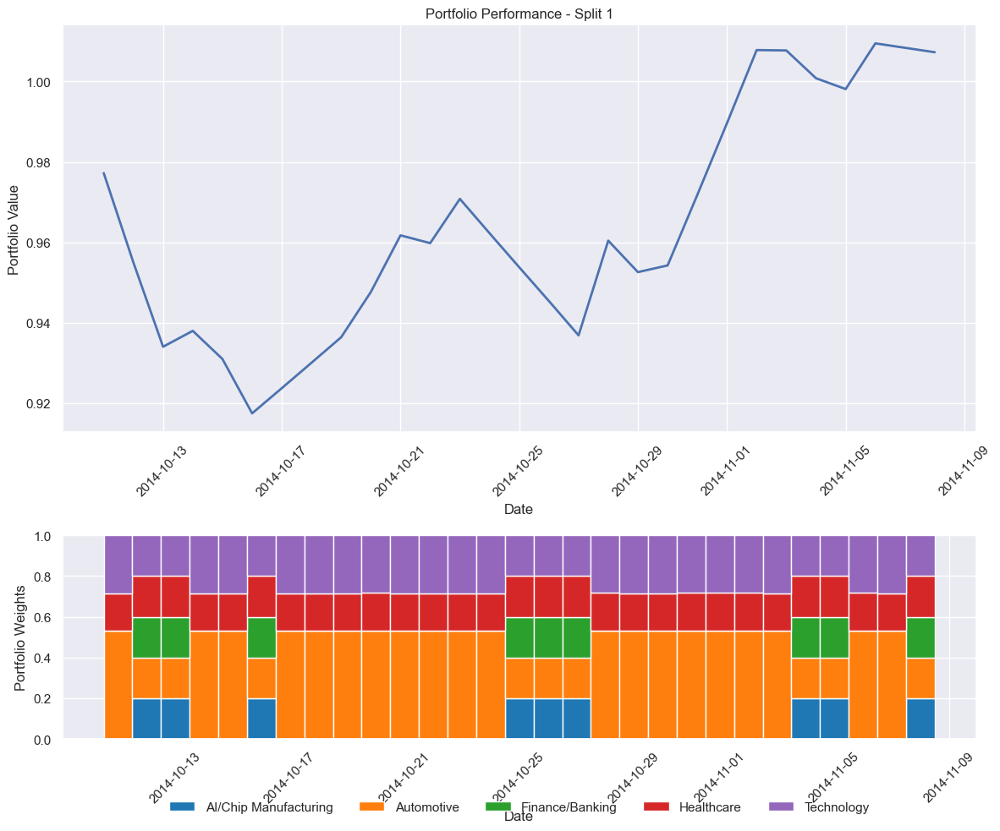


Processing split 2/124
Train period: 2014-01-02 00:00:00 to 2014-10-10 00:00:00
Validation period: 2014-10-11 00:00:00 to 2014-11-09 00:00:00
Test period: 2014-11-10 00:00:00 to 2014-12-09 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.4546
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 439  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 426          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0150046935 |
|    clip_fraction        | 0.165        |
|    clip_range          

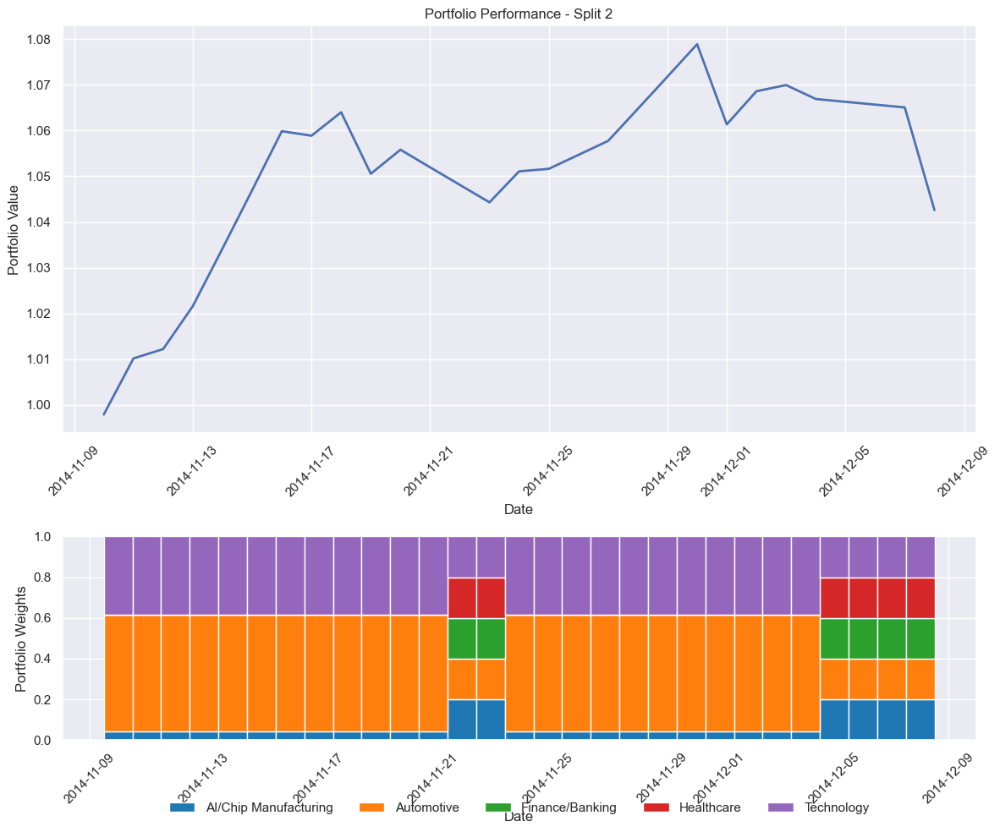


Processing split 3/124
Train period: 2014-01-02 00:00:00 to 2014-11-09 00:00:00
Validation period: 2014-11-10 00:00:00 to 2014-12-09 00:00:00
Test period: 2014-12-10 00:00:00 to 2015-01-08 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8004
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 447  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 435        |
|    iterations           | 2          |
|    time_elapsed         | 4          |
|    total_timesteps      | 2048       |
| train/                  |            |
|    approx_kl            | 0.01197175 |
|    clip_fraction        | 0.115      |
|    clip_range           | 0.2        |
| 

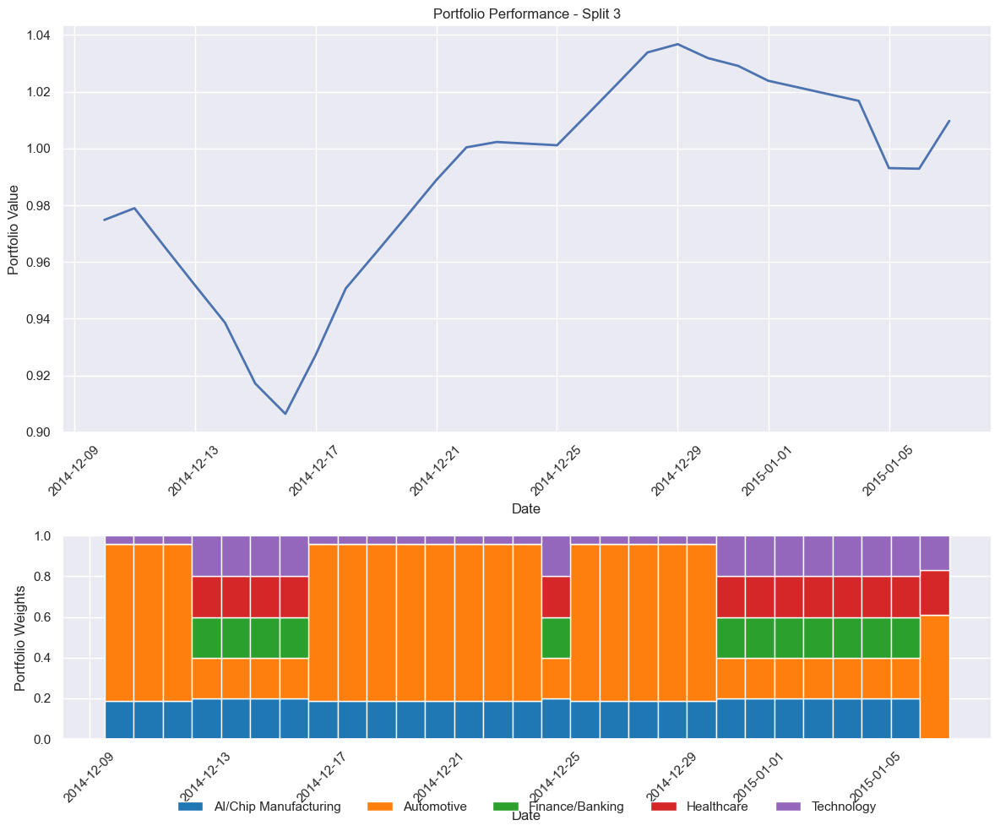


Processing split 4/124
Train period: 2014-01-02 00:00:00 to 2014-12-09 00:00:00
Validation period: 2014-12-10 00:00:00 to 2015-01-08 00:00:00
Test period: 2015-01-09 00:00:00 to 2015-02-07 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.1733
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 413  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 398         |
|    iterations           | 2           |
|    time_elapsed         | 5           |
|    total_timesteps      | 2048        |
| train/                  |             |
|    approx_kl            | 0.010014064 |
|    clip_fraction        | 0.105       |
|    clip_range           | 0.2   

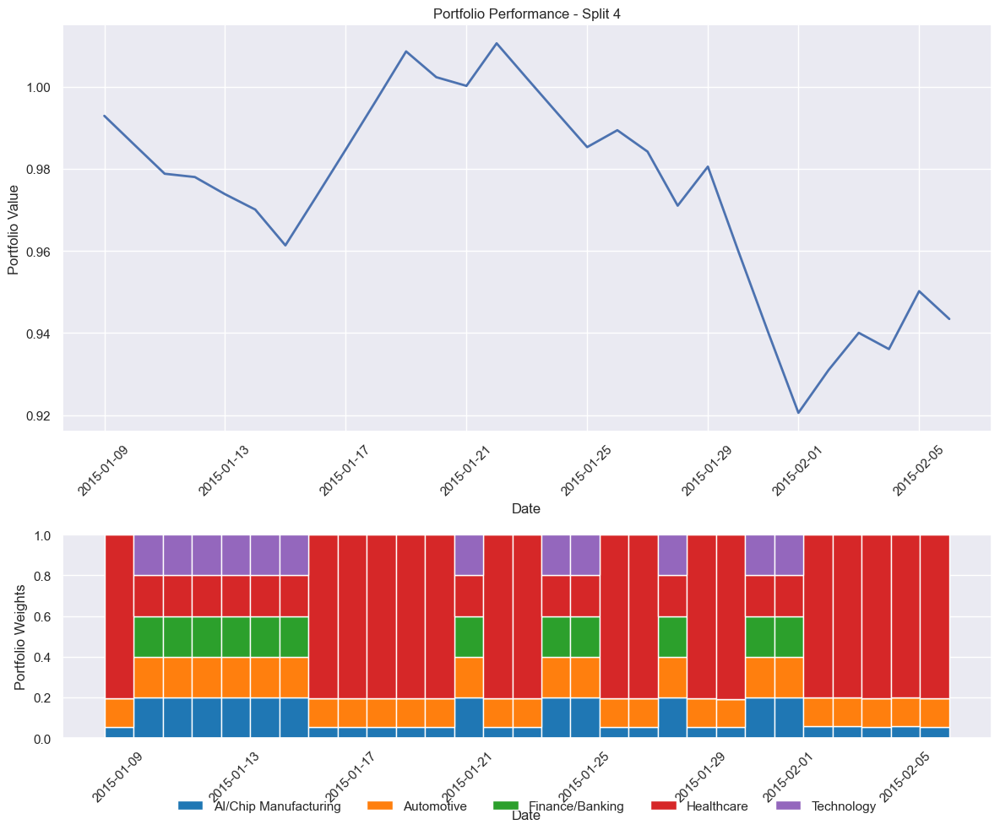


Processing split 5/124
Train period: 2014-01-02 00:00:00 to 2015-01-08 00:00:00
Validation period: 2015-01-09 00:00:00 to 2015-02-07 00:00:00
Test period: 2015-02-08 00:00:00 to 2015-03-09 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8171
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 425  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 410         |
|    iterations           | 2           |
|    time_elapsed         | 4           |
|    total_timesteps      | 2048        |
| train/                  |             |
|    approx_kl            | 0.009874406 |
|    clip_fraction        | 0.0994      |
|    clip_range           | 0.2   

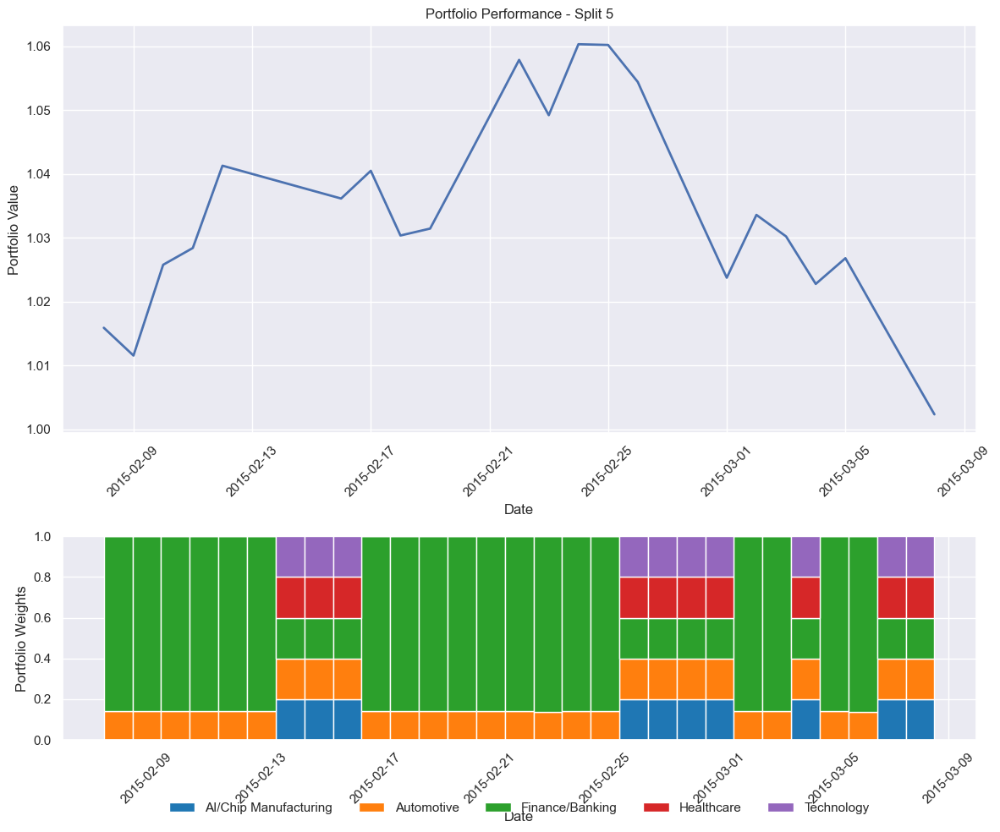


Processing split 6/124
Train period: 2014-01-02 00:00:00 to 2015-02-07 00:00:00
Validation period: 2015-02-08 00:00:00 to 2015-03-09 00:00:00
Test period: 2015-03-10 00:00:00 to 2015-04-08 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.6952
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 415  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 403         |
|    iterations           | 2           |
|    time_elapsed         | 5           |
|    total_timesteps      | 2048        |
| train/                  |             |
|    approx_kl            | 0.009437496 |
|    clip_fraction        | 0.0919      |
|    clip_range           | 0.2   

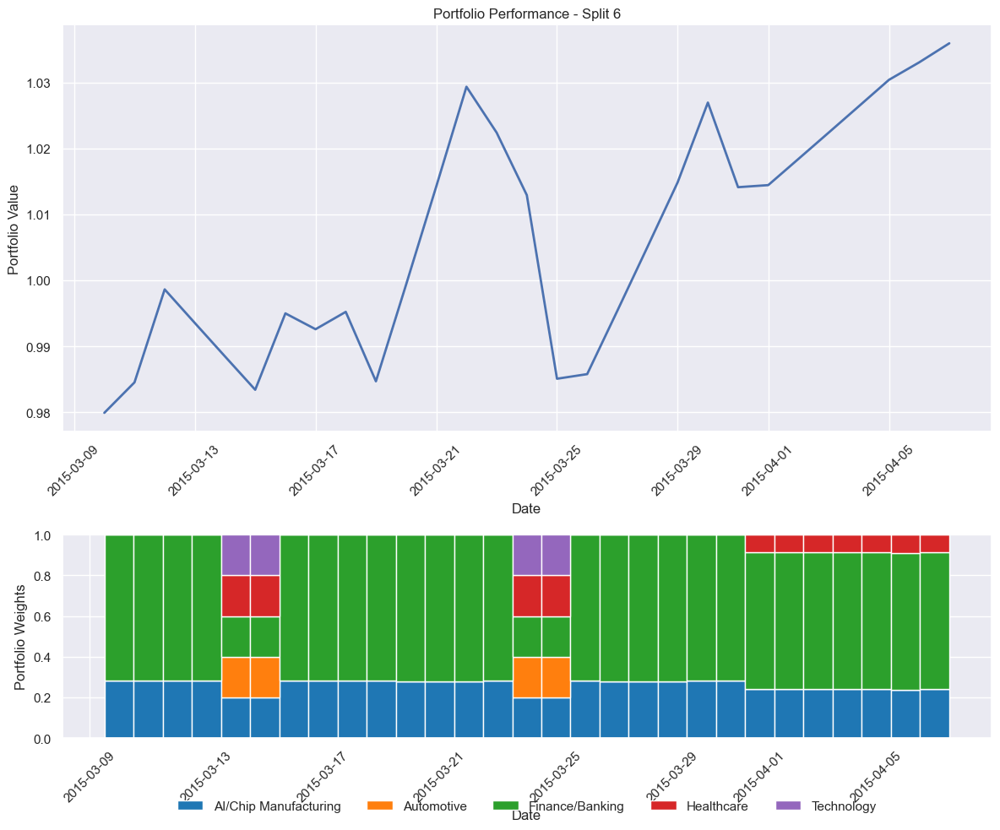


Processing split 7/124
Train period: 2014-01-02 00:00:00 to 2015-03-09 00:00:00
Validation period: 2015-03-10 00:00:00 to 2015-04-08 00:00:00
Test period: 2015-04-09 00:00:00 to 2015-05-08 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.6371
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 430  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 416         |
|    iterations           | 2           |
|    time_elapsed         | 4           |
|    total_timesteps      | 2048        |
| train/                  |             |
|    approx_kl            | 0.007072458 |
|    clip_fraction        | 0.0521      |
|    clip_range           | 0.2   

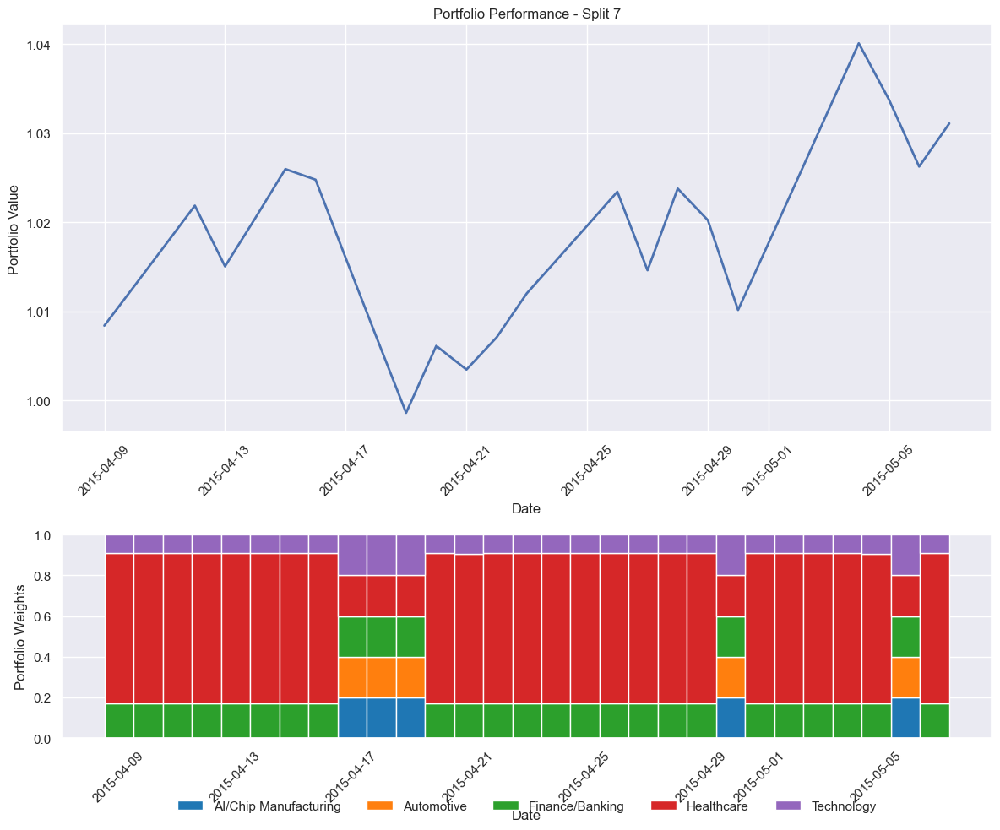


Processing split 8/124
Train period: 2014-01-02 00:00:00 to 2015-04-08 00:00:00
Validation period: 2015-04-09 00:00:00 to 2015-05-08 00:00:00
Test period: 2015-05-09 00:00:00 to 2015-06-07 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.6317
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 429  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 415          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0067003802 |
|    clip_fraction        | 0.0548       |
|    clip_range          

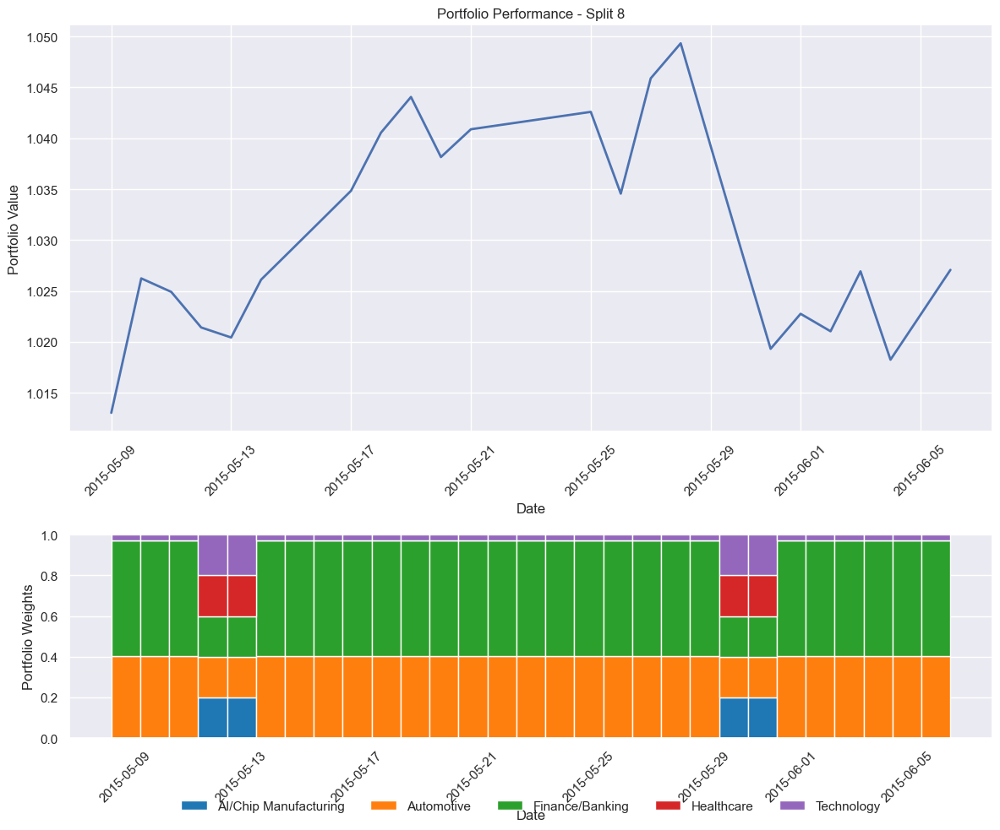


Processing split 9/124
Train period: 2014-01-02 00:00:00 to 2015-05-08 00:00:00
Validation period: 2015-05-09 00:00:00 to 2015-06-07 00:00:00
Test period: 2015-06-08 00:00:00 to 2015-07-07 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.0001
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 424  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 413          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0068540704 |
|    clip_fraction        | 0.051        |
|    clip_range          

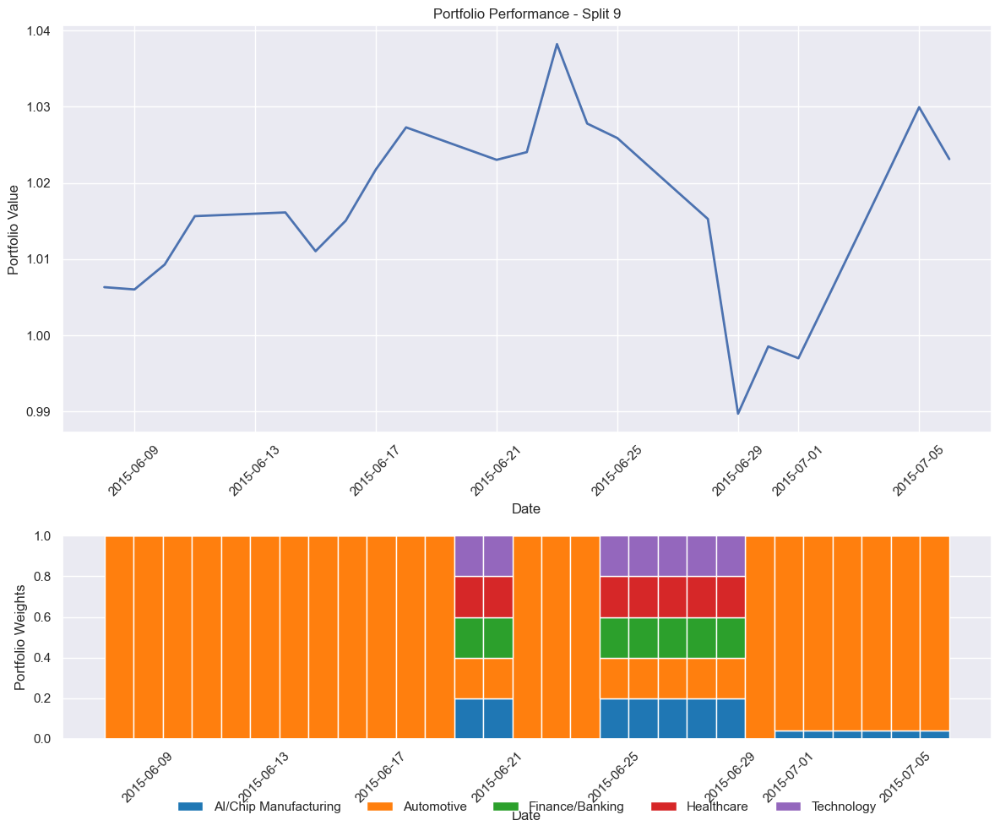


Processing split 10/124
Train period: 2014-01-02 00:00:00 to 2015-06-07 00:00:00
Validation period: 2015-06-08 00:00:00 to 2015-07-07 00:00:00
Test period: 2015-07-08 00:00:00 to 2015-08-06 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.0477
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 426  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
---------------------------------------
| time/                   |           |
|    fps                  | 412       |
|    iterations           | 2         |
|    time_elapsed         | 4         |
|    total_timesteps      | 2048      |
| train/                  |           |
|    approx_kl            | 0.0061706 |
|    clip_fraction        | 0.0456    |
|    clip_range           | 0.2       |
|    entrop

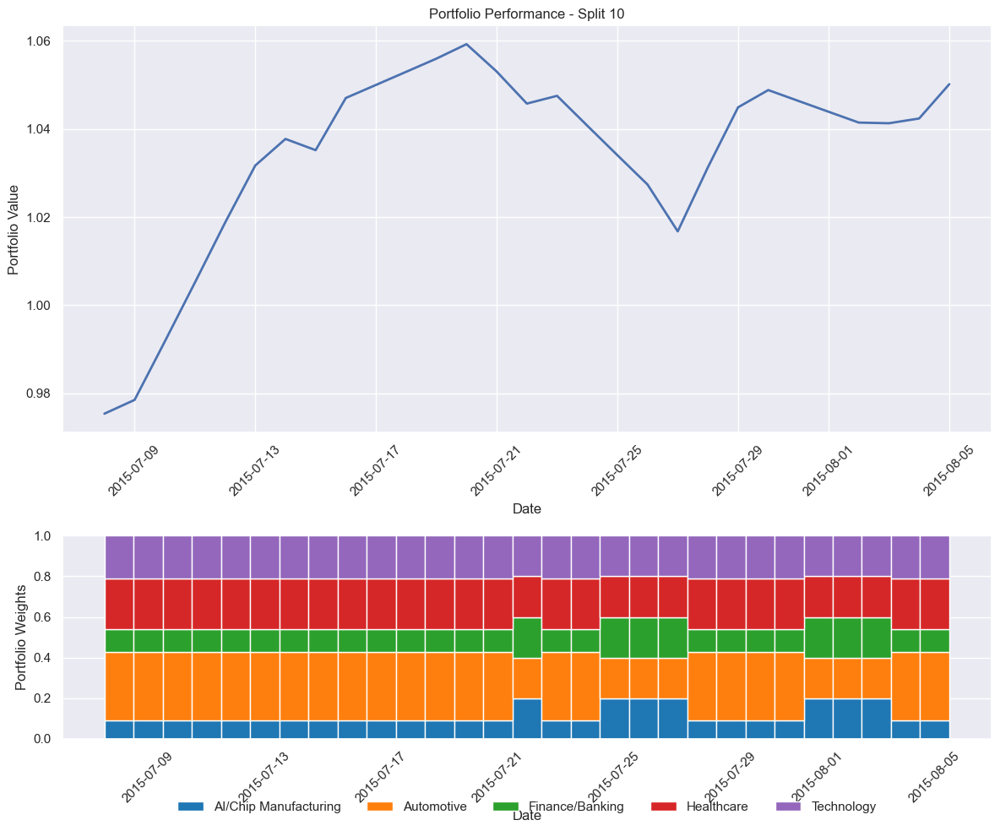


Processing split 11/124
Train period: 2014-01-02 00:00:00 to 2015-07-07 00:00:00
Validation period: 2015-07-08 00:00:00 to 2015-08-06 00:00:00
Test period: 2015-08-07 00:00:00 to 2015-09-05 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8781
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 424  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 412         |
|    iterations           | 2           |
|    time_elapsed         | 4           |
|    total_timesteps      | 2048        |
| train/                  |             |
|    approx_kl            | 0.006414861 |
|    clip_fraction        | 0.0532      |
|    clip_range           | 0.2  

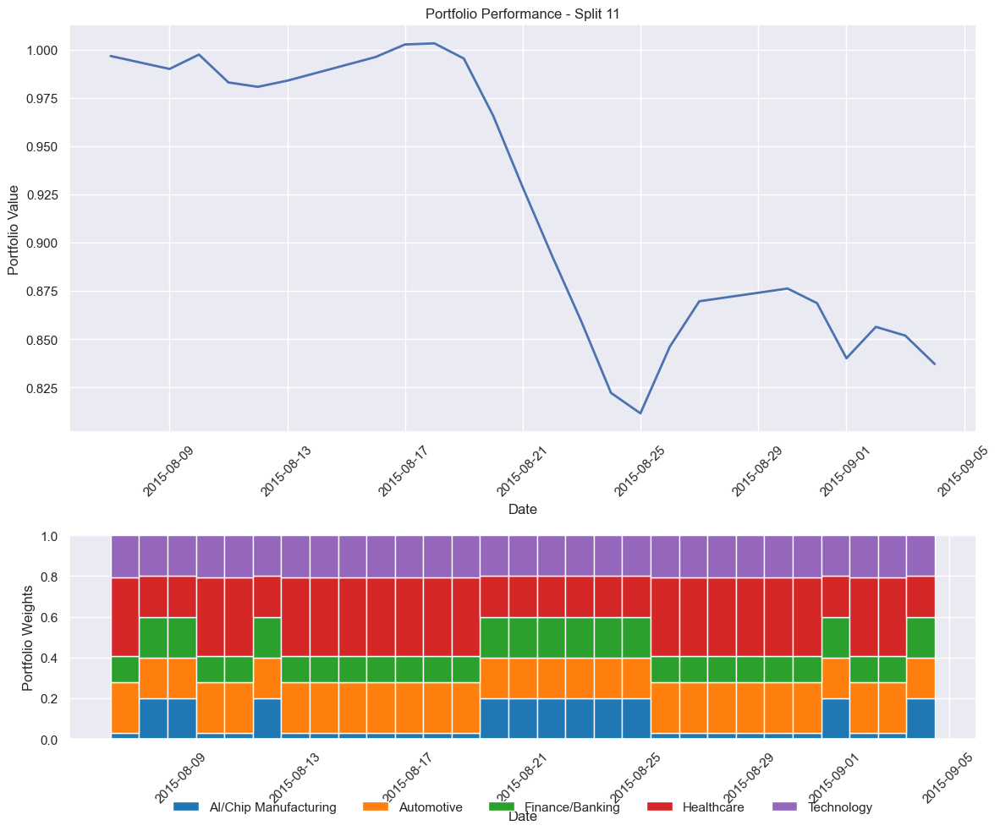


Processing split 12/124
Train period: 2014-01-02 00:00:00 to 2015-08-06 00:00:00
Validation period: 2015-08-07 00:00:00 to 2015-09-05 00:00:00
Test period: 2015-09-06 00:00:00 to 2015-10-05 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.1699
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 389  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 393          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0060762386 |
|    clip_fraction        | 0.0537       |
|    clip_range         

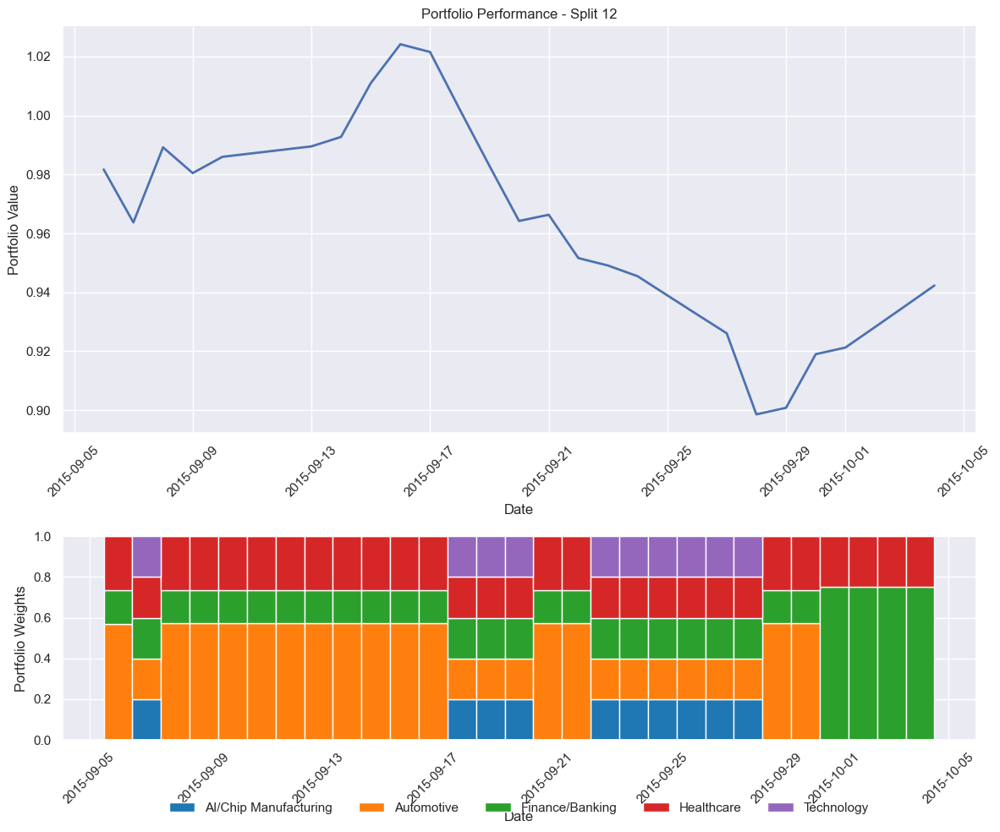


Processing split 13/124
Train period: 2014-01-02 00:00:00 to 2015-09-05 00:00:00
Validation period: 2015-09-06 00:00:00 to 2015-10-05 00:00:00
Test period: 2015-10-06 00:00:00 to 2015-11-04 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.5059
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 424  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 411          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0066866656 |
|    clip_fraction        | 0.058        |
|    clip_range         

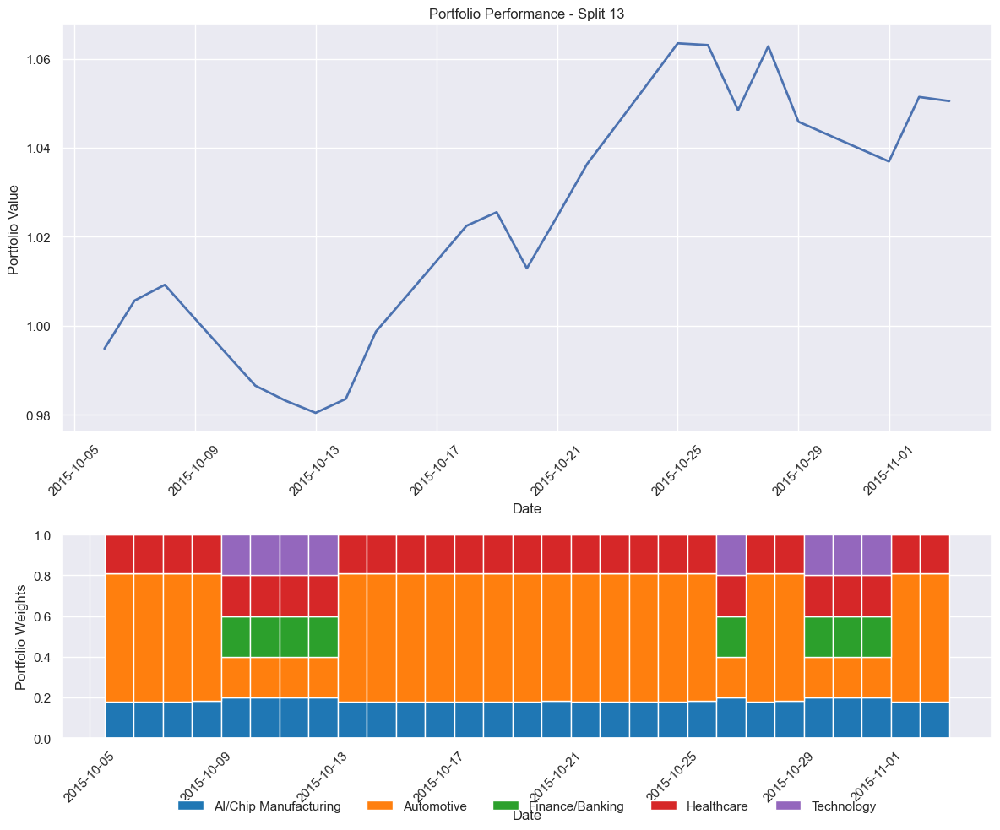


Processing split 14/124
Train period: 2014-01-02 00:00:00 to 2015-10-05 00:00:00
Validation period: 2015-10-06 00:00:00 to 2015-11-04 00:00:00
Test period: 2015-11-05 00:00:00 to 2015-12-04 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.5392
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 423  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 411        |
|    iterations           | 2          |
|    time_elapsed         | 4          |
|    total_timesteps      | 2048       |
| train/                  |            |
|    approx_kl            | 0.00570829 |
|    clip_fraction        | 0.0541     |
|    clip_range           | 0.2        |
|

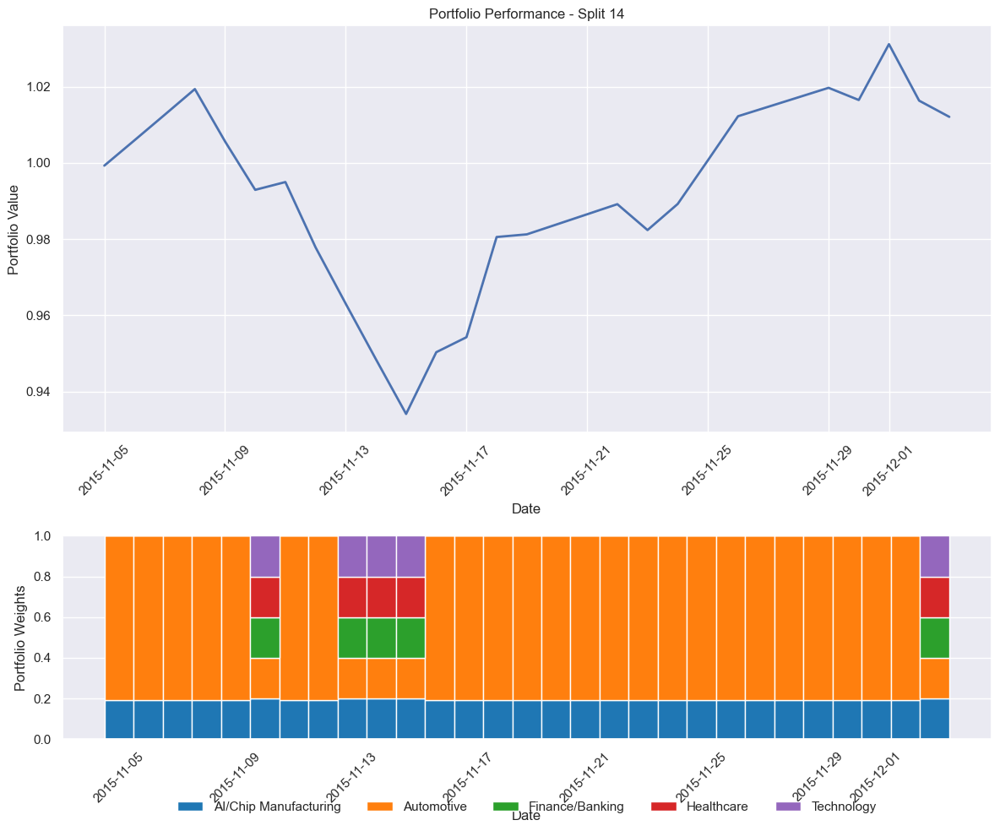


Processing split 15/124
Train period: 2014-01-02 00:00:00 to 2015-11-04 00:00:00
Validation period: 2015-11-05 00:00:00 to 2015-12-04 00:00:00
Test period: 2015-12-05 00:00:00 to 2016-01-03 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8684
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 422  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 410         |
|    iterations           | 2           |
|    time_elapsed         | 4           |
|    total_timesteps      | 2048        |
| train/                  |             |
|    approx_kl            | 0.006620151 |
|    clip_fraction        | 0.0613      |
|    clip_range           | 0.2  

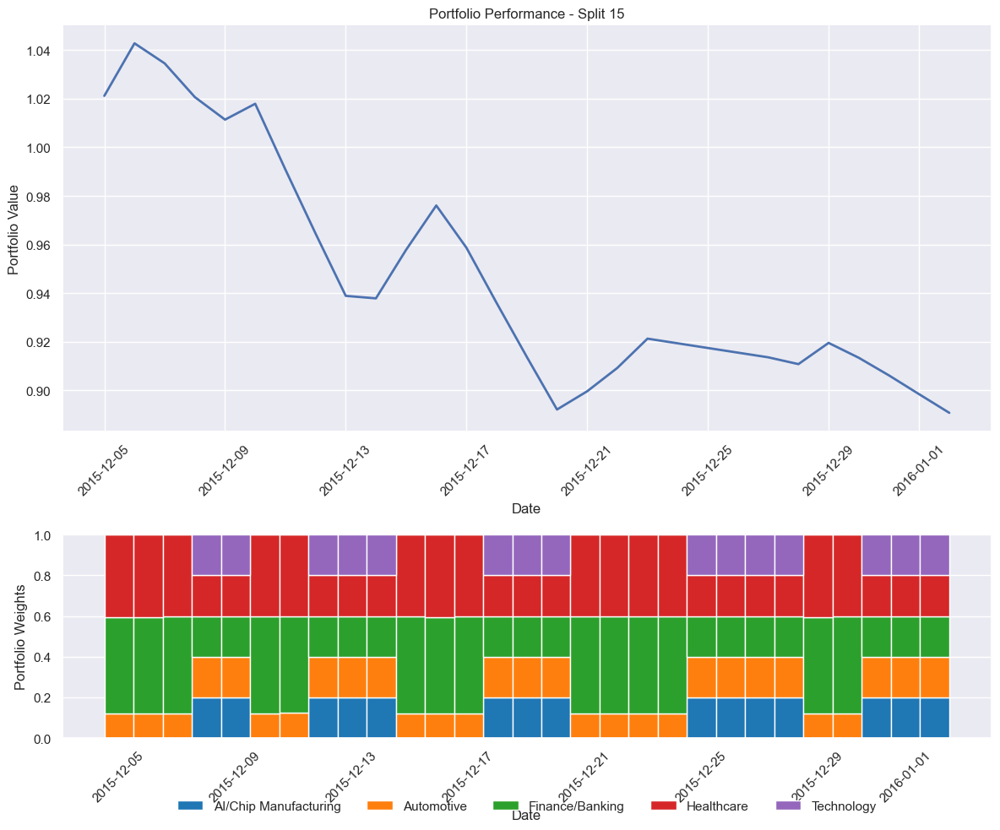


Processing split 16/124
Train period: 2014-01-02 00:00:00 to 2015-12-04 00:00:00
Validation period: 2015-12-05 00:00:00 to 2016-01-03 00:00:00
Test period: 2016-01-04 00:00:00 to 2016-02-02 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8738
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 422  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 410          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0067936657 |
|    clip_fraction        | 0.0661       |
|    clip_range         

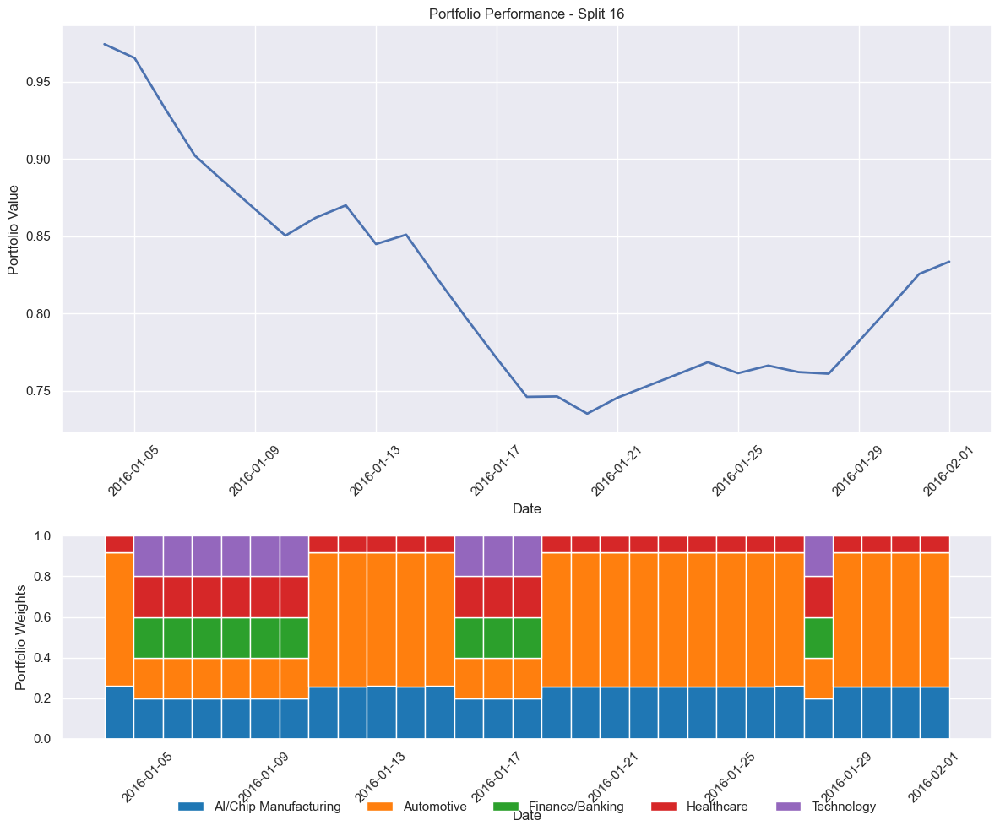


Processing split 17/124
Train period: 2014-01-02 00:00:00 to 2016-01-03 00:00:00
Validation period: 2016-01-04 00:00:00 to 2016-02-02 00:00:00
Test period: 2016-02-03 00:00:00 to 2016-03-03 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.5558
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 418  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 407          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0071648112 |
|    clip_fraction        | 0.0696       |
|    clip_range         

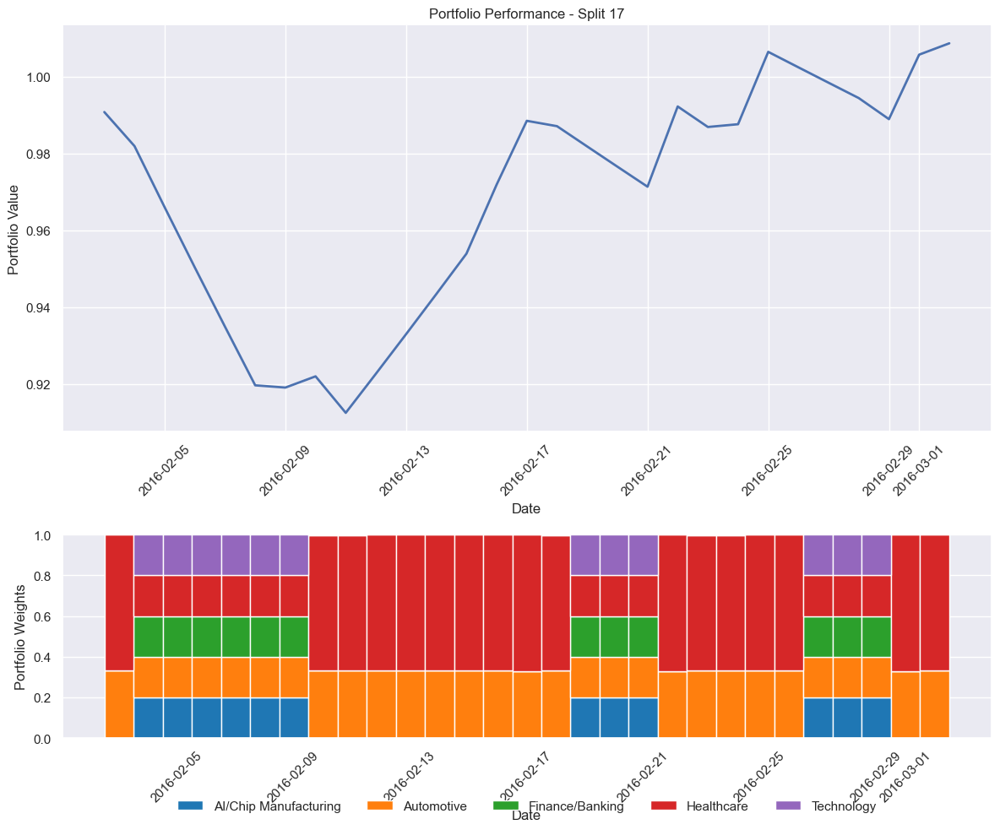


Processing split 18/124
Train period: 2014-01-02 00:00:00 to 2016-02-02 00:00:00
Validation period: 2016-02-03 00:00:00 to 2016-03-03 00:00:00
Test period: 2016-03-04 00:00:00 to 2016-04-02 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.2545
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 421  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 398          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0066181384 |
|    clip_fraction        | 0.0625       |
|    clip_range         

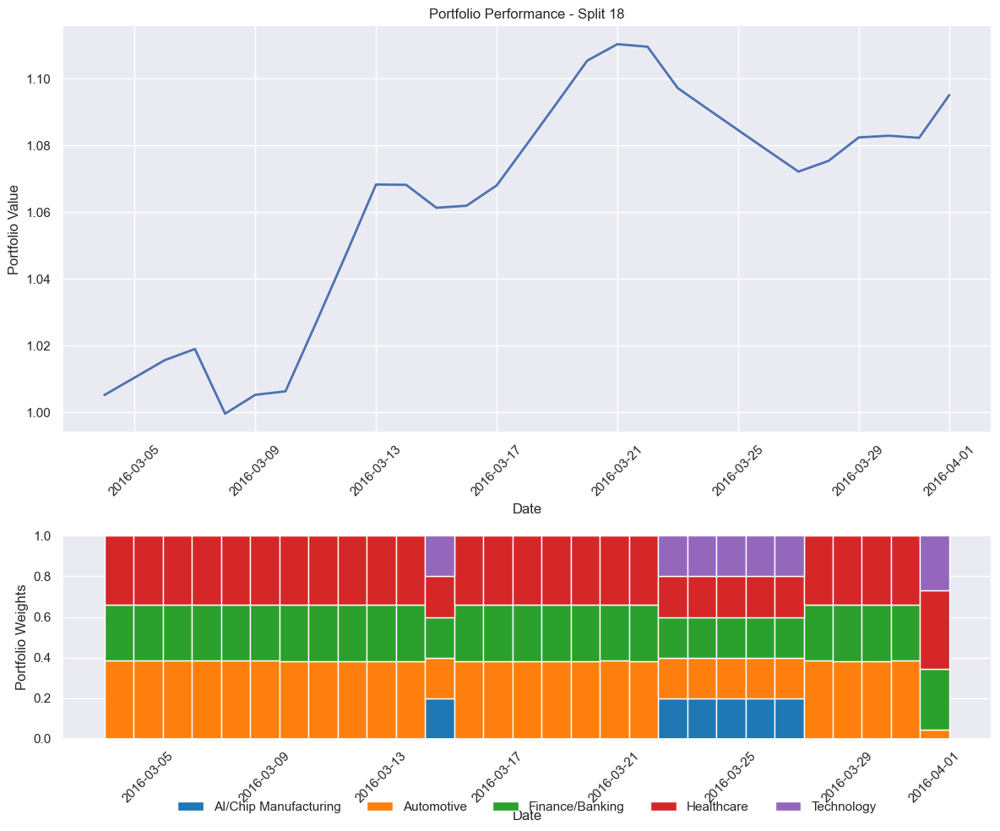


Processing split 19/124
Train period: 2014-01-02 00:00:00 to 2016-03-03 00:00:00
Validation period: 2016-03-04 00:00:00 to 2016-04-02 00:00:00
Test period: 2016-04-03 00:00:00 to 2016-05-02 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.2085
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 423  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 411         |
|    iterations           | 2           |
|    time_elapsed         | 4           |
|    total_timesteps      | 2048        |
| train/                  |             |
|    approx_kl            | 0.006372783 |
|    clip_fraction        | 0.0604      |
|    clip_range           | 0.2  

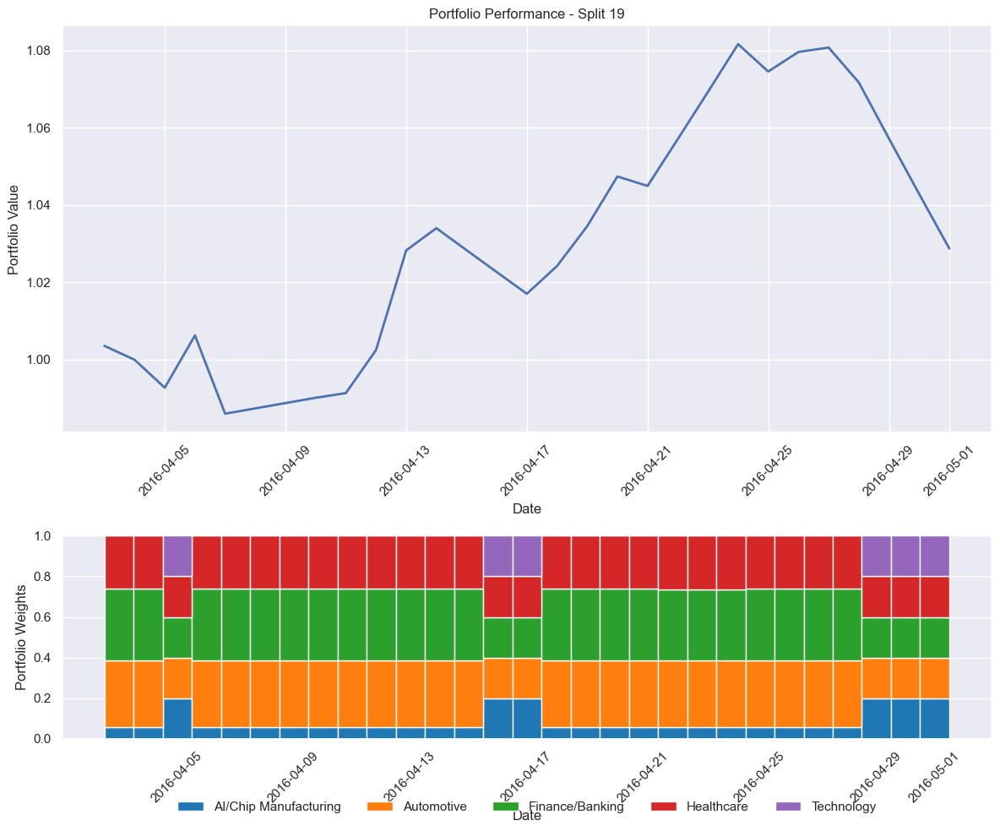


Processing split 20/124
Train period: 2014-01-02 00:00:00 to 2016-04-02 00:00:00
Validation period: 2016-04-03 00:00:00 to 2016-05-02 00:00:00
Test period: 2016-05-03 00:00:00 to 2016-06-01 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.3933
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 424  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 406          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0061340993 |
|    clip_fraction        | 0.0623       |
|    clip_range         

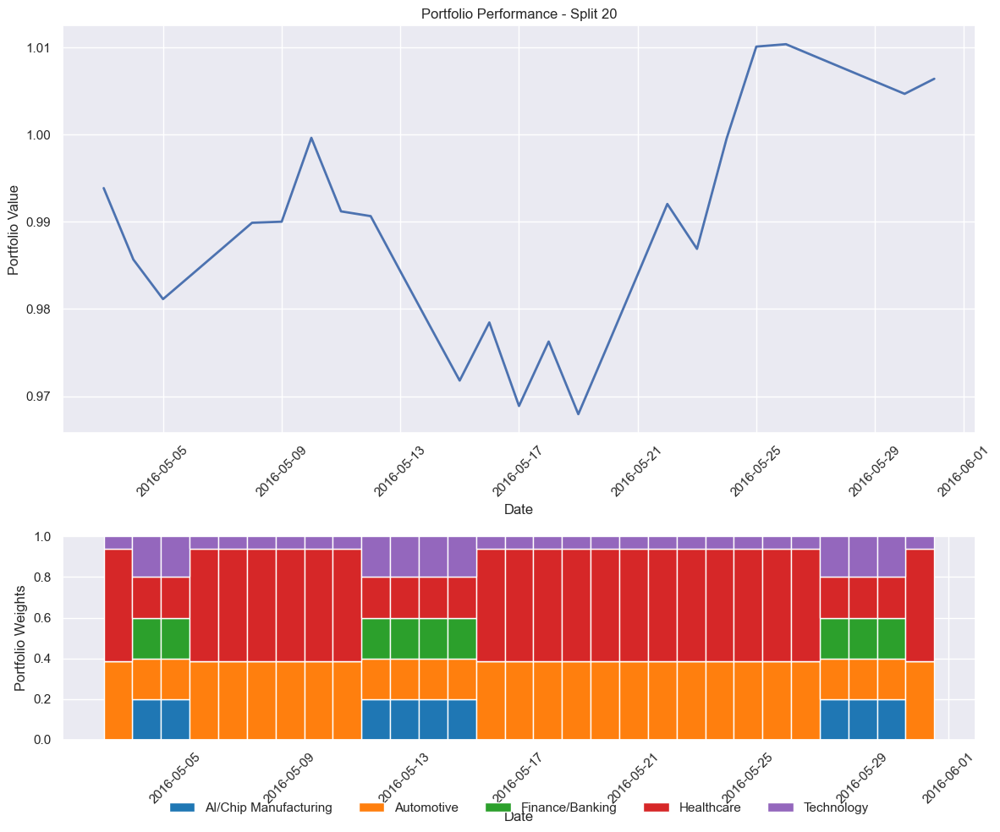


Processing split 21/124
Train period: 2014-01-02 00:00:00 to 2016-05-02 00:00:00
Validation period: 2016-05-03 00:00:00 to 2016-06-01 00:00:00
Test period: 2016-06-02 00:00:00 to 2016-07-01 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.4798
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 416  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 407          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0061066635 |
|    clip_fraction        | 0.062        |
|    clip_range         

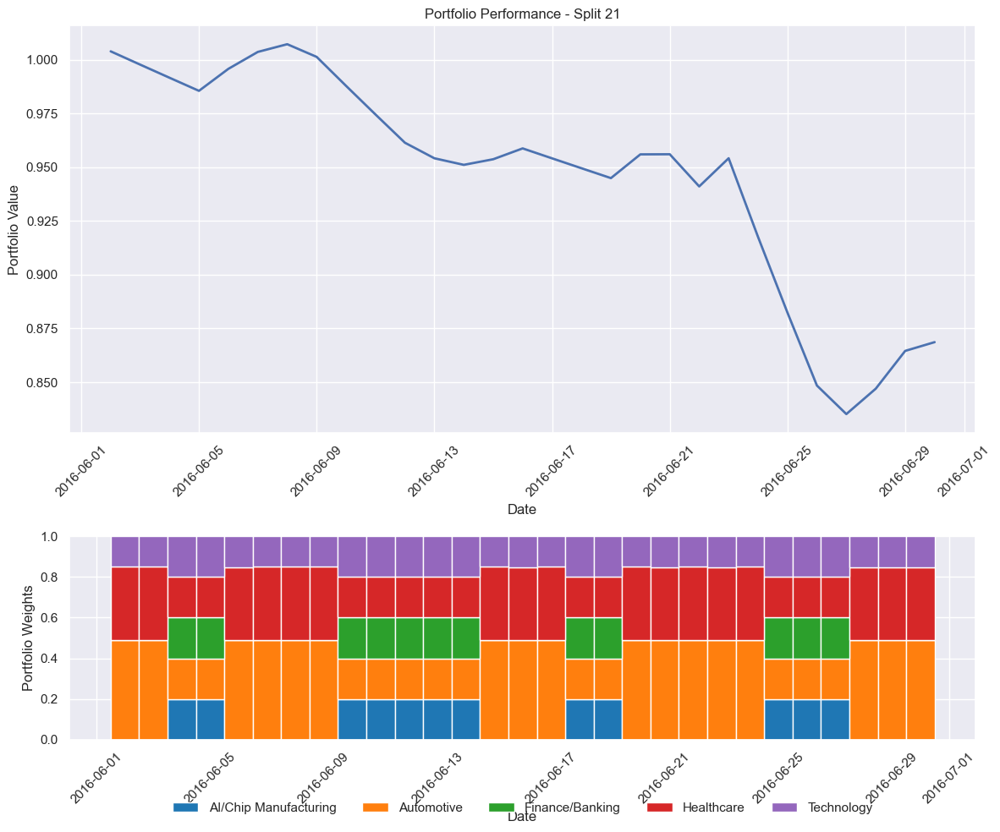


Processing split 22/124
Train period: 2014-01-02 00:00:00 to 2016-06-01 00:00:00
Validation period: 2016-06-02 00:00:00 to 2016-07-01 00:00:00
Test period: 2016-07-02 00:00:00 to 2016-07-31 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.7122
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 422  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 410         |
|    iterations           | 2           |
|    time_elapsed         | 4           |
|    total_timesteps      | 2048        |
| train/                  |             |
|    approx_kl            | 0.005982452 |
|    clip_fraction        | 0.061       |
|    clip_range           | 0.2  

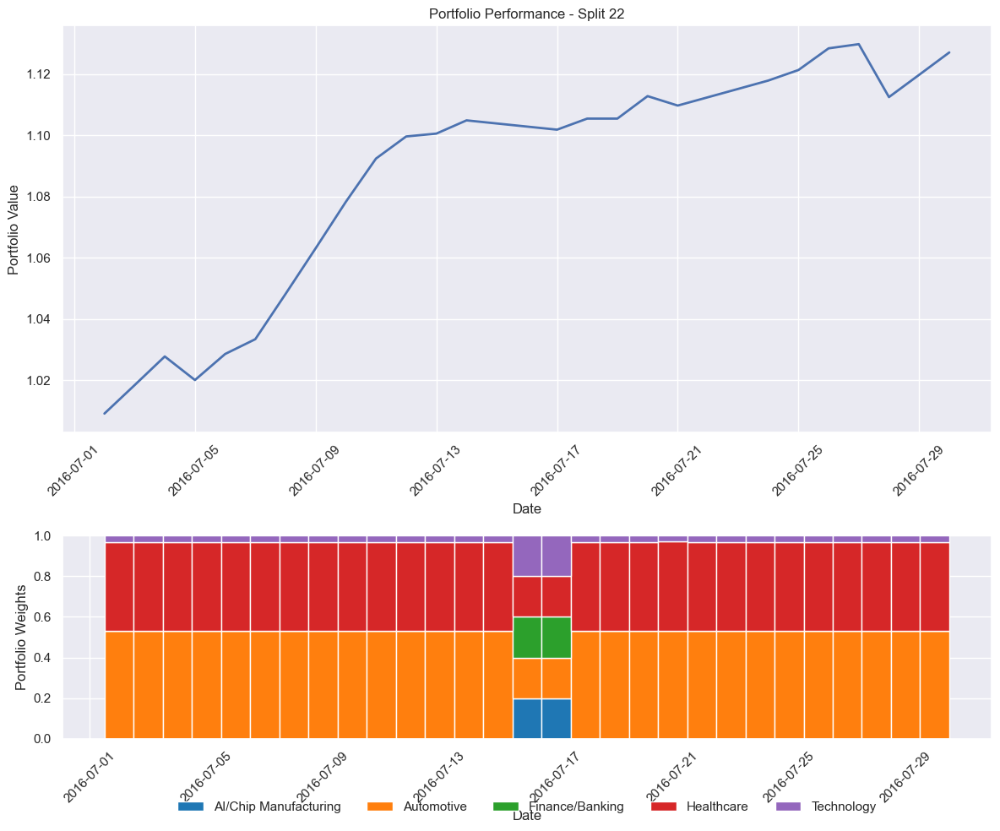


Processing split 23/124
Train period: 2014-01-02 00:00:00 to 2016-07-01 00:00:00
Validation period: 2016-07-02 00:00:00 to 2016-07-31 00:00:00
Test period: 2016-08-01 00:00:00 to 2016-08-30 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.5456
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 418  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 408          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0059615257 |
|    clip_fraction        | 0.0598       |
|    clip_range         

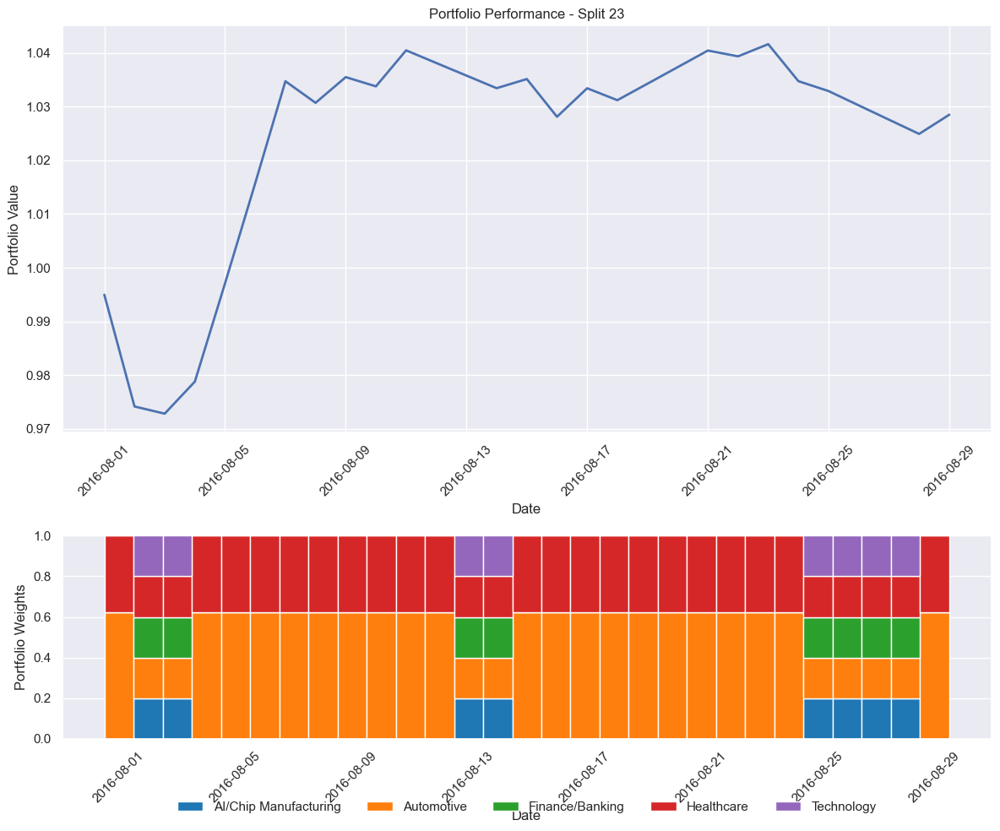


Processing split 24/124
Train period: 2014-01-02 00:00:00 to 2016-07-31 00:00:00
Validation period: 2016-08-01 00:00:00 to 2016-08-30 00:00:00
Test period: 2016-08-31 00:00:00 to 2016-09-29 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.7564
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 419  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
---------------------------------------
| time/                   |           |
|    fps                  | 407       |
|    iterations           | 2         |
|    time_elapsed         | 5         |
|    total_timesteps      | 2048      |
| train/                  |           |
|    approx_kl            | 0.0061948 |
|    clip_fraction        | 0.0593    |
|    clip_range           | 0.2       |
|    entrop

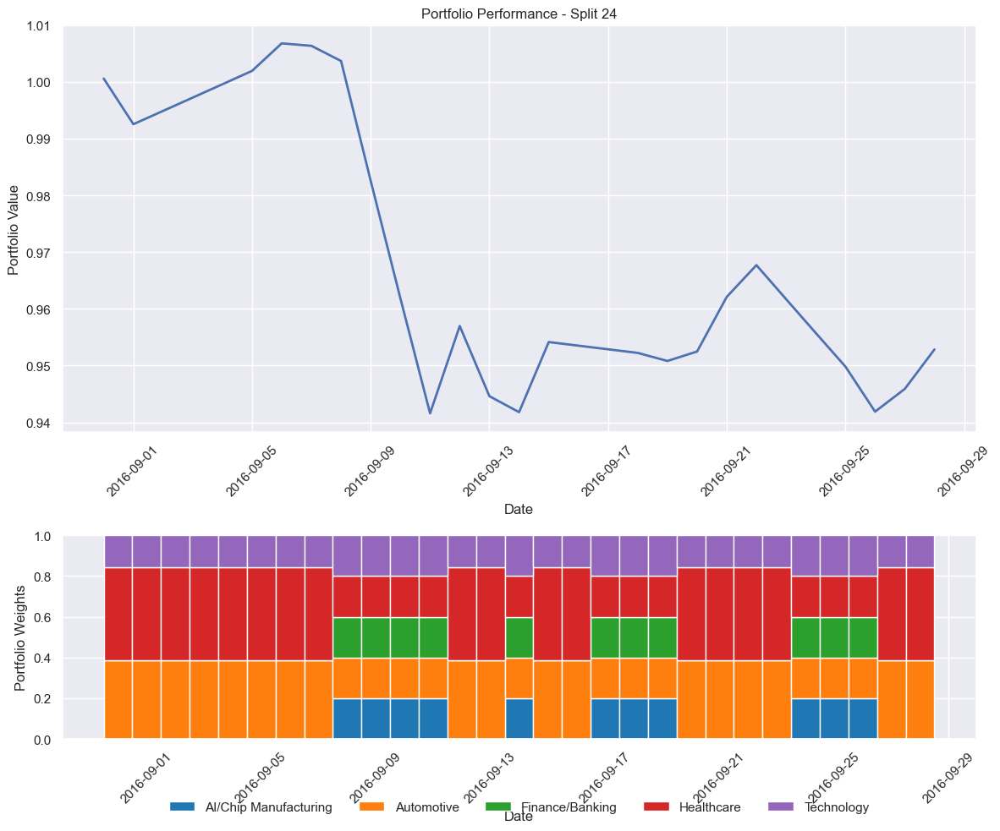


Processing split 25/124
Train period: 2014-01-02 00:00:00 to 2016-08-30 00:00:00
Validation period: 2016-08-31 00:00:00 to 2016-09-29 00:00:00
Test period: 2016-09-30 00:00:00 to 2016-10-29 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9156
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 400  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 400          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0067058457 |
|    clip_fraction        | 0.0625       |
|    clip_range         

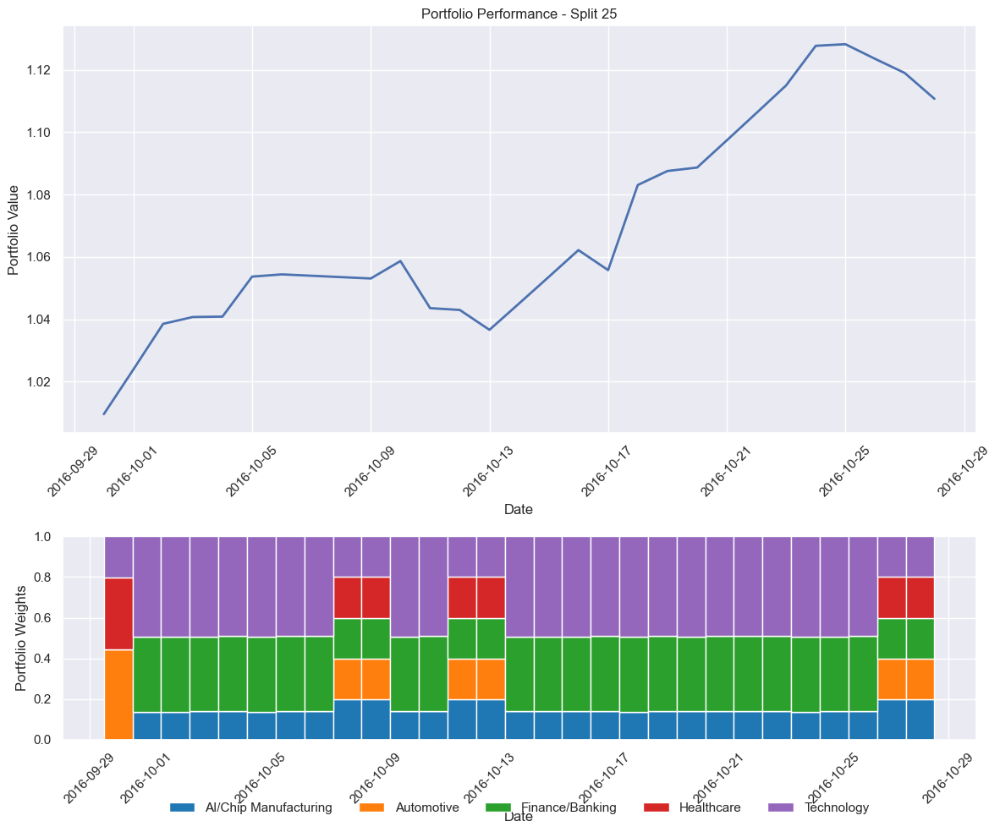


Processing split 26/124
Train period: 2014-01-02 00:00:00 to 2016-09-29 00:00:00
Validation period: 2016-09-30 00:00:00 to 2016-10-29 00:00:00
Test period: 2016-10-30 00:00:00 to 2016-11-28 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8089
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 424  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 412         |
|    iterations           | 2           |
|    time_elapsed         | 4           |
|    total_timesteps      | 2048        |
| train/                  |             |
|    approx_kl            | 0.006732825 |
|    clip_fraction        | 0.0612      |
|    clip_range           | 0.2  

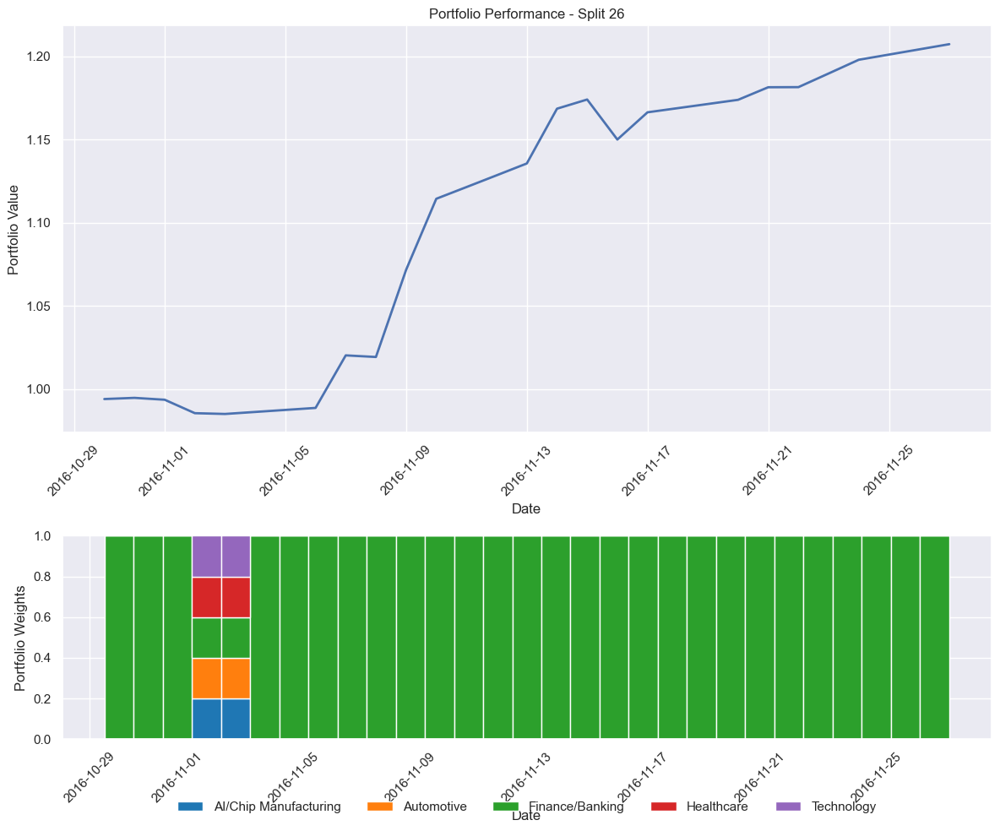


Processing split 27/124
Train period: 2014-01-02 00:00:00 to 2016-10-29 00:00:00
Validation period: 2016-10-30 00:00:00 to 2016-11-28 00:00:00
Test period: 2016-11-29 00:00:00 to 2016-12-28 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8299
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 400  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 401          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

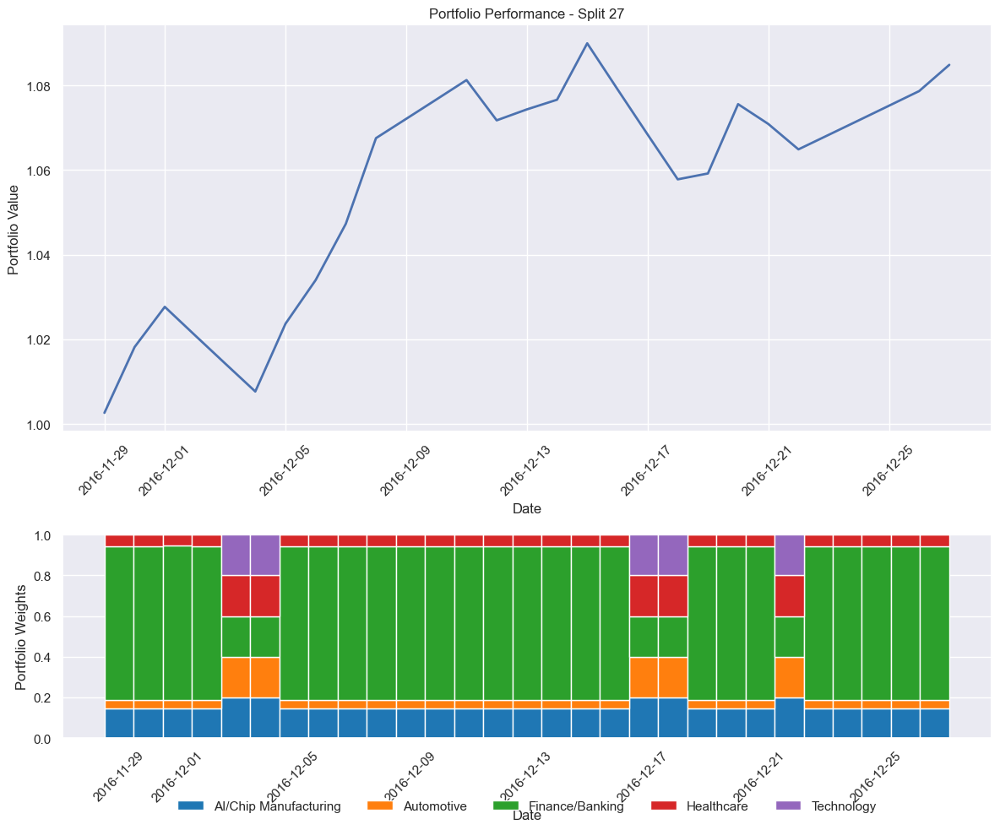


Processing split 28/124
Train period: 2014-01-02 00:00:00 to 2016-11-28 00:00:00
Validation period: 2016-11-29 00:00:00 to 2016-12-28 00:00:00
Test period: 2016-12-29 00:00:00 to 2017-01-27 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9875
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 410  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 405          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

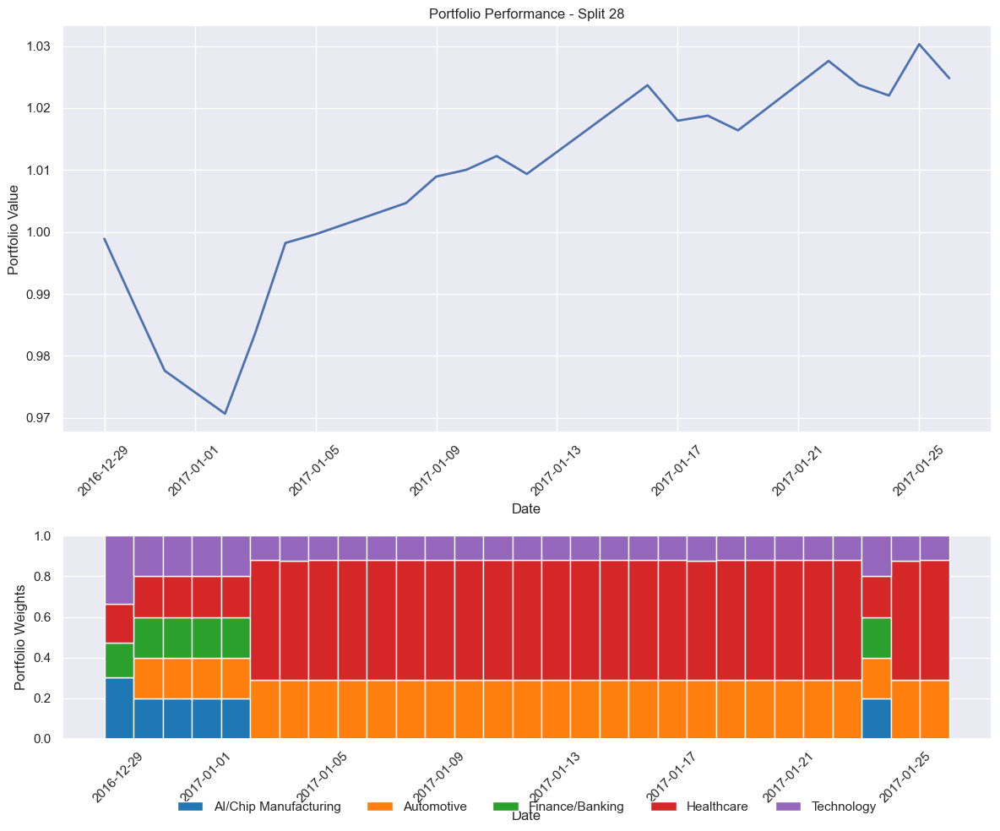


Processing split 29/124
Train period: 2014-01-02 00:00:00 to 2016-12-28 00:00:00
Validation period: 2016-12-29 00:00:00 to 2017-01-27 00:00:00
Test period: 2017-01-28 00:00:00 to 2017-02-26 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.0923
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 385  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 393          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

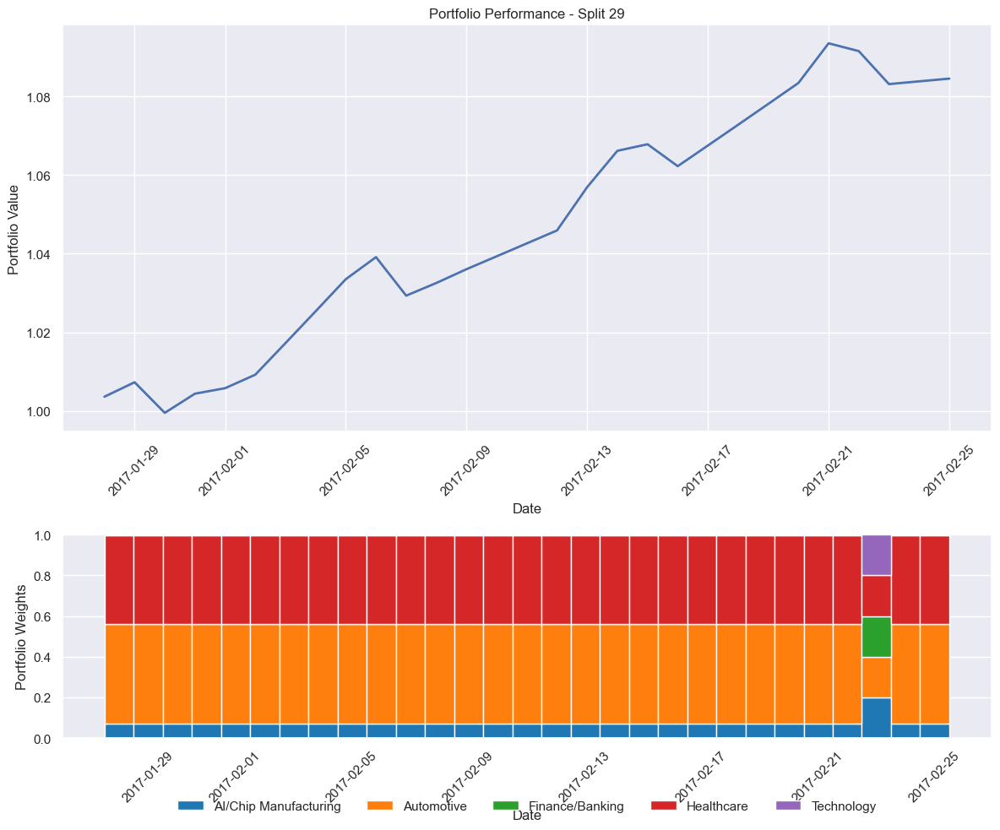


Processing split 30/124
Train period: 2014-01-02 00:00:00 to 2017-01-27 00:00:00
Validation period: 2017-01-28 00:00:00 to 2017-02-26 00:00:00
Test period: 2017-02-27 00:00:00 to 2017-03-28 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.0682
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 433  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 426          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

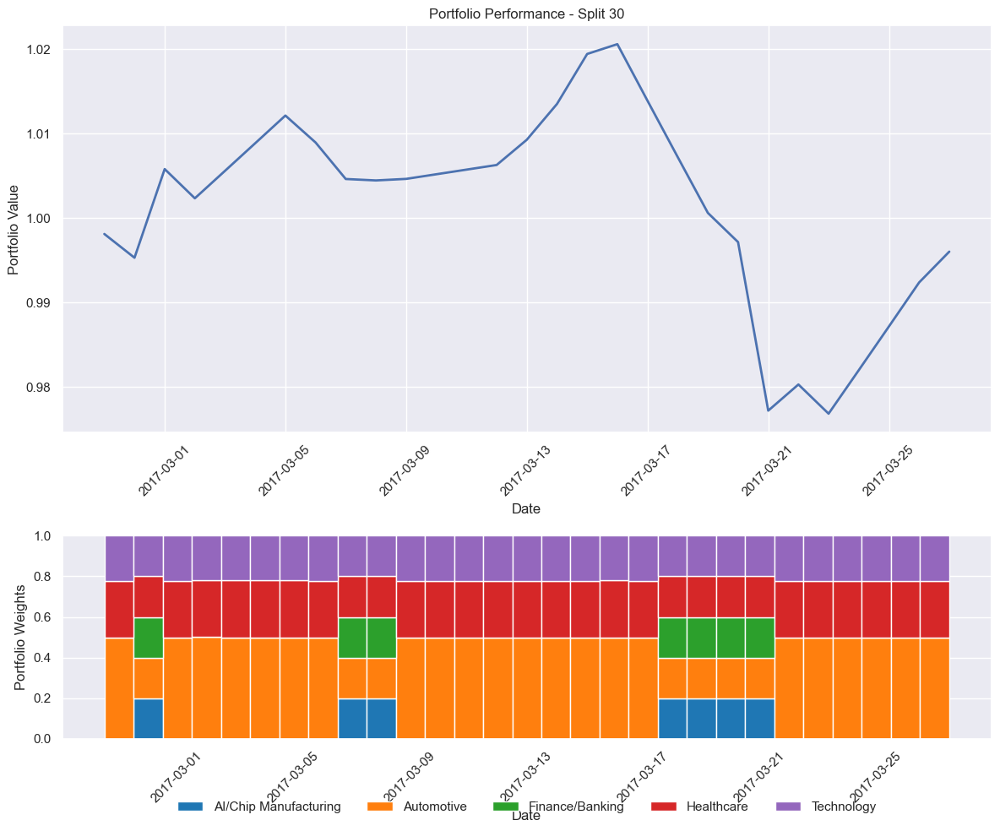


Processing split 31/124
Train period: 2014-01-02 00:00:00 to 2017-02-26 00:00:00
Validation period: 2017-02-27 00:00:00 to 2017-03-28 00:00:00
Test period: 2017-03-29 00:00:00 to 2017-04-27 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.1232
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 432  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 418          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

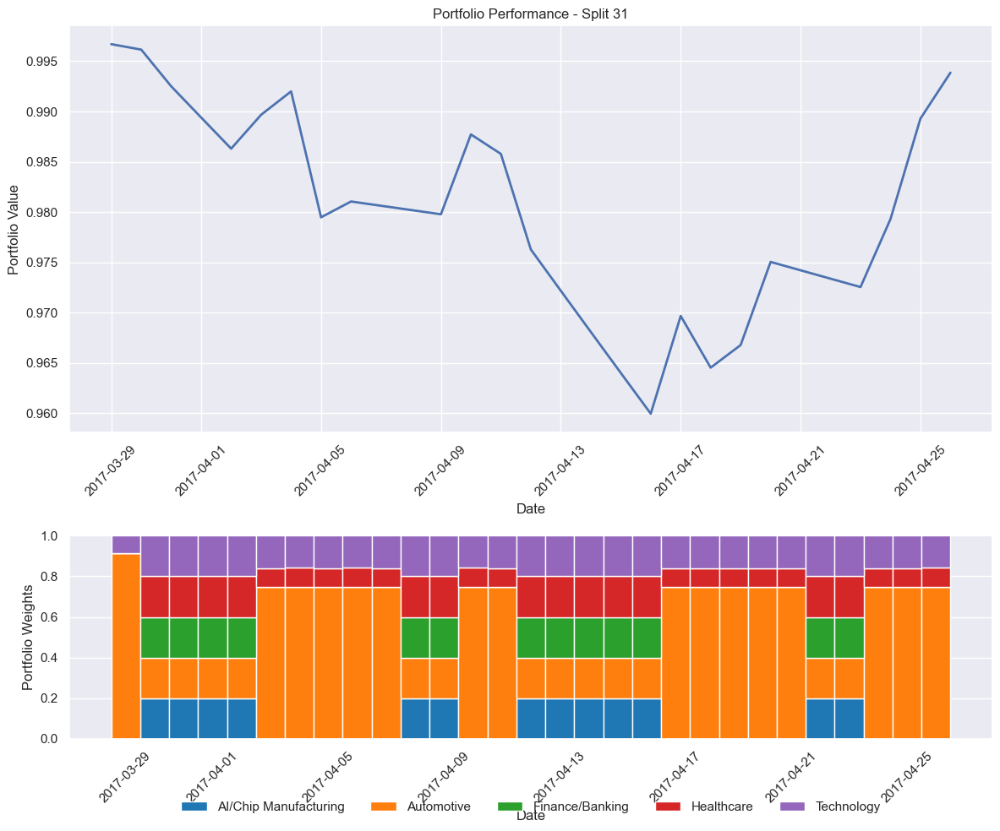


Processing split 32/124
Train period: 2014-01-02 00:00:00 to 2017-03-28 00:00:00
Validation period: 2017-03-29 00:00:00 to 2017-04-27 00:00:00
Test period: 2017-04-28 00:00:00 to 2017-05-27 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.1133
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 437  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 426          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

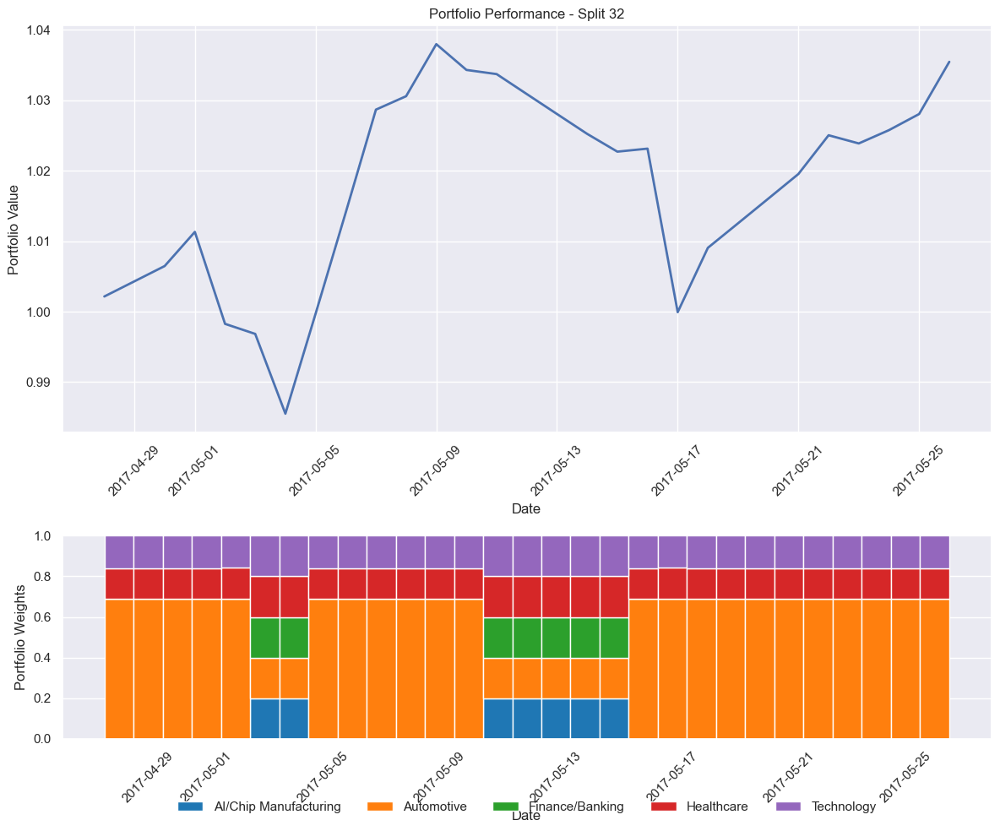


Processing split 33/124
Train period: 2014-01-02 00:00:00 to 2017-04-27 00:00:00
Validation period: 2017-04-28 00:00:00 to 2017-05-27 00:00:00
Test period: 2017-05-28 00:00:00 to 2017-06-26 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.0885
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 389  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 367          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

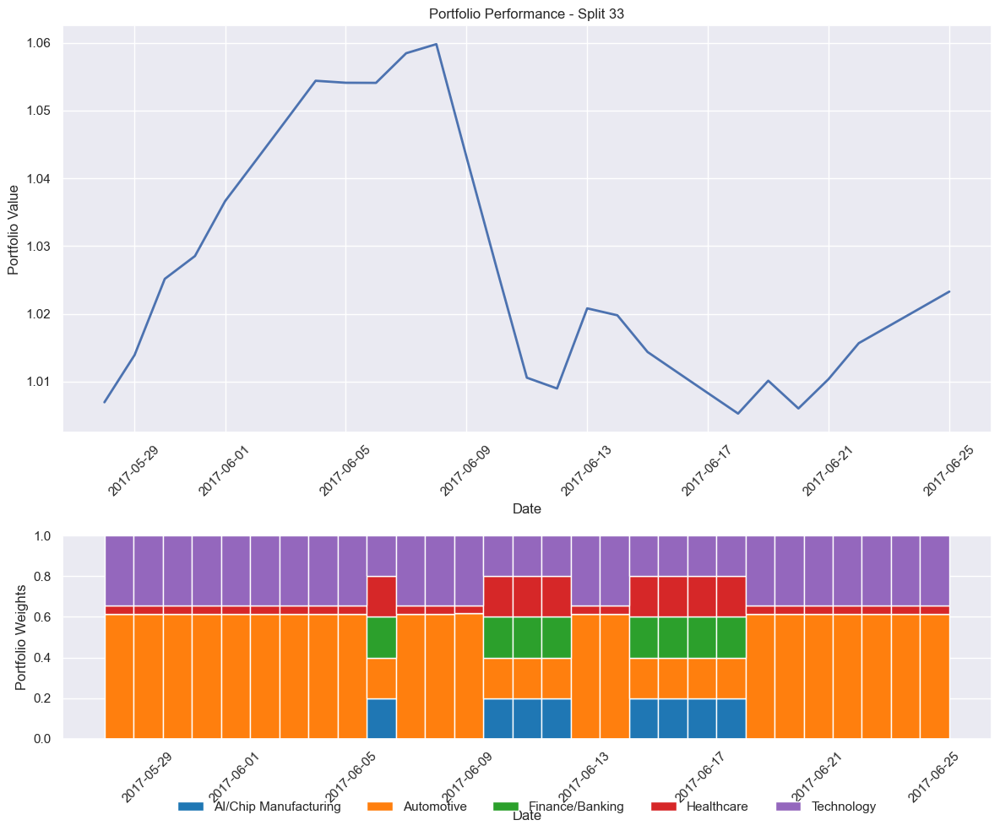


Processing split 34/124
Train period: 2014-01-02 00:00:00 to 2017-05-27 00:00:00
Validation period: 2017-05-28 00:00:00 to 2017-06-26 00:00:00
Test period: 2017-06-27 00:00:00 to 2017-07-26 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.1085
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 408  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 401          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

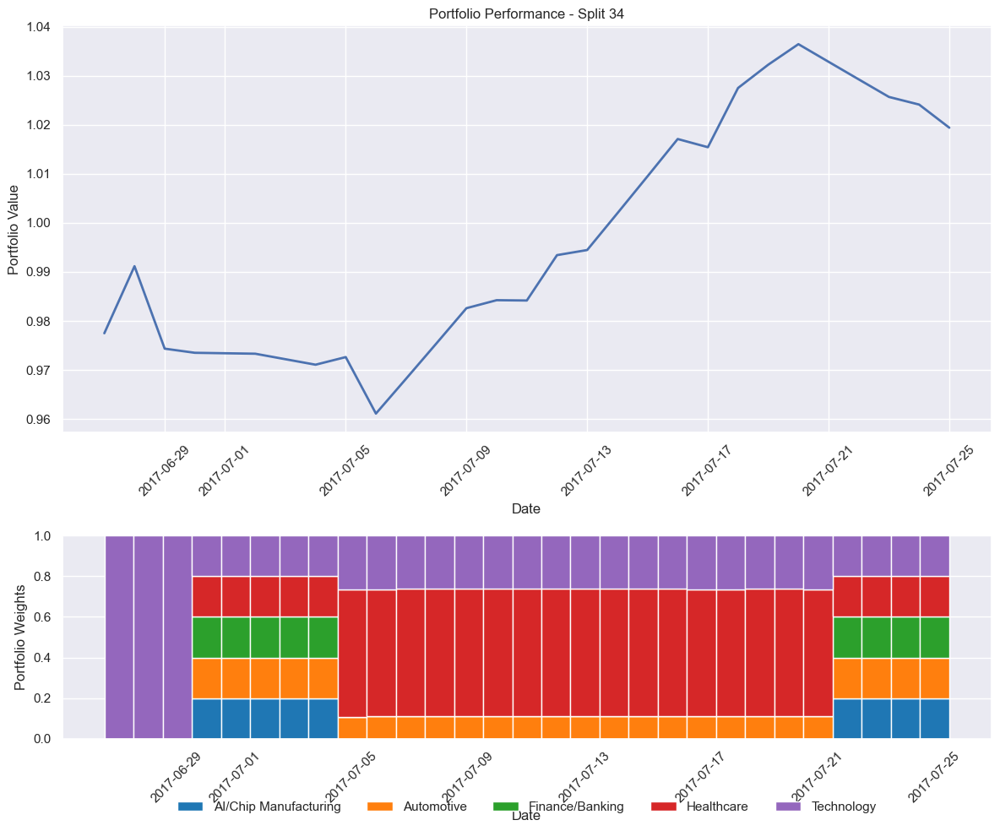


Processing split 35/124
Train period: 2014-01-02 00:00:00 to 2017-06-26 00:00:00
Validation period: 2017-06-27 00:00:00 to 2017-07-26 00:00:00
Test period: 2017-07-27 00:00:00 to 2017-08-25 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.0778
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 415  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 394          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

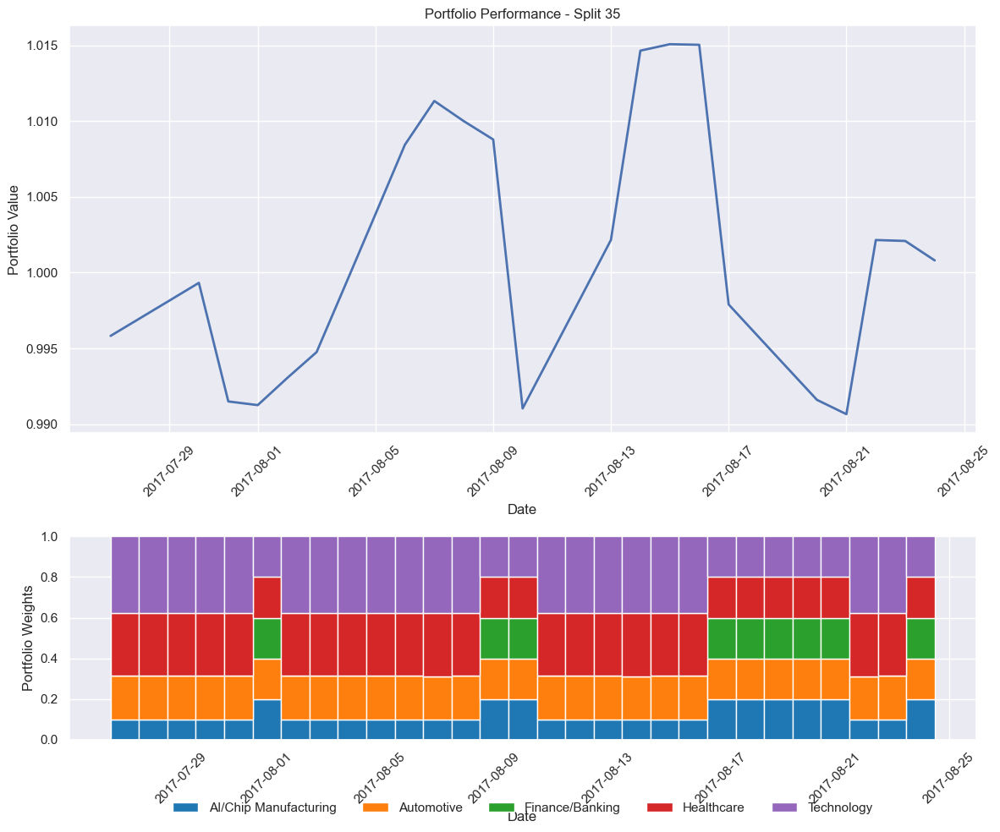


Processing split 36/124
Train period: 2014-01-02 00:00:00 to 2017-07-26 00:00:00
Validation period: 2017-07-27 00:00:00 to 2017-08-25 00:00:00
Test period: 2017-08-26 00:00:00 to 2017-09-24 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.1379
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 420  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 410          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

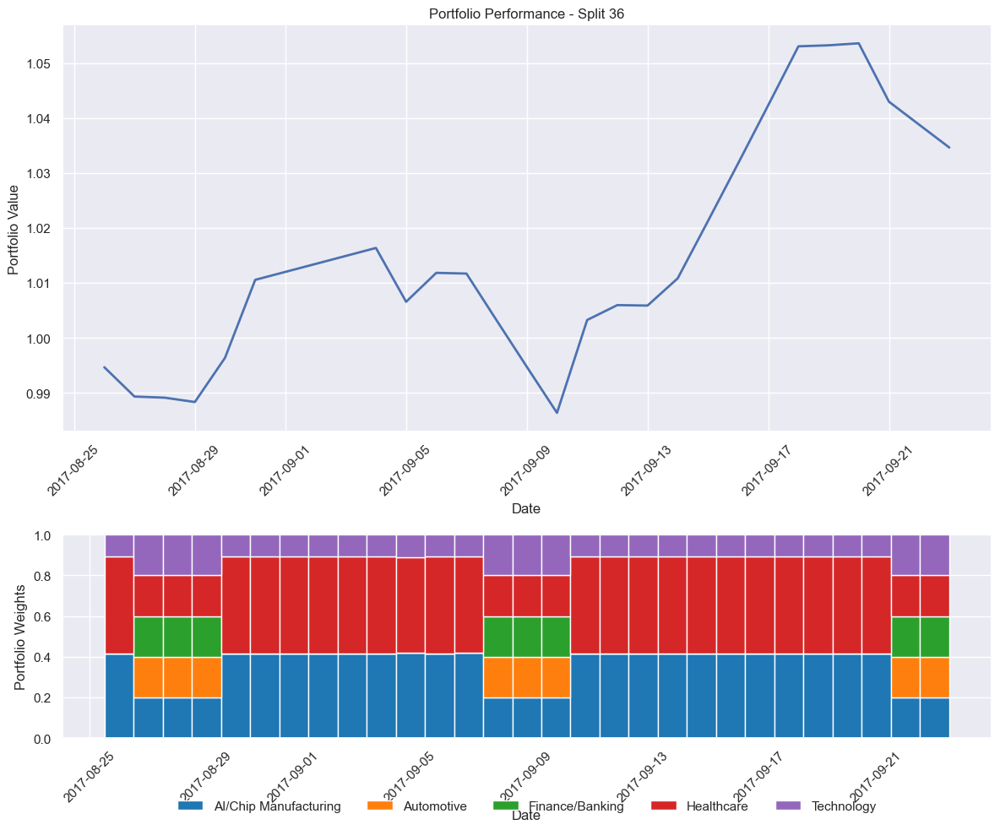


Processing split 37/124
Train period: 2014-01-02 00:00:00 to 2017-08-25 00:00:00
Validation period: 2017-08-26 00:00:00 to 2017-09-24 00:00:00
Test period: 2017-09-25 00:00:00 to 2017-10-24 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.0781
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 411  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 403          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

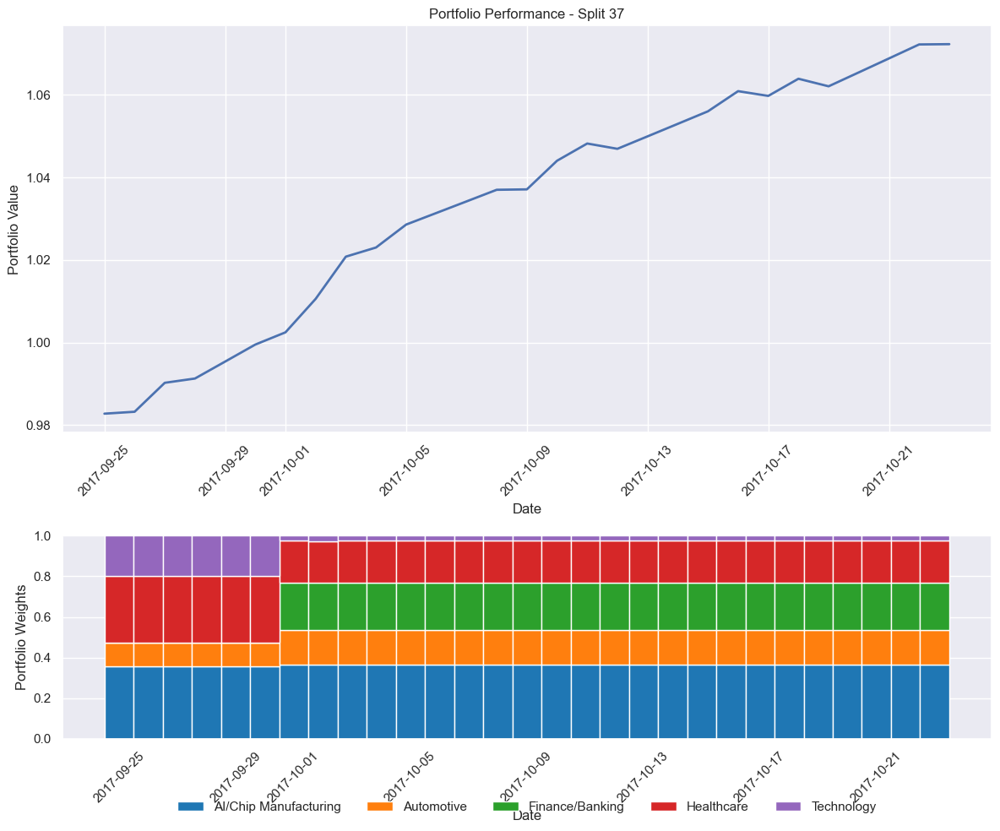


Processing split 38/124
Train period: 2014-01-02 00:00:00 to 2017-09-24 00:00:00
Validation period: 2017-09-25 00:00:00 to 2017-10-24 00:00:00
Test period: 2017-10-25 00:00:00 to 2017-11-23 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.0812
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 426  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 397          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

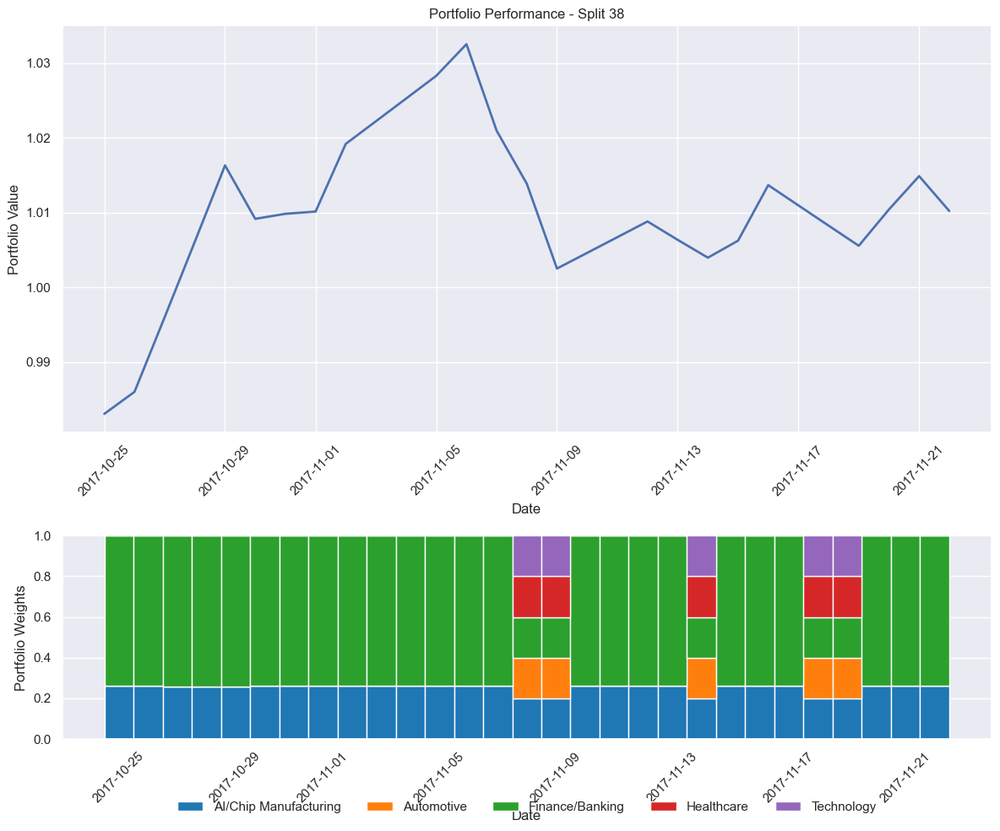


Processing split 39/124
Train period: 2014-01-02 00:00:00 to 2017-10-24 00:00:00
Validation period: 2017-10-25 00:00:00 to 2017-11-23 00:00:00
Test period: 2017-11-24 00:00:00 to 2017-12-23 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.1393
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 418  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 406          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

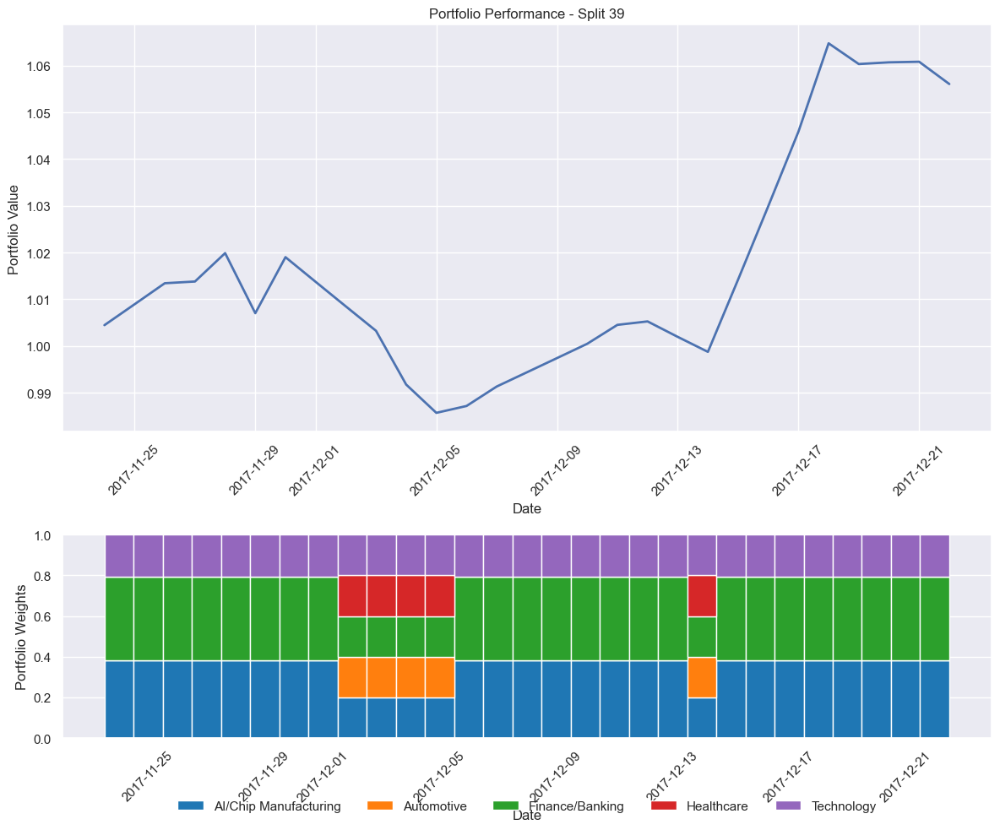


Processing split 40/124
Train period: 2014-01-02 00:00:00 to 2017-11-23 00:00:00
Validation period: 2017-11-24 00:00:00 to 2017-12-23 00:00:00
Test period: 2017-12-24 00:00:00 to 2018-01-22 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.2161
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 407  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 399          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

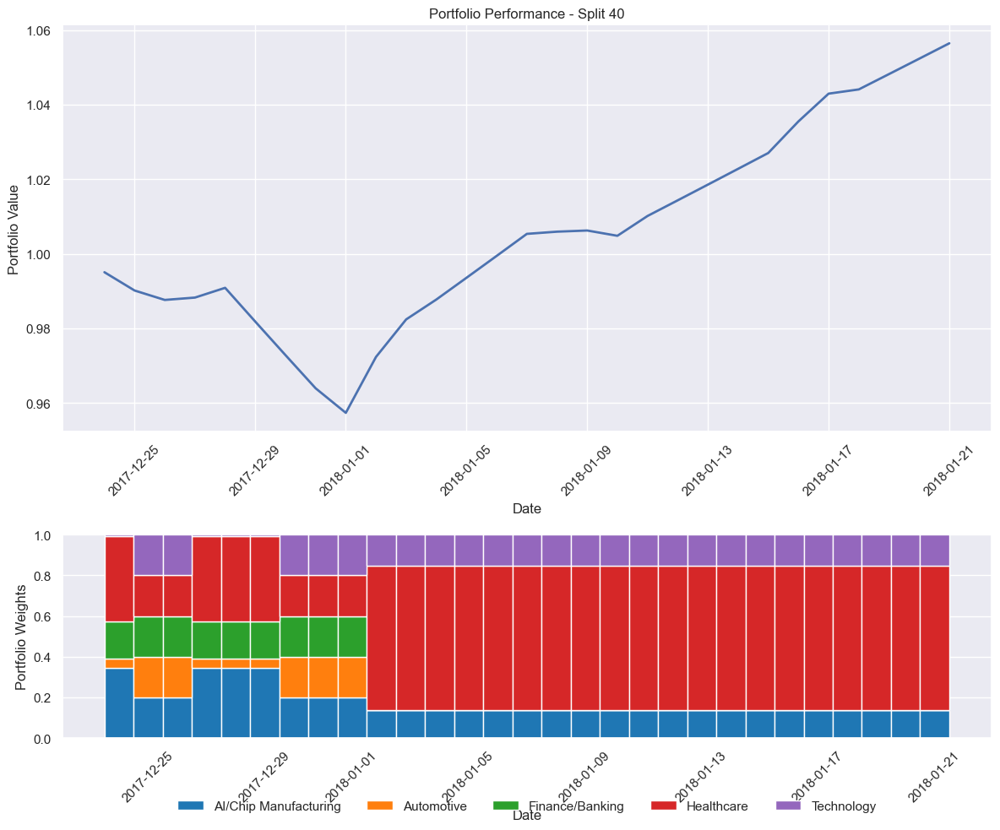


Processing split 41/124
Train period: 2014-01-02 00:00:00 to 2017-12-23 00:00:00
Validation period: 2017-12-24 00:00:00 to 2018-01-22 00:00:00
Test period: 2018-01-23 00:00:00 to 2018-02-21 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.2018
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 409  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 401          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

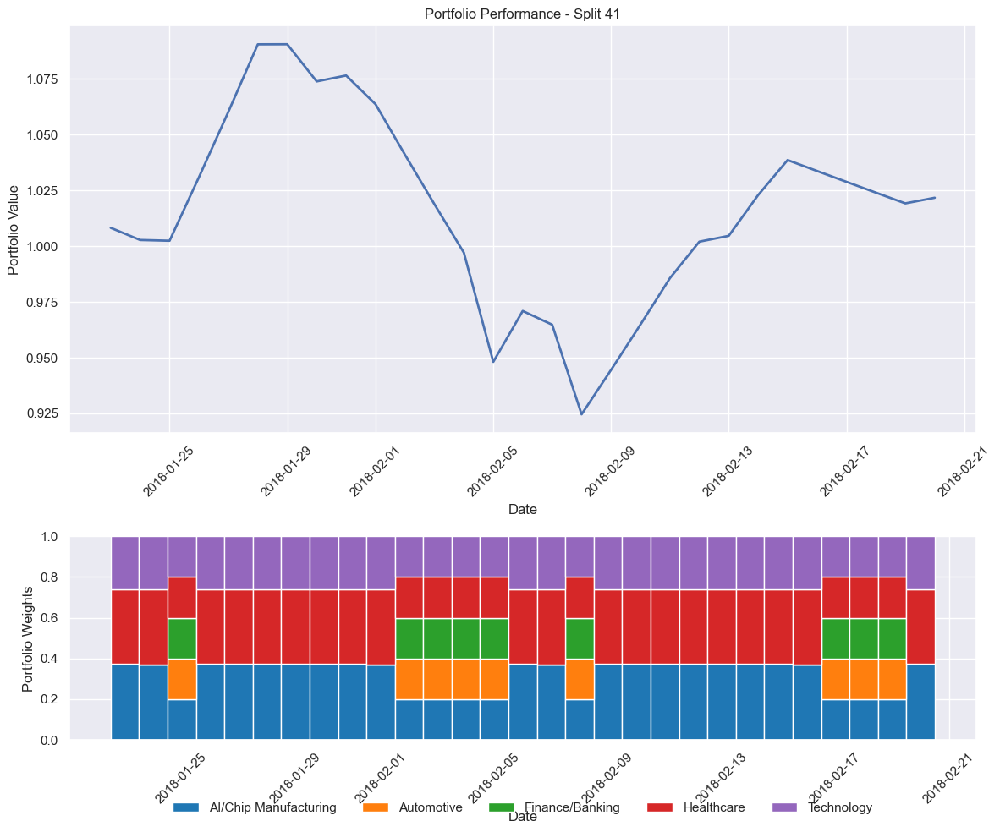


Processing split 42/124
Train period: 2014-01-02 00:00:00 to 2018-01-22 00:00:00
Validation period: 2018-01-23 00:00:00 to 2018-02-21 00:00:00
Test period: 2018-02-22 00:00:00 to 2018-03-23 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.2374
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 420  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 396          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

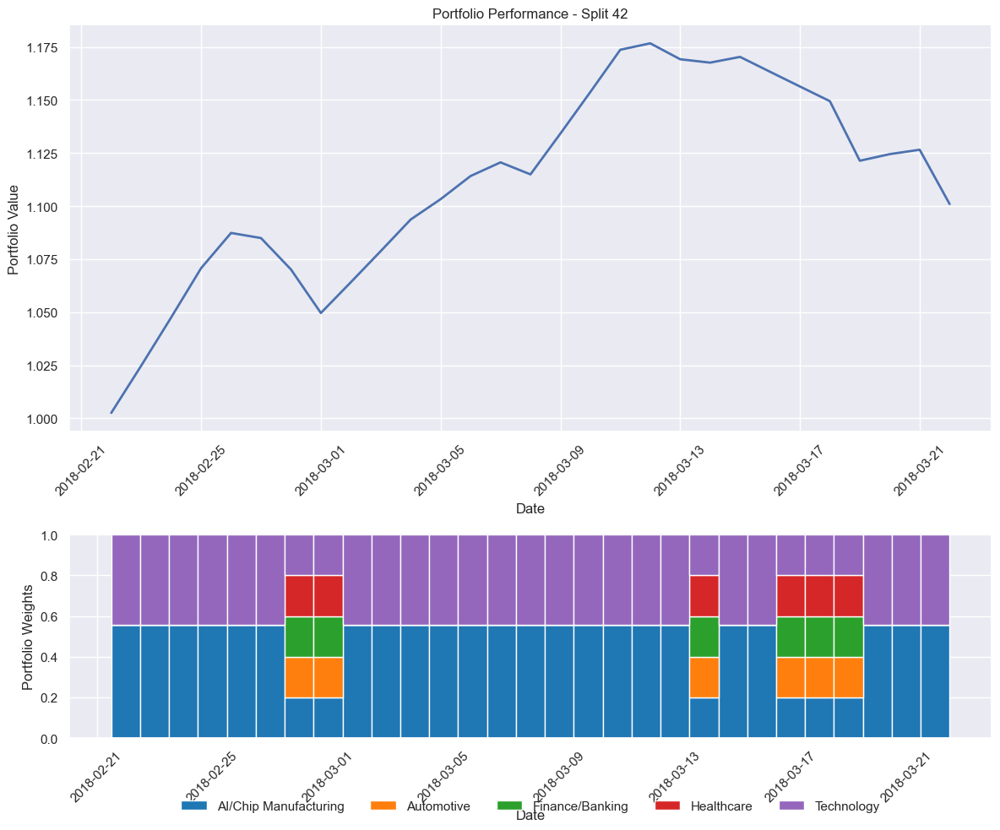


Processing split 43/124
Train period: 2014-01-02 00:00:00 to 2018-02-21 00:00:00
Validation period: 2018-02-22 00:00:00 to 2018-03-23 00:00:00
Test period: 2018-03-24 00:00:00 to 2018-04-22 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.2164
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 421  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 395          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

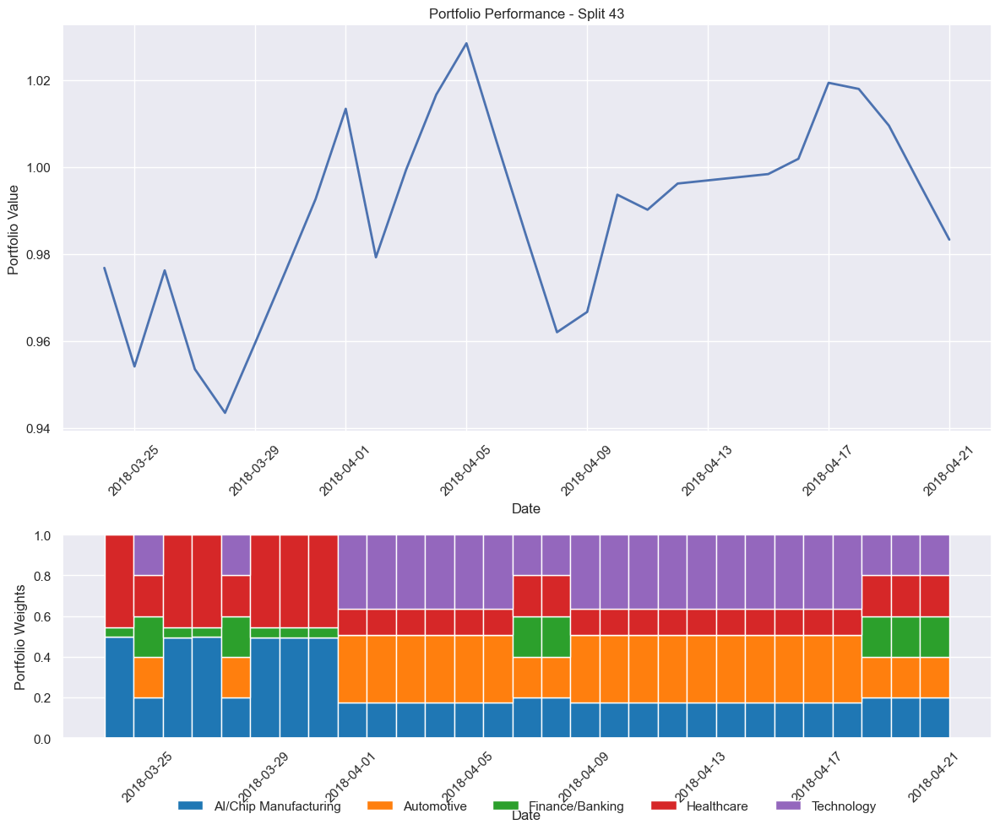


Processing split 44/124
Train period: 2014-01-02 00:00:00 to 2018-03-23 00:00:00
Validation period: 2018-03-24 00:00:00 to 2018-04-22 00:00:00
Test period: 2018-04-23 00:00:00 to 2018-05-22 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.2442
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 393  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 393          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

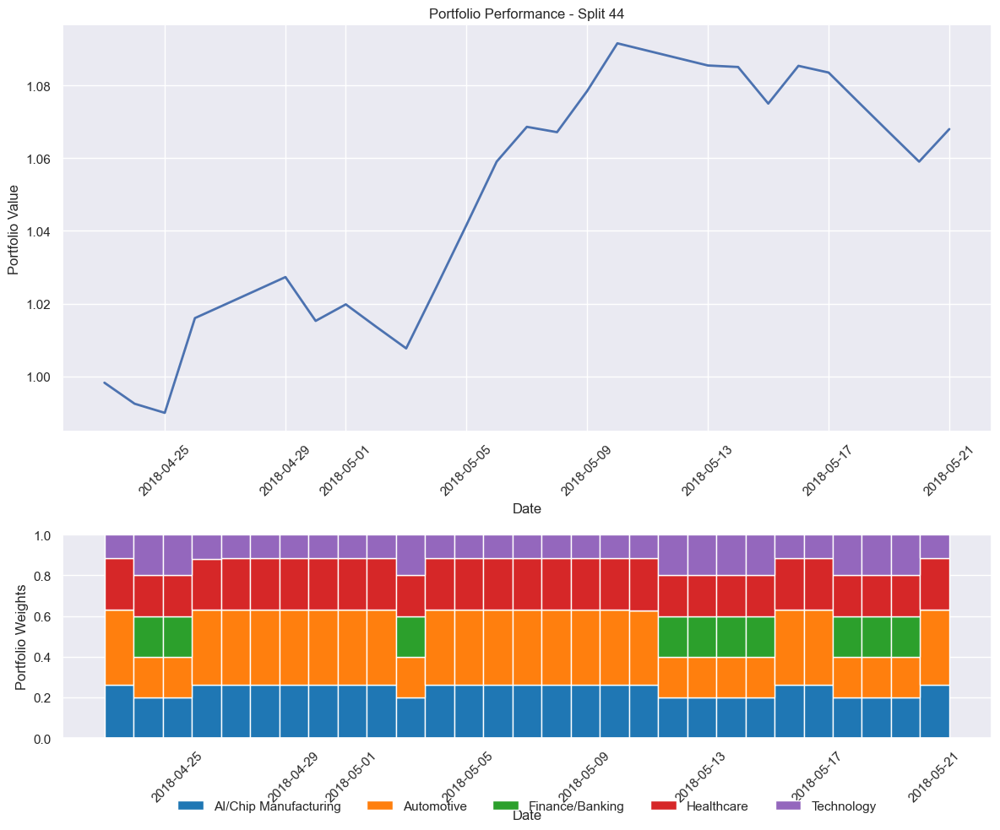


Processing split 45/124
Train period: 2014-01-02 00:00:00 to 2018-04-22 00:00:00
Validation period: 2018-04-23 00:00:00 to 2018-05-22 00:00:00
Test period: 2018-05-23 00:00:00 to 2018-06-21 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.1590
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 420  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 399          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

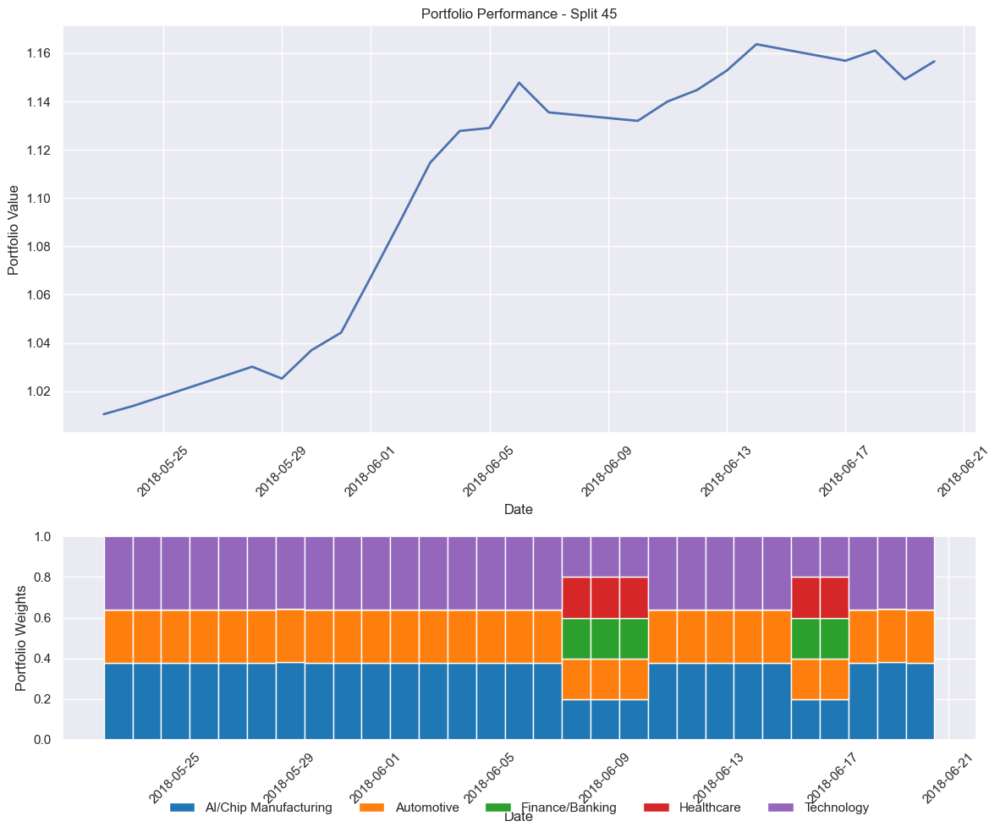


Processing split 46/124
Train period: 2014-01-02 00:00:00 to 2018-05-22 00:00:00
Validation period: 2018-05-23 00:00:00 to 2018-06-21 00:00:00
Test period: 2018-06-22 00:00:00 to 2018-07-21 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.2116
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 422  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 402          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

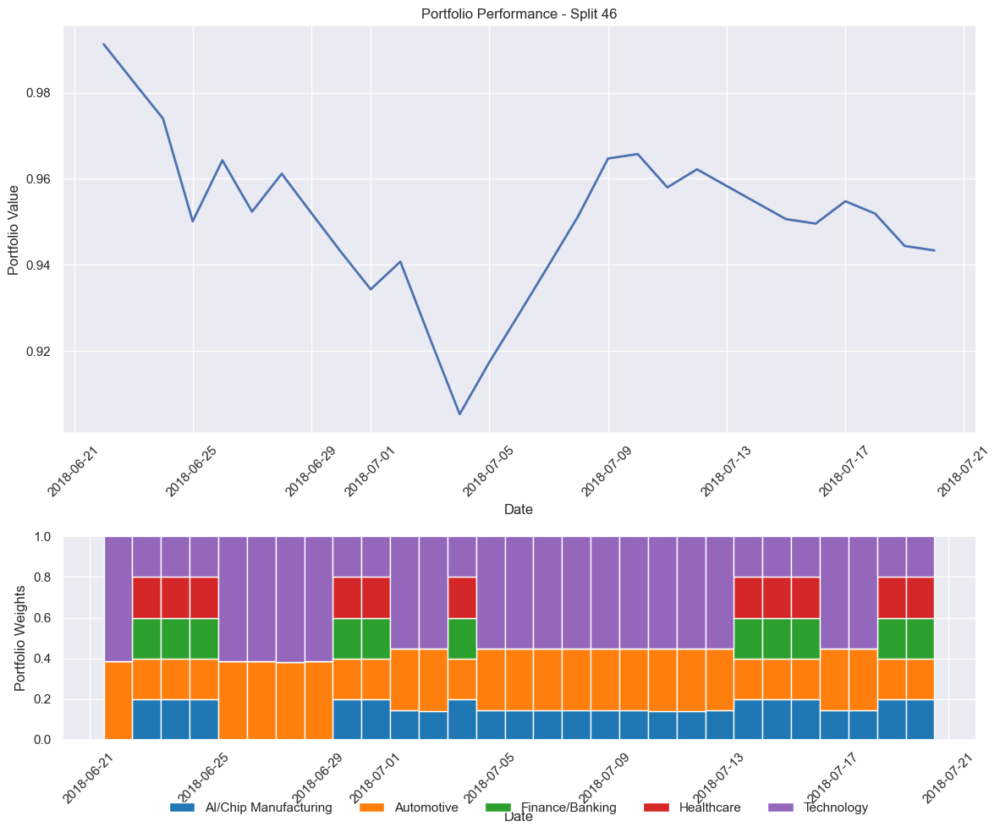


Processing split 47/124
Train period: 2014-01-02 00:00:00 to 2018-06-21 00:00:00
Validation period: 2018-06-22 00:00:00 to 2018-07-21 00:00:00
Test period: 2018-07-22 00:00:00 to 2018-08-20 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.2859
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 409  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 401          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

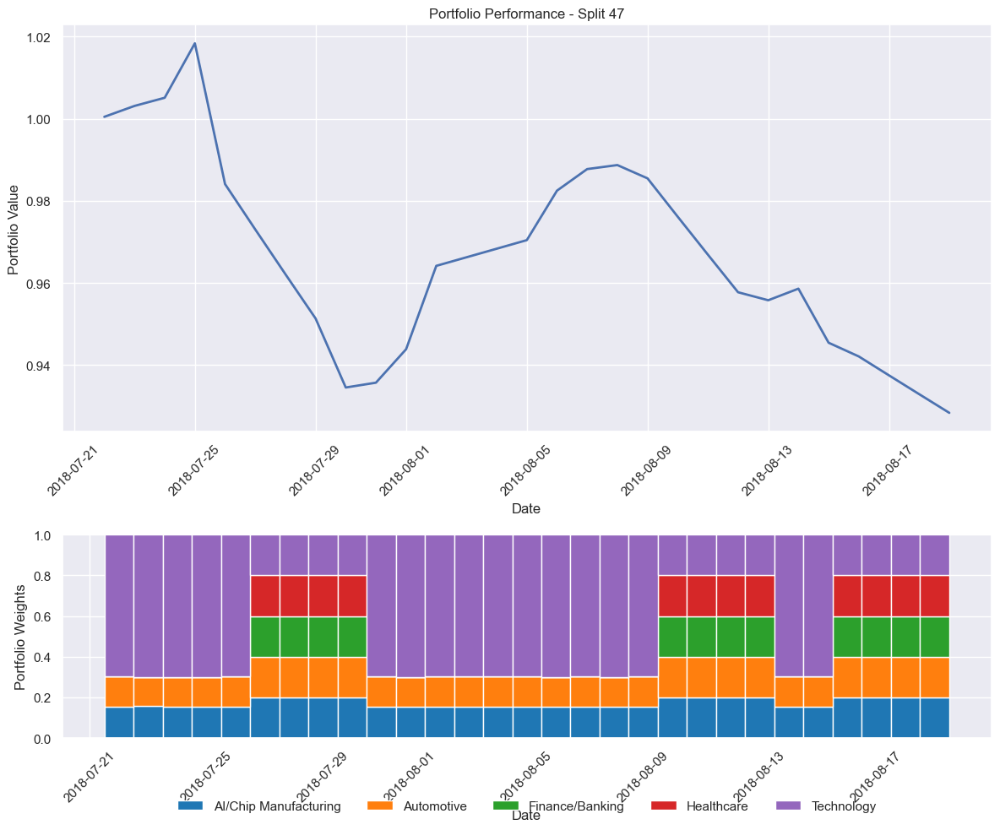


Processing split 48/124
Train period: 2014-01-02 00:00:00 to 2018-07-21 00:00:00
Validation period: 2018-07-22 00:00:00 to 2018-08-20 00:00:00
Test period: 2018-08-21 00:00:00 to 2018-09-19 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.2351
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 421  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 404          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

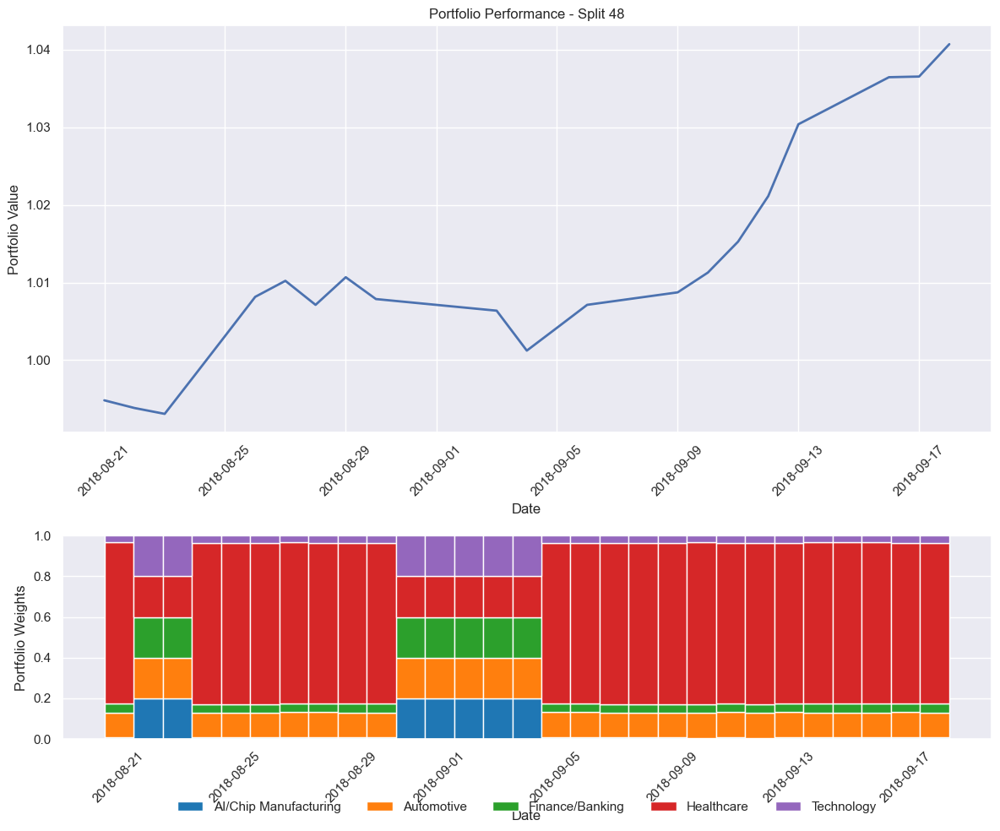


Processing split 49/124
Train period: 2014-01-02 00:00:00 to 2018-08-20 00:00:00
Validation period: 2018-08-21 00:00:00 to 2018-09-19 00:00:00
Test period: 2018-09-20 00:00:00 to 2018-10-19 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.1801
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 424  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 405          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

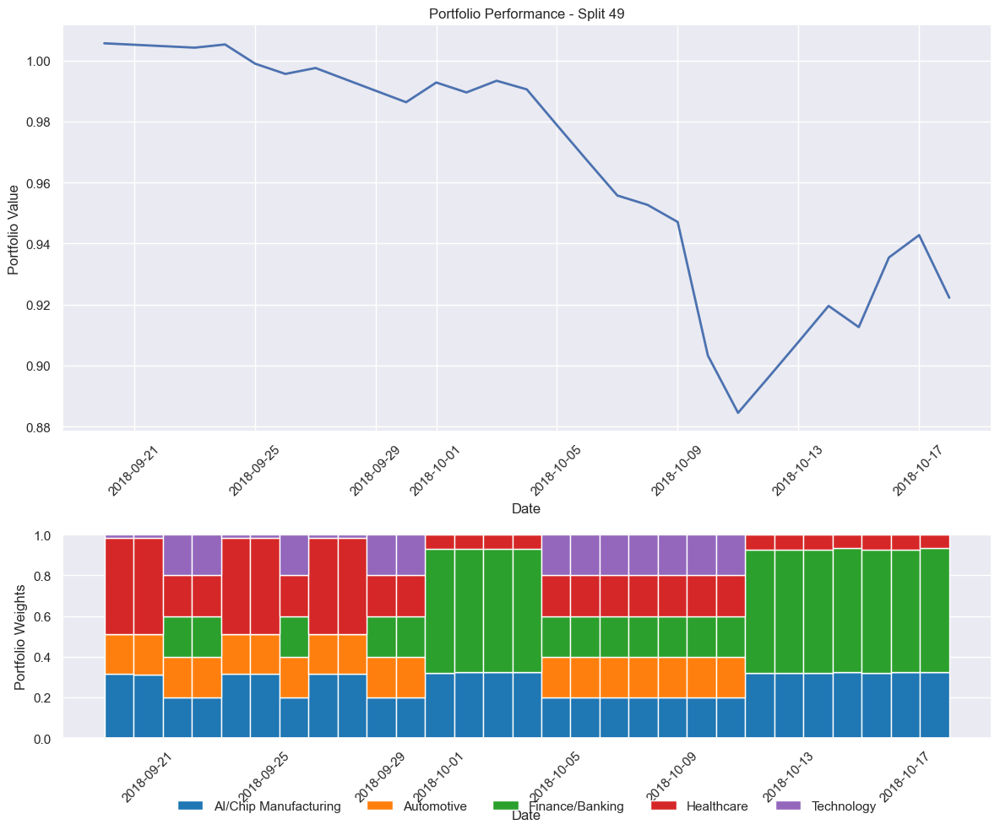


Processing split 50/124
Train period: 2014-01-02 00:00:00 to 2018-09-19 00:00:00
Validation period: 2018-09-20 00:00:00 to 2018-10-19 00:00:00
Test period: 2018-10-20 00:00:00 to 2018-11-18 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.2912
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 403  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 391          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

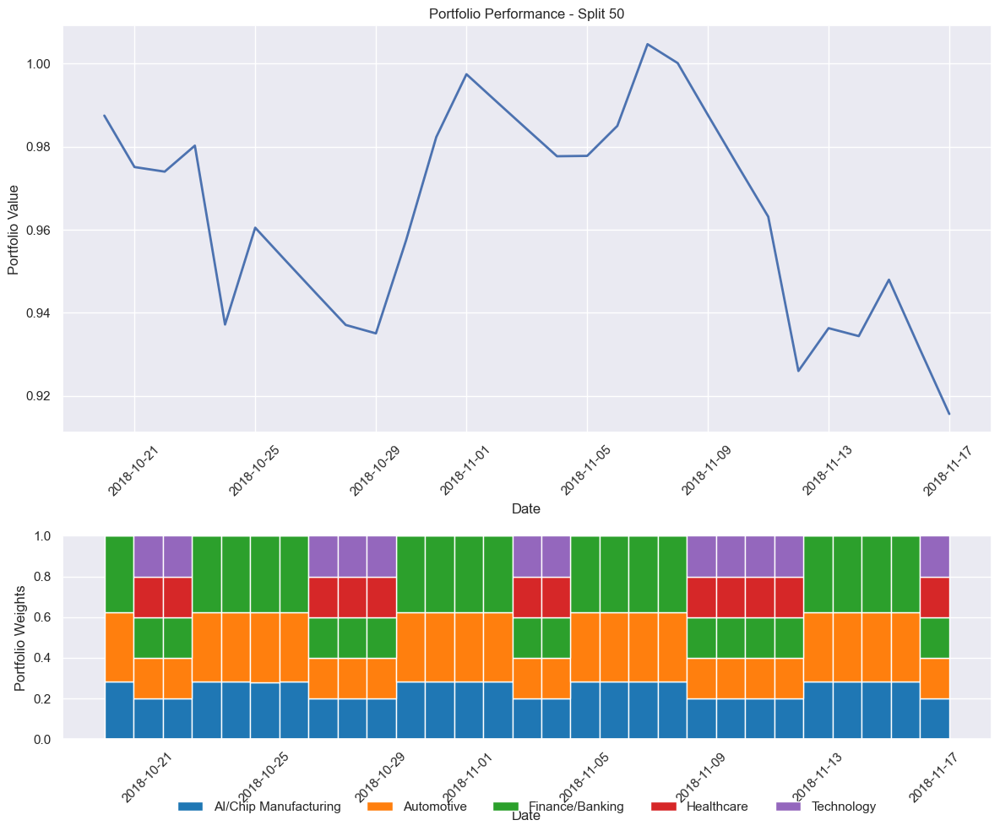


Processing split 51/124
Train period: 2014-01-02 00:00:00 to 2018-10-19 00:00:00
Validation period: 2018-10-20 00:00:00 to 2018-11-18 00:00:00
Test period: 2018-11-19 00:00:00 to 2018-12-18 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.2033
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 413  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 392          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

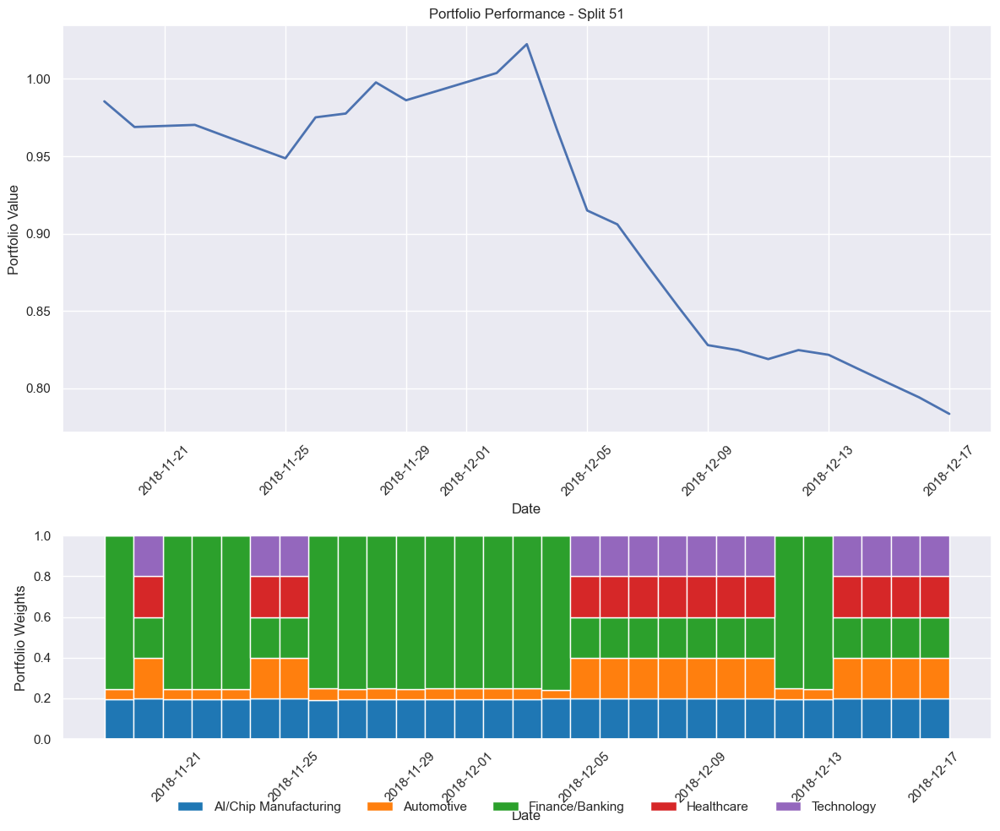


Processing split 52/124
Train period: 2014-01-02 00:00:00 to 2018-11-18 00:00:00
Validation period: 2018-11-19 00:00:00 to 2018-12-18 00:00:00
Test period: 2018-12-19 00:00:00 to 2019-01-17 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9654
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 420  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 404          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

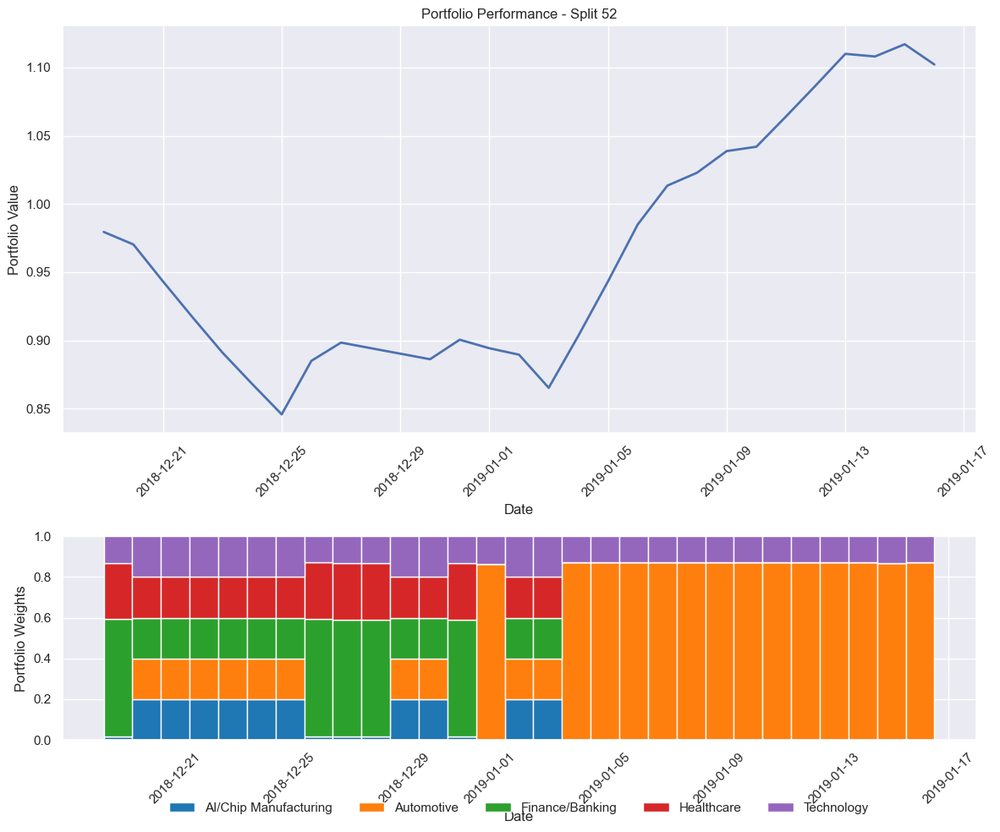


Processing split 53/124
Train period: 2014-01-02 00:00:00 to 2018-12-18 00:00:00
Validation period: 2018-12-19 00:00:00 to 2019-01-17 00:00:00
Test period: 2019-01-18 00:00:00 to 2019-02-16 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.7955
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 421  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 410          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

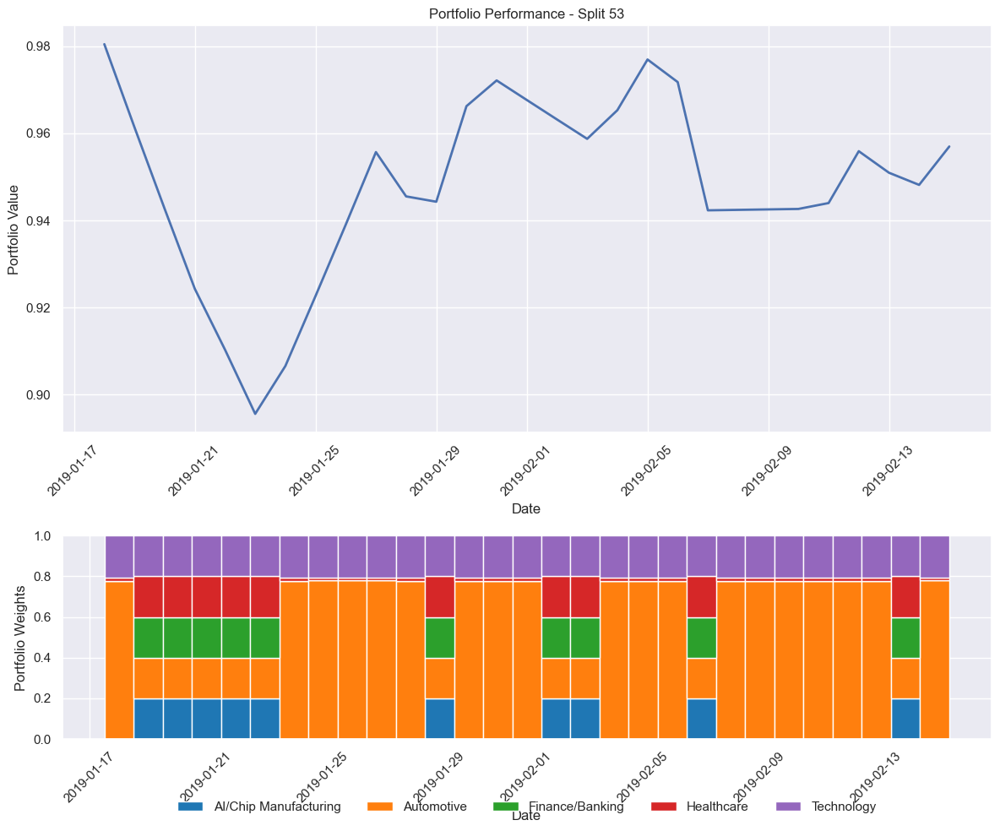


Processing split 54/124
Train period: 2014-01-02 00:00:00 to 2019-01-17 00:00:00
Validation period: 2019-01-18 00:00:00 to 2019-02-16 00:00:00
Test period: 2019-02-17 00:00:00 to 2019-03-18 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8263
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 425  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 406          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

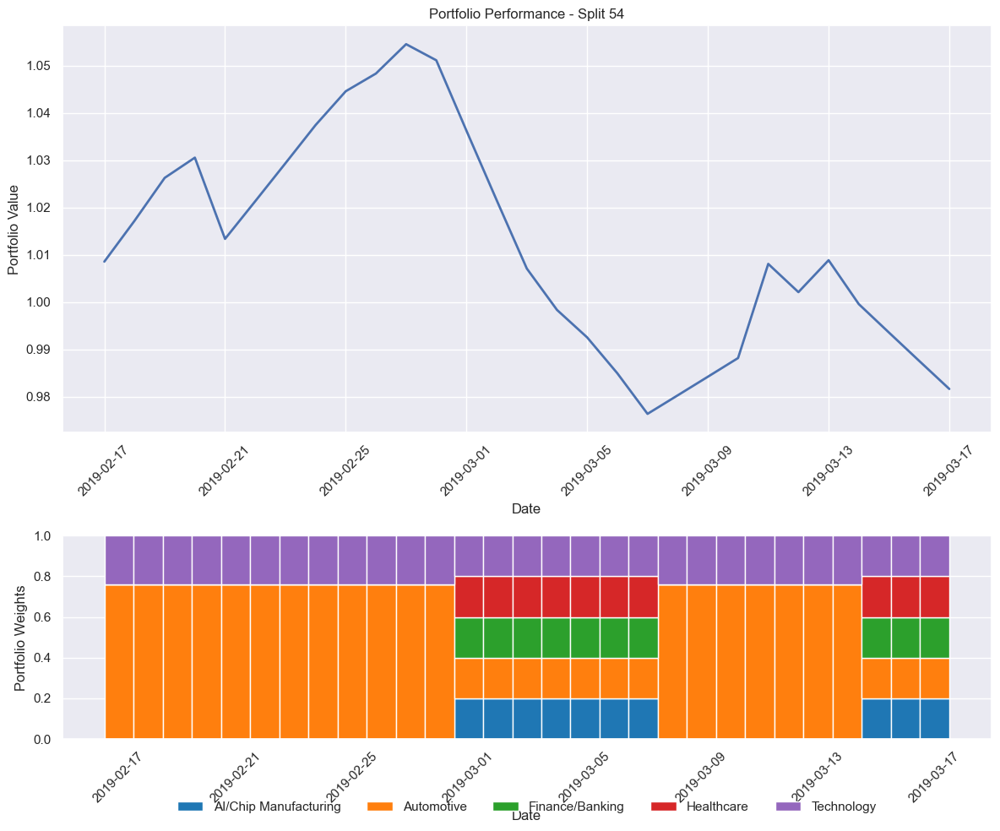


Processing split 55/124
Train period: 2014-01-02 00:00:00 to 2019-02-16 00:00:00
Validation period: 2019-02-17 00:00:00 to 2019-03-18 00:00:00
Test period: 2019-03-19 00:00:00 to 2019-04-17 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9319
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 424  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 401          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

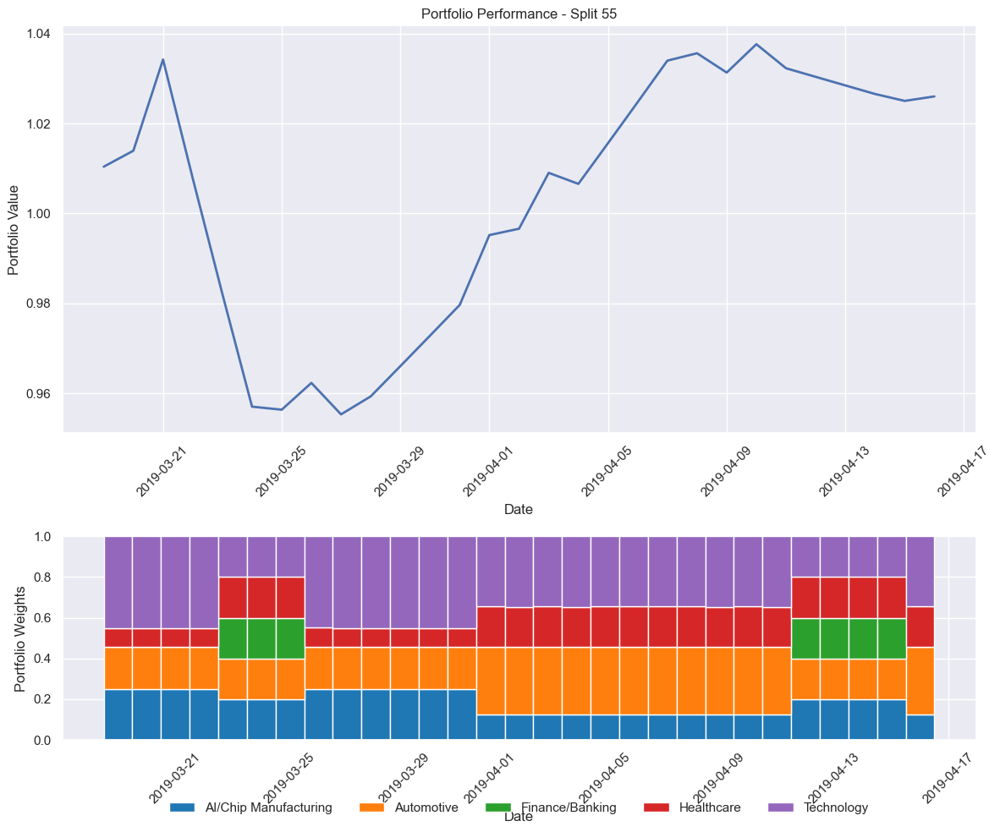


Processing split 56/124
Train period: 2014-01-02 00:00:00 to 2019-03-18 00:00:00
Validation period: 2019-03-19 00:00:00 to 2019-04-17 00:00:00
Test period: 2019-04-18 00:00:00 to 2019-05-17 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.0151
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 422  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 409          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

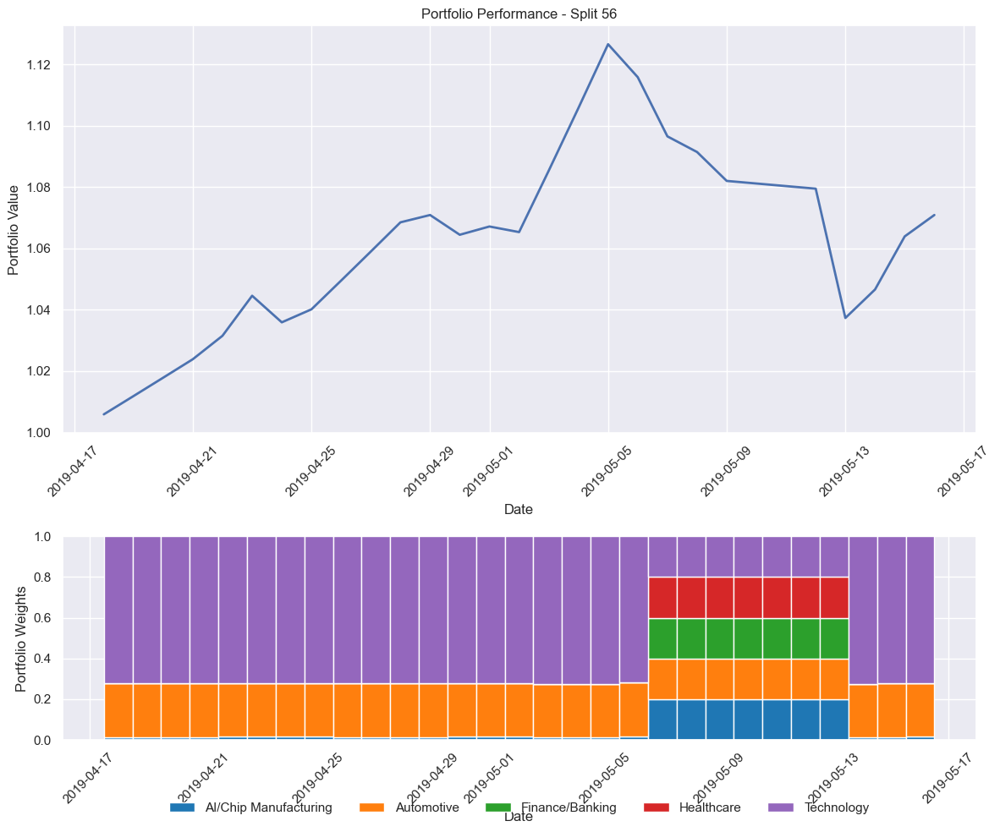


Processing split 57/124
Train period: 2014-01-02 00:00:00 to 2019-04-17 00:00:00
Validation period: 2019-04-18 00:00:00 to 2019-05-17 00:00:00
Test period: 2019-05-18 00:00:00 to 2019-06-16 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.0262
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 413  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 400          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

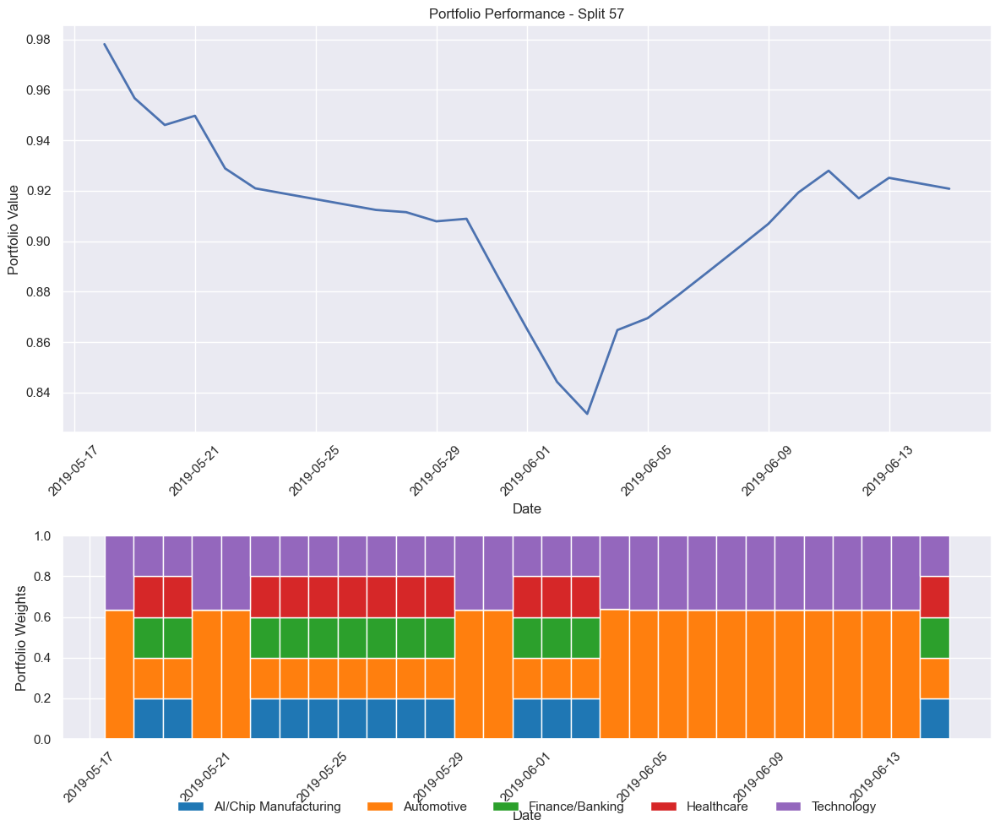


Processing split 58/124
Train period: 2014-01-02 00:00:00 to 2019-05-17 00:00:00
Validation period: 2019-05-18 00:00:00 to 2019-06-16 00:00:00
Test period: 2019-06-17 00:00:00 to 2019-07-16 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9666
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 410  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 395          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

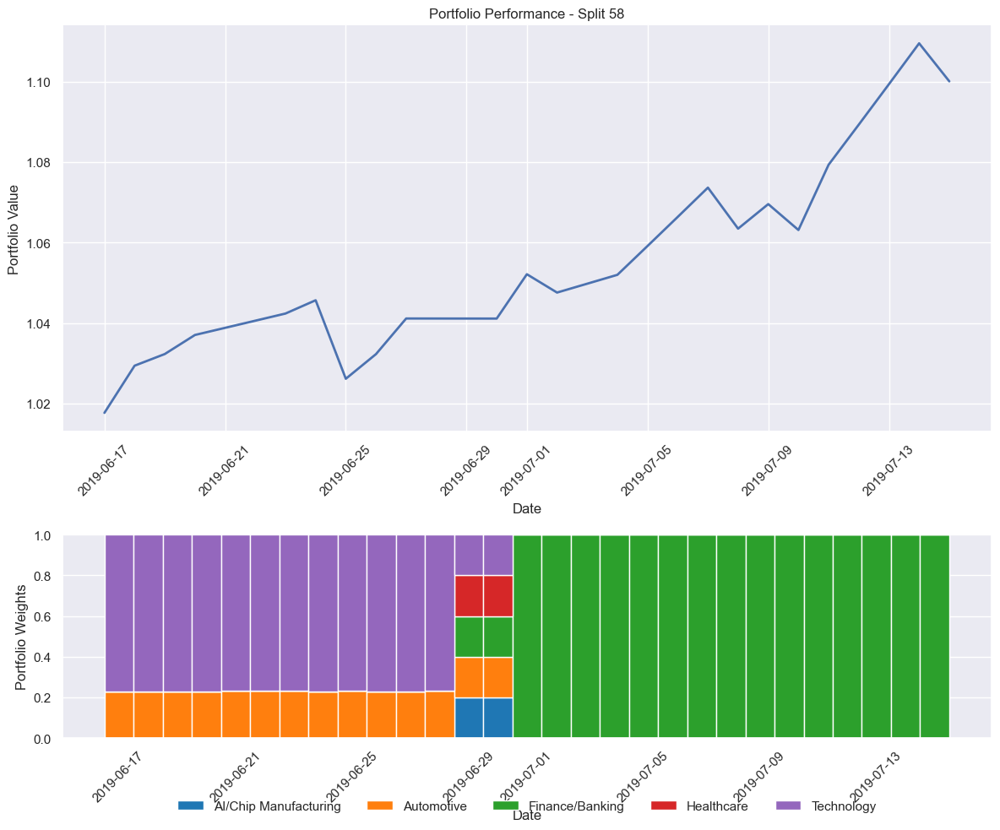


Processing split 59/124
Train period: 2014-01-02 00:00:00 to 2019-06-16 00:00:00
Validation period: 2019-06-17 00:00:00 to 2019-07-16 00:00:00
Test period: 2019-07-17 00:00:00 to 2019-08-15 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8789
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 407  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 397          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

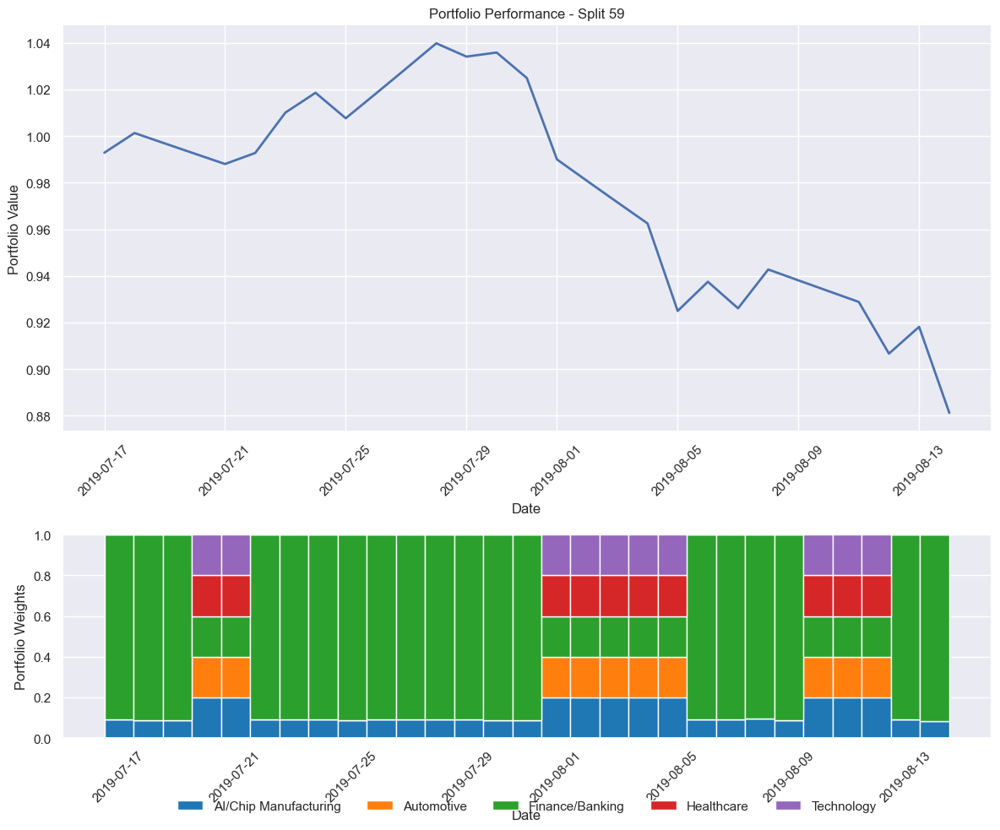


Processing split 60/124
Train period: 2014-01-02 00:00:00 to 2019-07-16 00:00:00
Validation period: 2019-07-17 00:00:00 to 2019-08-15 00:00:00
Test period: 2019-08-16 00:00:00 to 2019-09-14 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8858
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 403  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 395          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

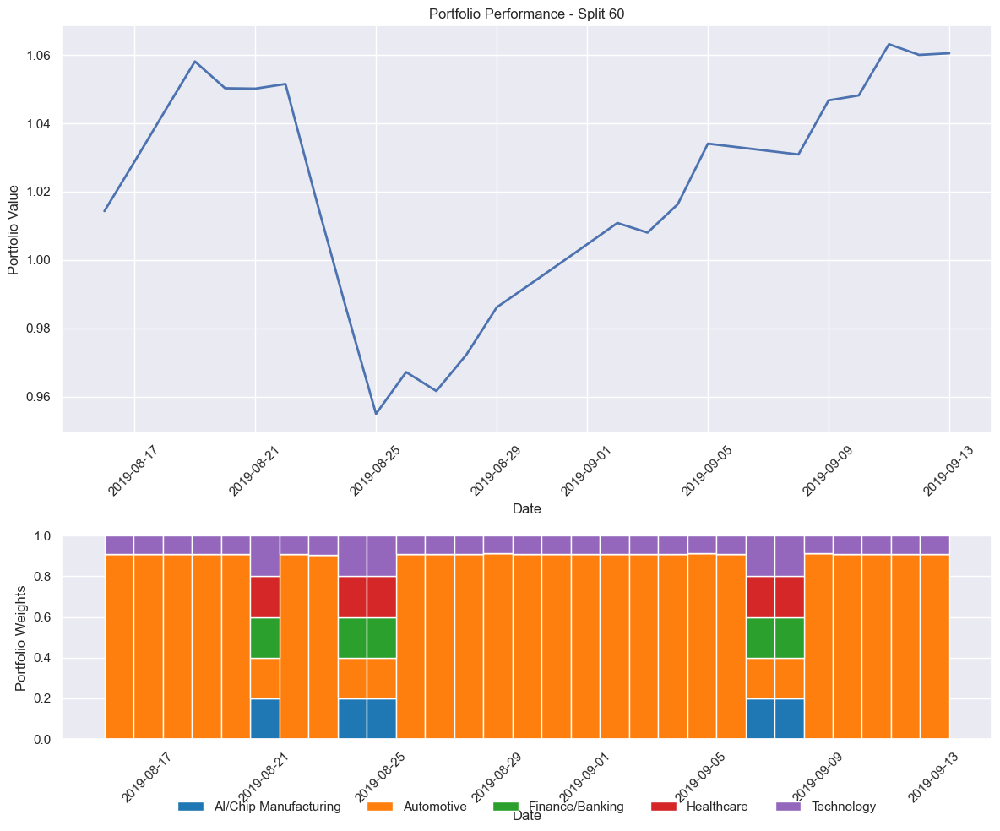


Processing split 61/124
Train period: 2014-01-02 00:00:00 to 2019-08-15 00:00:00
Validation period: 2019-08-16 00:00:00 to 2019-09-14 00:00:00
Test period: 2019-09-15 00:00:00 to 2019-10-14 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.7945
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 406  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 397          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

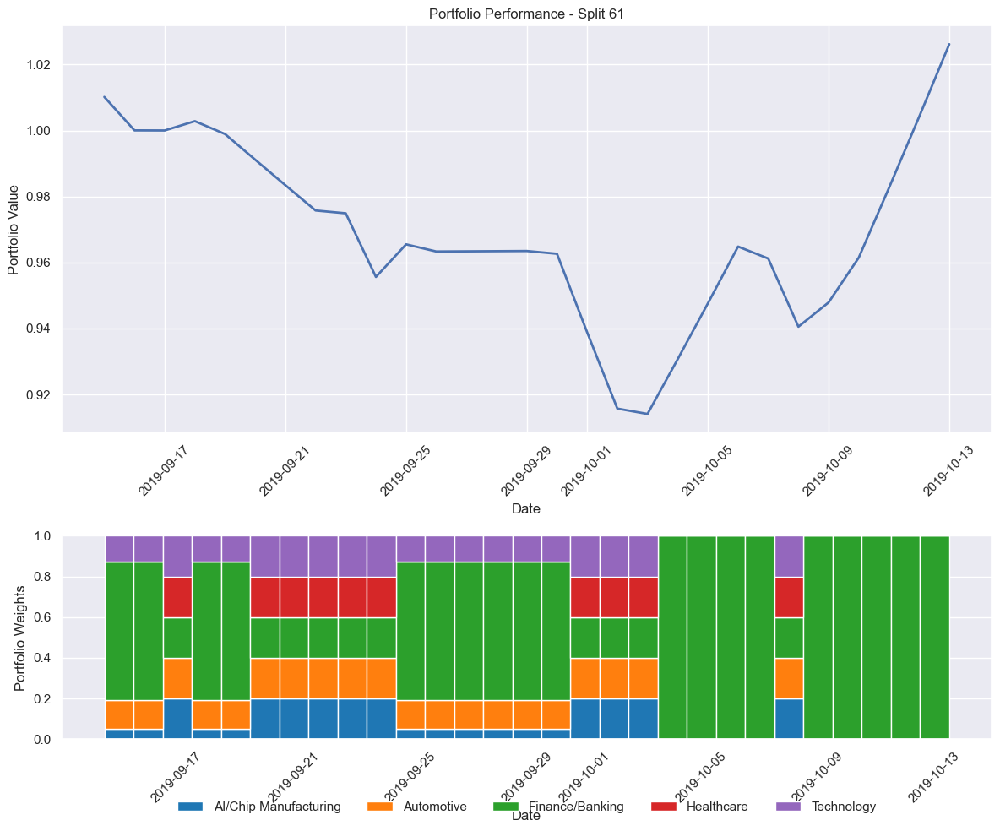


Processing split 62/124
Train period: 2014-01-02 00:00:00 to 2019-09-14 00:00:00
Validation period: 2019-09-15 00:00:00 to 2019-10-14 00:00:00
Test period: 2019-10-15 00:00:00 to 2019-11-13 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8212
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 409  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 399          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

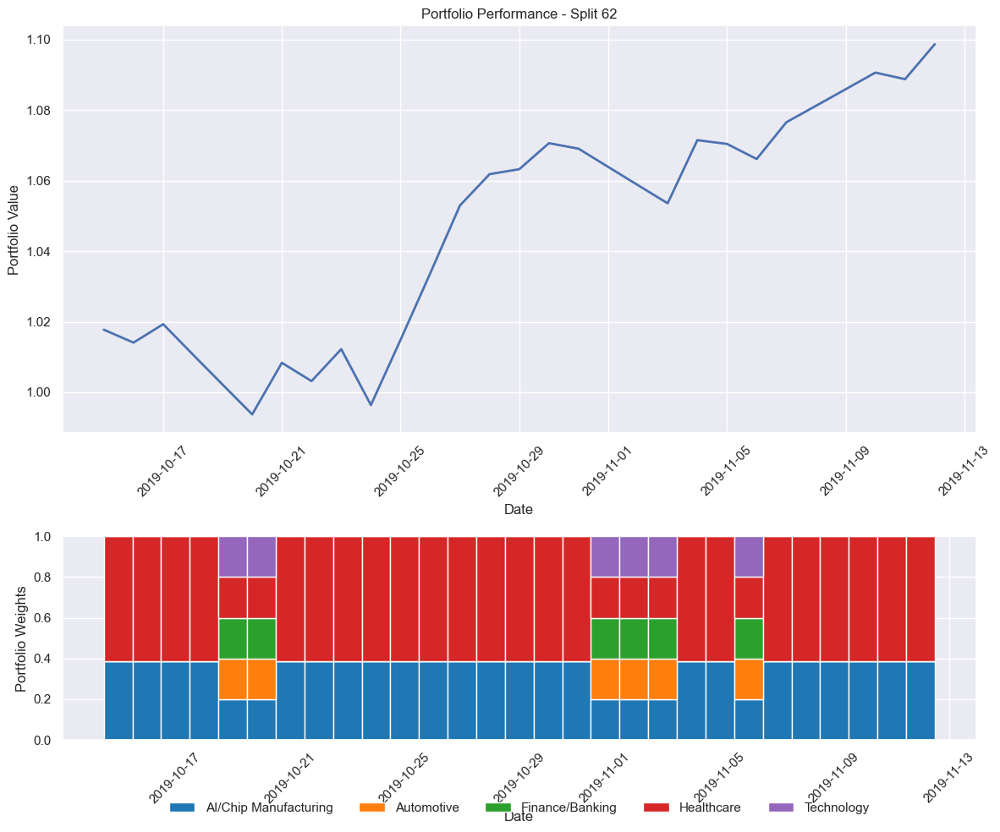


Processing split 63/124
Train period: 2014-01-02 00:00:00 to 2019-10-14 00:00:00
Validation period: 2019-10-15 00:00:00 to 2019-11-13 00:00:00
Test period: 2019-11-14 00:00:00 to 2019-12-13 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8130
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 409  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 398          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

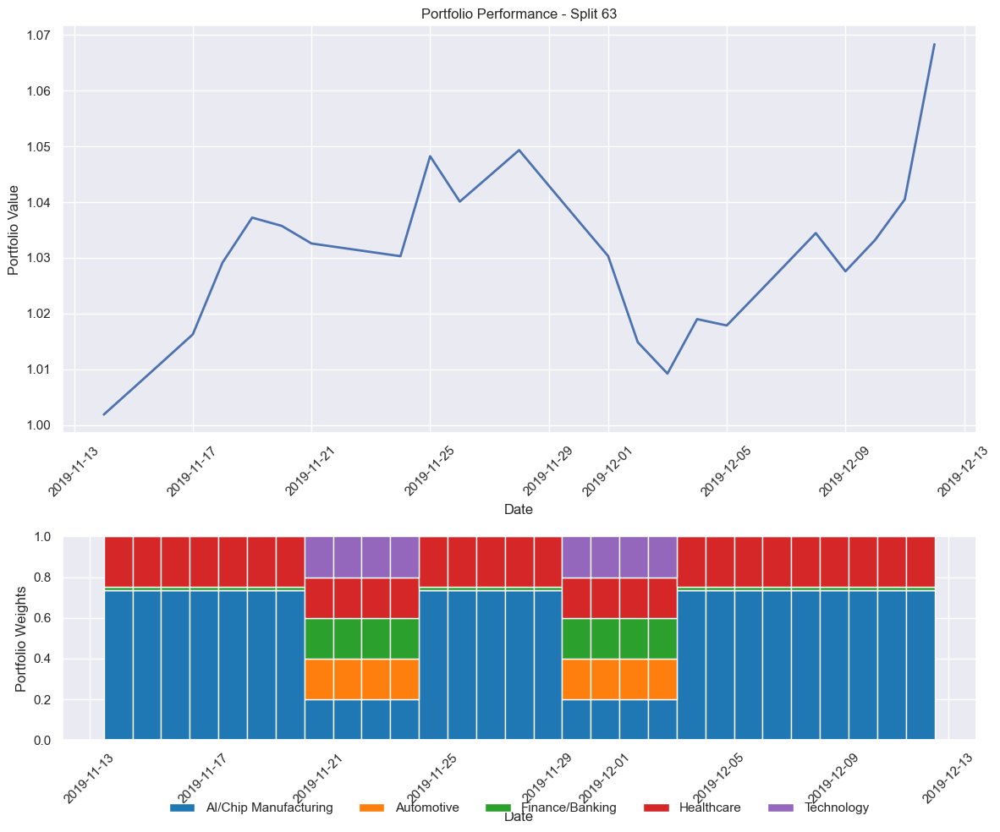


Processing split 64/124
Train period: 2014-01-02 00:00:00 to 2019-11-13 00:00:00
Validation period: 2019-11-14 00:00:00 to 2019-12-13 00:00:00
Test period: 2019-12-14 00:00:00 to 2020-01-12 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8707
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 412  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 400          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

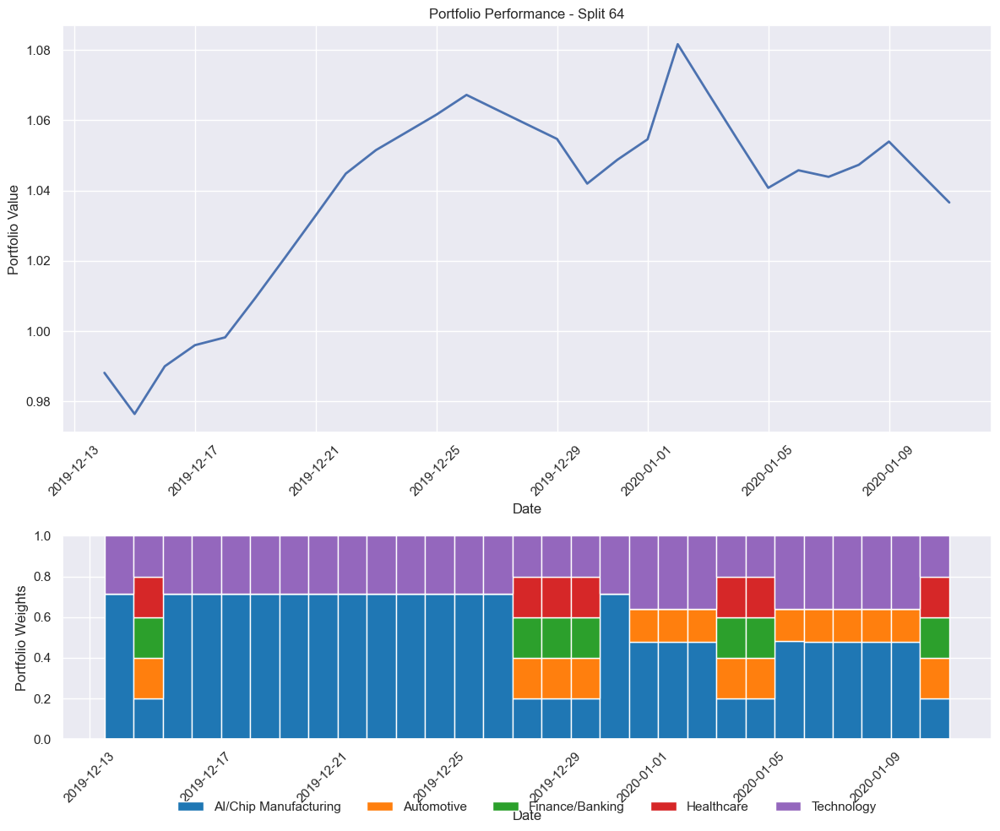


Processing split 65/124
Train period: 2014-01-02 00:00:00 to 2019-12-13 00:00:00
Validation period: 2019-12-14 00:00:00 to 2020-01-12 00:00:00
Test period: 2020-01-13 00:00:00 to 2020-02-11 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9026
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 424  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 406          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

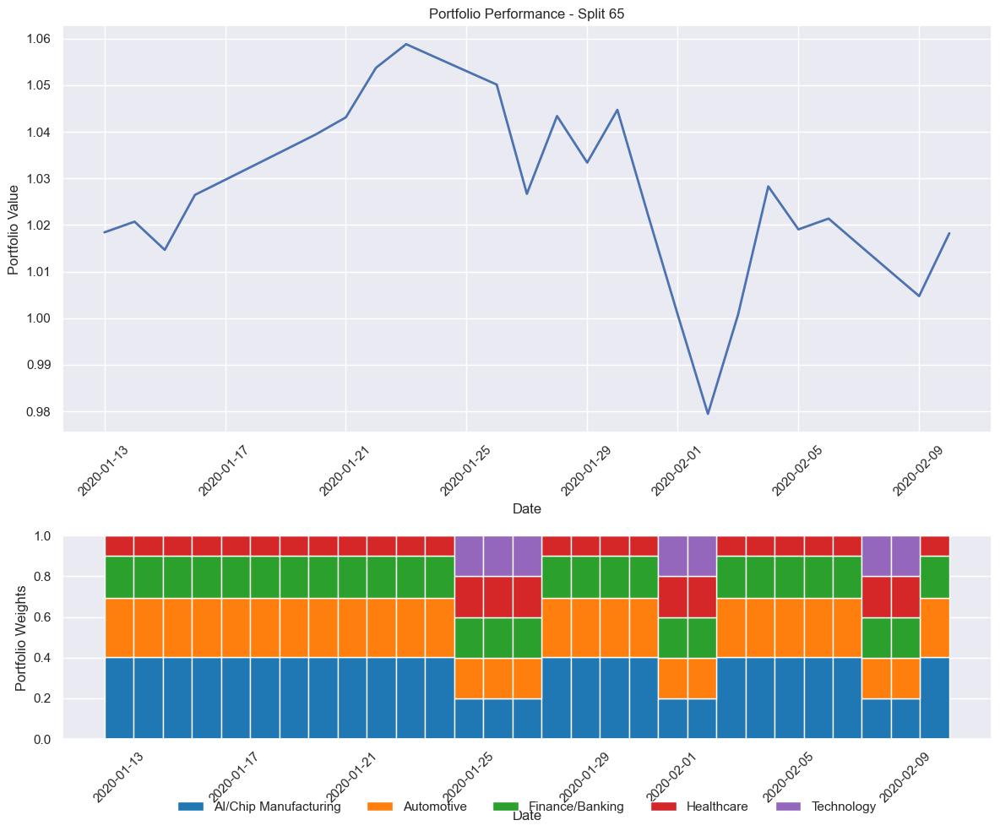


Processing split 66/124
Train period: 2014-01-02 00:00:00 to 2020-01-12 00:00:00
Validation period: 2020-01-13 00:00:00 to 2020-02-11 00:00:00
Test period: 2020-02-12 00:00:00 to 2020-03-12 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9109
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 398  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 391          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

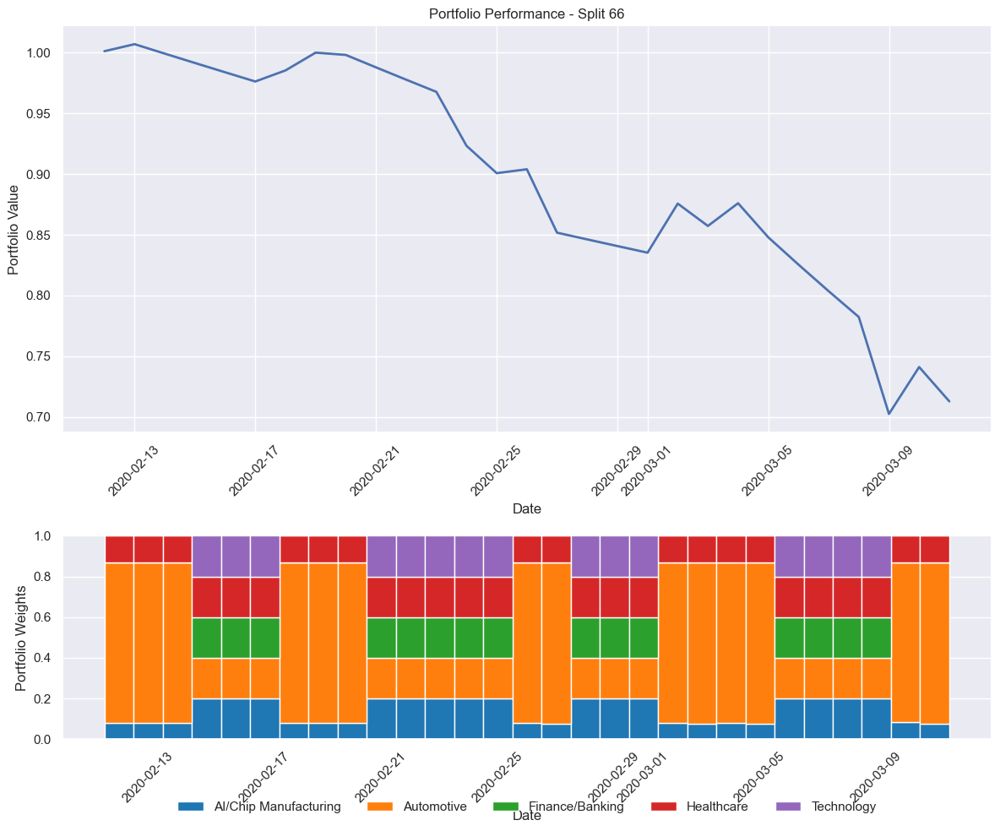


Processing split 67/124
Train period: 2014-01-02 00:00:00 to 2020-02-11 00:00:00
Validation period: 2020-02-12 00:00:00 to 2020-03-12 00:00:00
Test period: 2020-03-13 00:00:00 to 2020-04-11 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9224
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 402  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 392          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

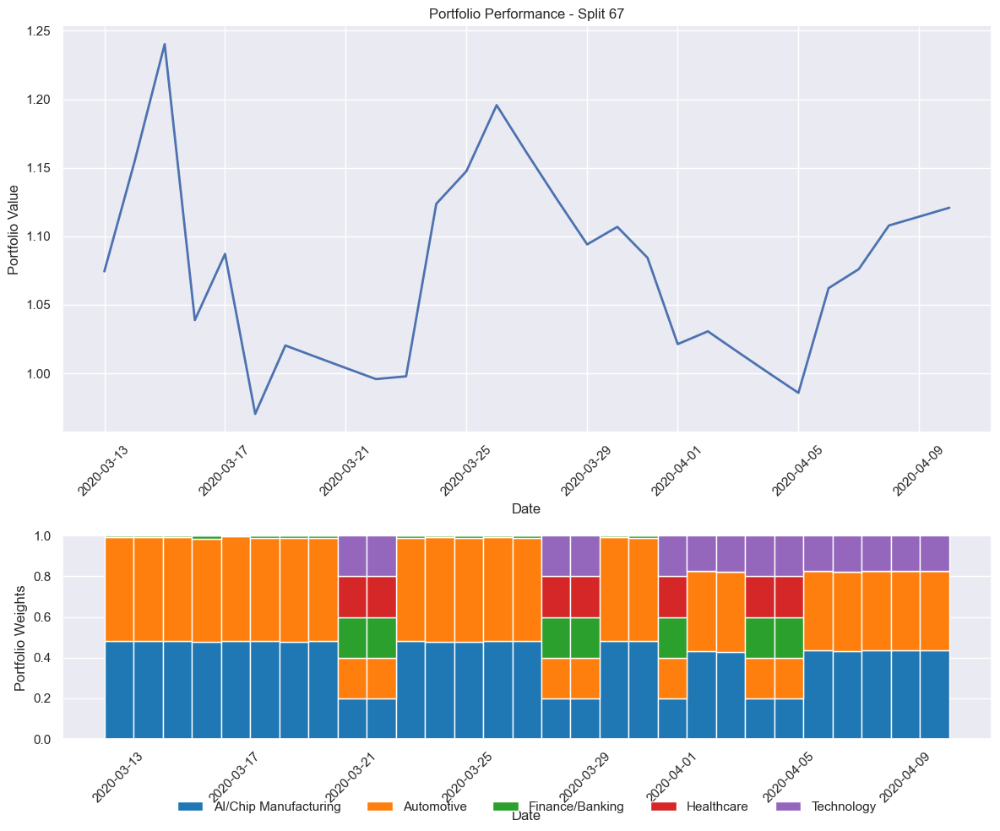


Processing split 68/124
Train period: 2014-01-02 00:00:00 to 2020-03-12 00:00:00
Validation period: 2020-03-13 00:00:00 to 2020-04-11 00:00:00
Test period: 2020-04-12 00:00:00 to 2020-05-11 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.7184
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 406  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 393          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

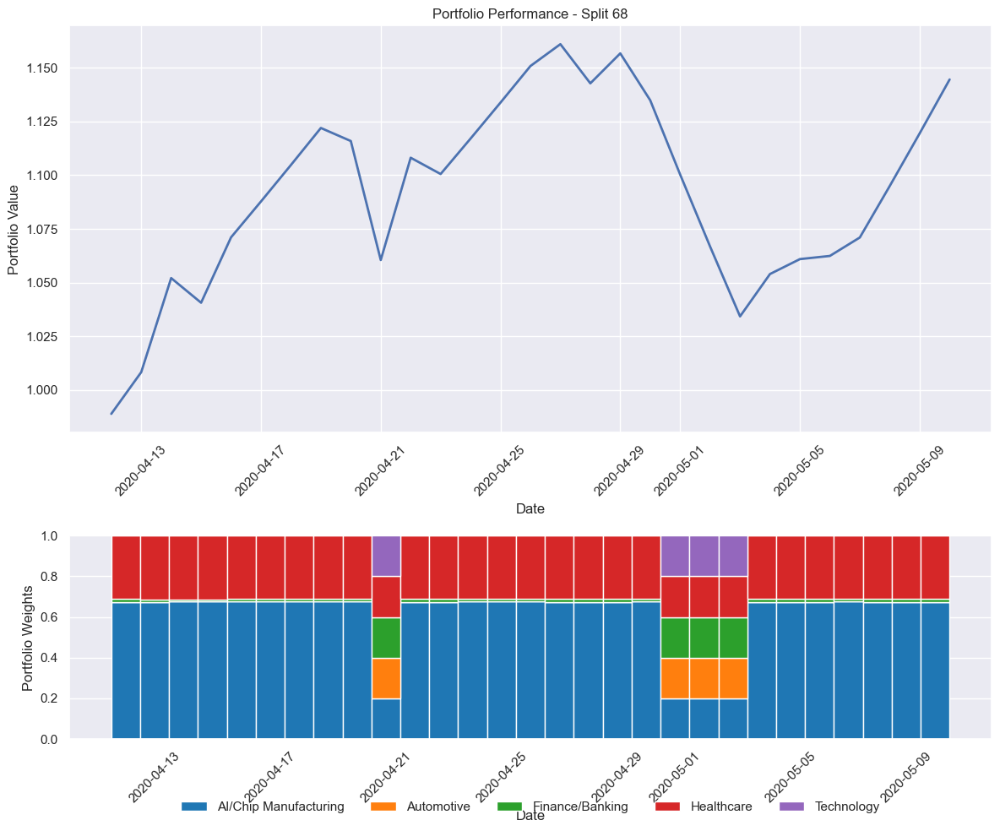


Processing split 69/124
Train period: 2014-01-02 00:00:00 to 2020-04-11 00:00:00
Validation period: 2020-04-12 00:00:00 to 2020-05-11 00:00:00
Test period: 2020-05-12 00:00:00 to 2020-06-10 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.7812
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 402  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 396          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

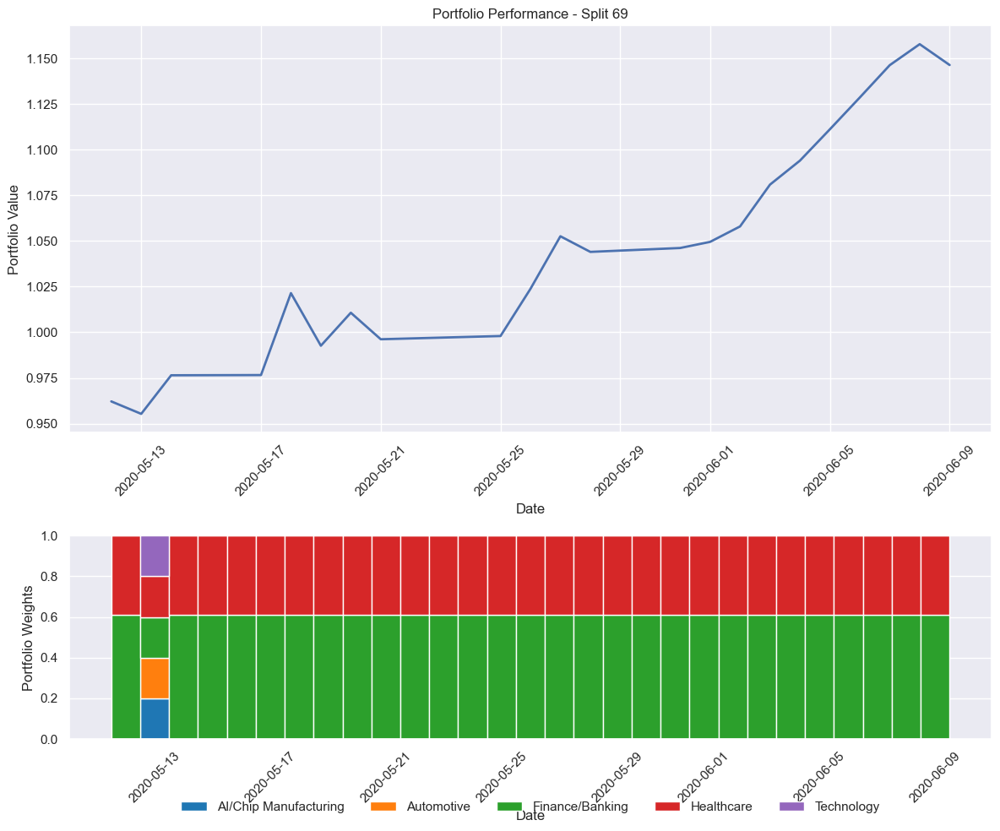


Processing split 70/124
Train period: 2014-01-02 00:00:00 to 2020-05-11 00:00:00
Validation period: 2020-05-12 00:00:00 to 2020-06-10 00:00:00
Test period: 2020-06-11 00:00:00 to 2020-07-10 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8915
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 402  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 382          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

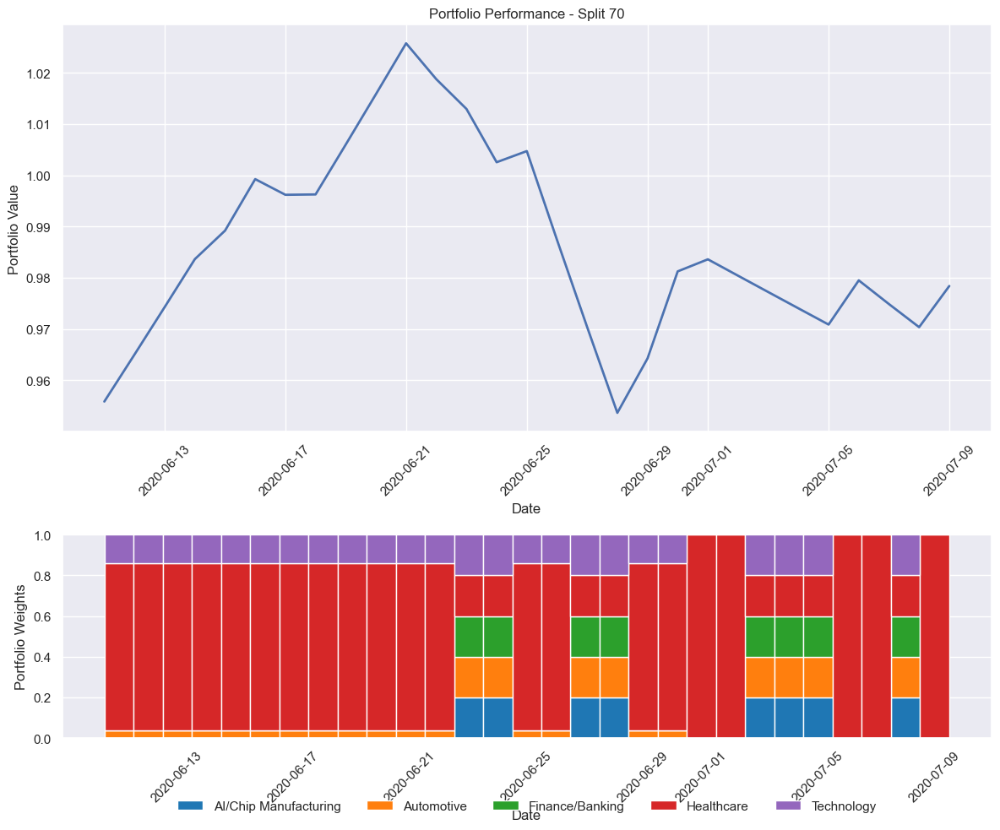


Processing split 71/124
Train period: 2014-01-02 00:00:00 to 2020-06-10 00:00:00
Validation period: 2020-06-11 00:00:00 to 2020-07-10 00:00:00
Test period: 2020-07-11 00:00:00 to 2020-08-09 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9429
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 403  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 394          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

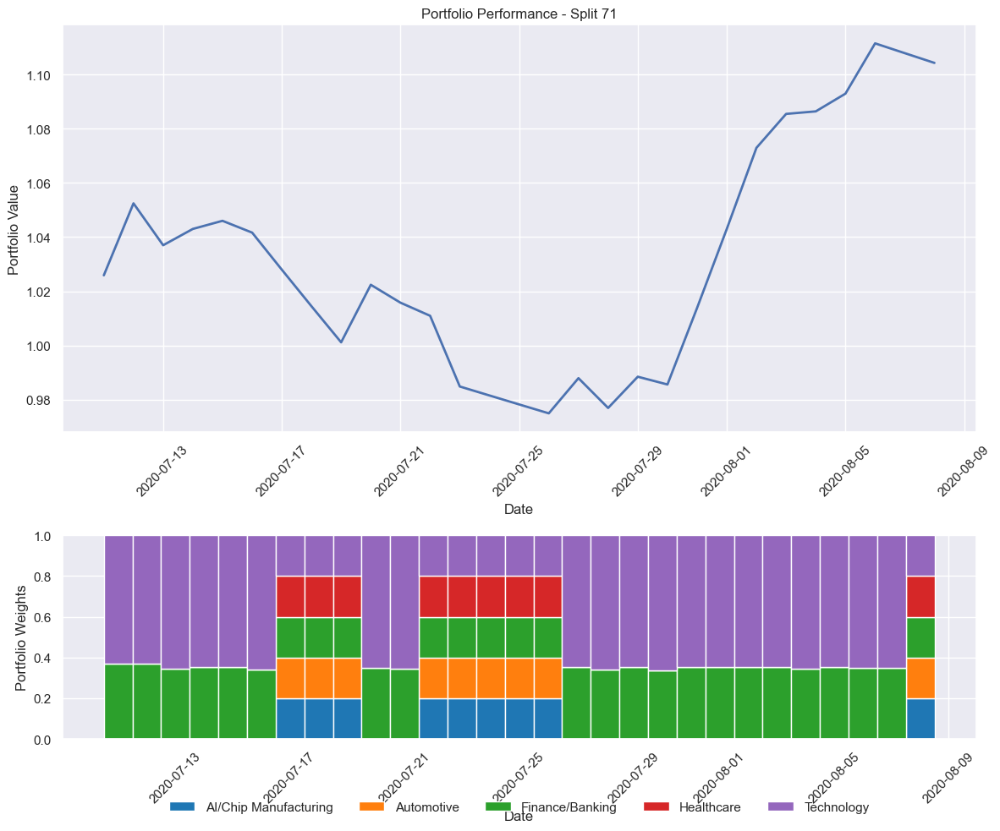


Processing split 72/124
Train period: 2014-01-02 00:00:00 to 2020-07-10 00:00:00
Validation period: 2020-07-11 00:00:00 to 2020-08-09 00:00:00
Test period: 2020-08-10 00:00:00 to 2020-09-08 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9196
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 406  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 397          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

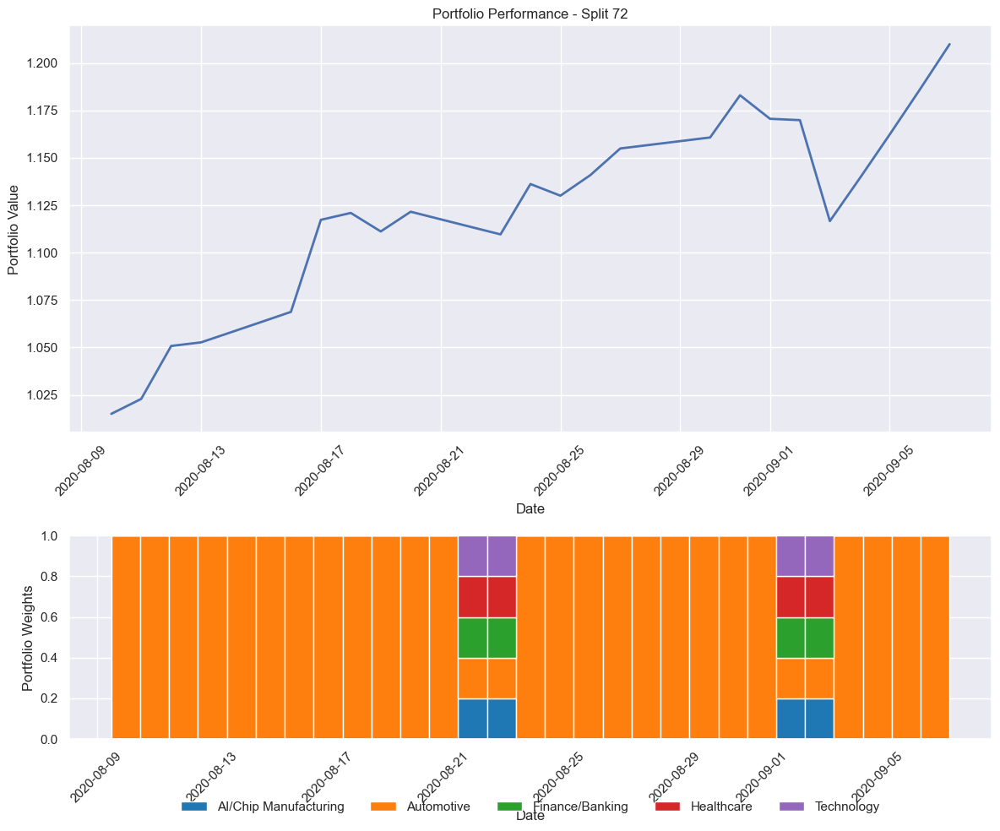


Processing split 73/124
Train period: 2014-01-02 00:00:00 to 2020-08-09 00:00:00
Validation period: 2020-08-10 00:00:00 to 2020-09-08 00:00:00
Test period: 2020-09-09 00:00:00 to 2020-10-08 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9503
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 421  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 403          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

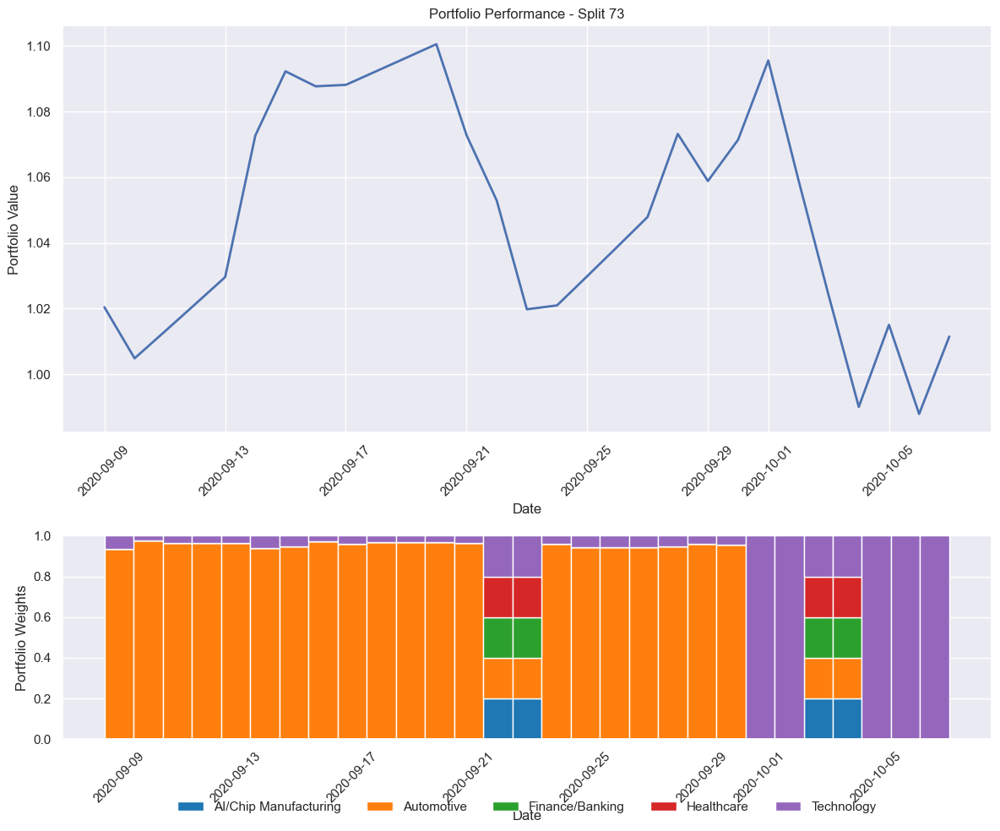


Processing split 74/124
Train period: 2014-01-02 00:00:00 to 2020-09-08 00:00:00
Validation period: 2020-09-09 00:00:00 to 2020-10-08 00:00:00
Test period: 2020-10-09 00:00:00 to 2020-11-07 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9209
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 409  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 399          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

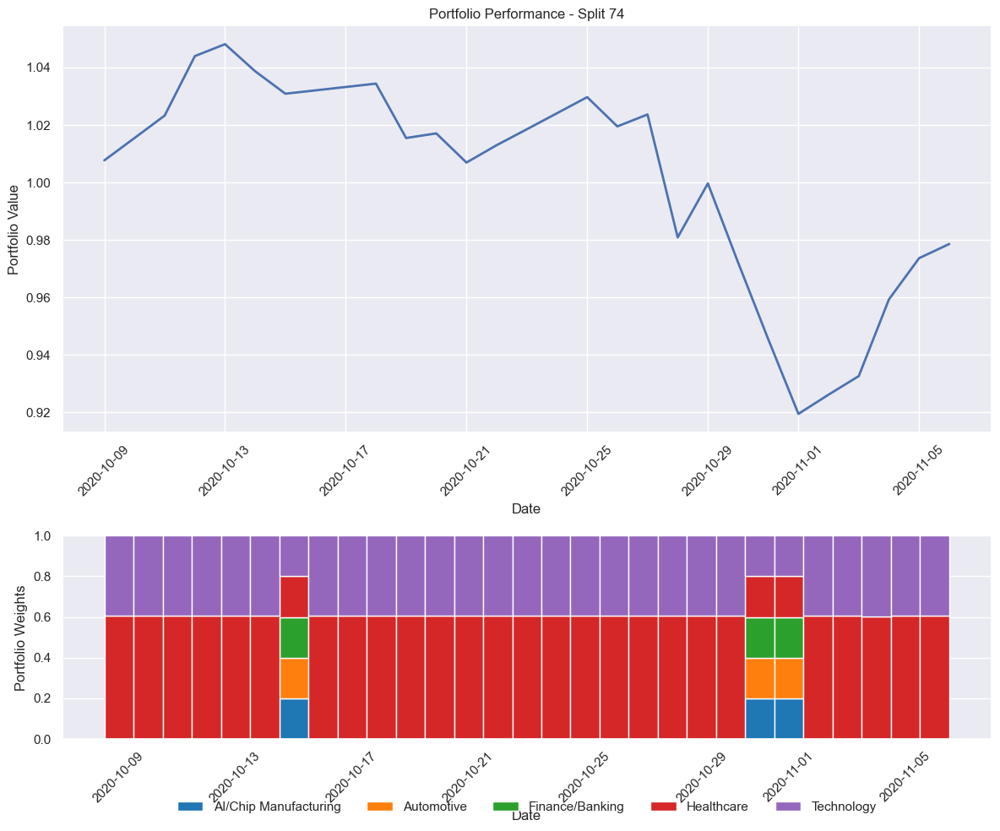


Processing split 75/124
Train period: 2014-01-02 00:00:00 to 2020-10-08 00:00:00
Validation period: 2020-10-09 00:00:00 to 2020-11-07 00:00:00
Test period: 2020-11-08 00:00:00 to 2020-12-07 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9437
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 363  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 373          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

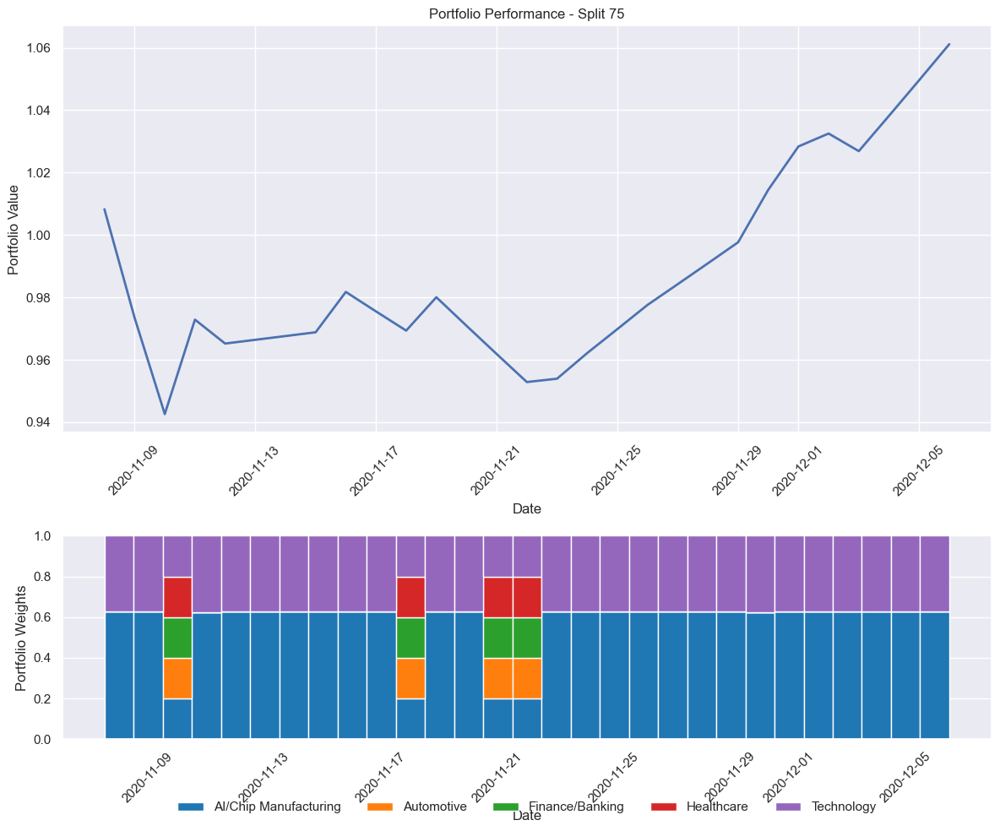


Processing split 76/124
Train period: 2014-01-02 00:00:00 to 2020-11-07 00:00:00
Validation period: 2020-11-08 00:00:00 to 2020-12-07 00:00:00
Test period: 2020-12-08 00:00:00 to 2021-01-06 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9117
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 408  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 396          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

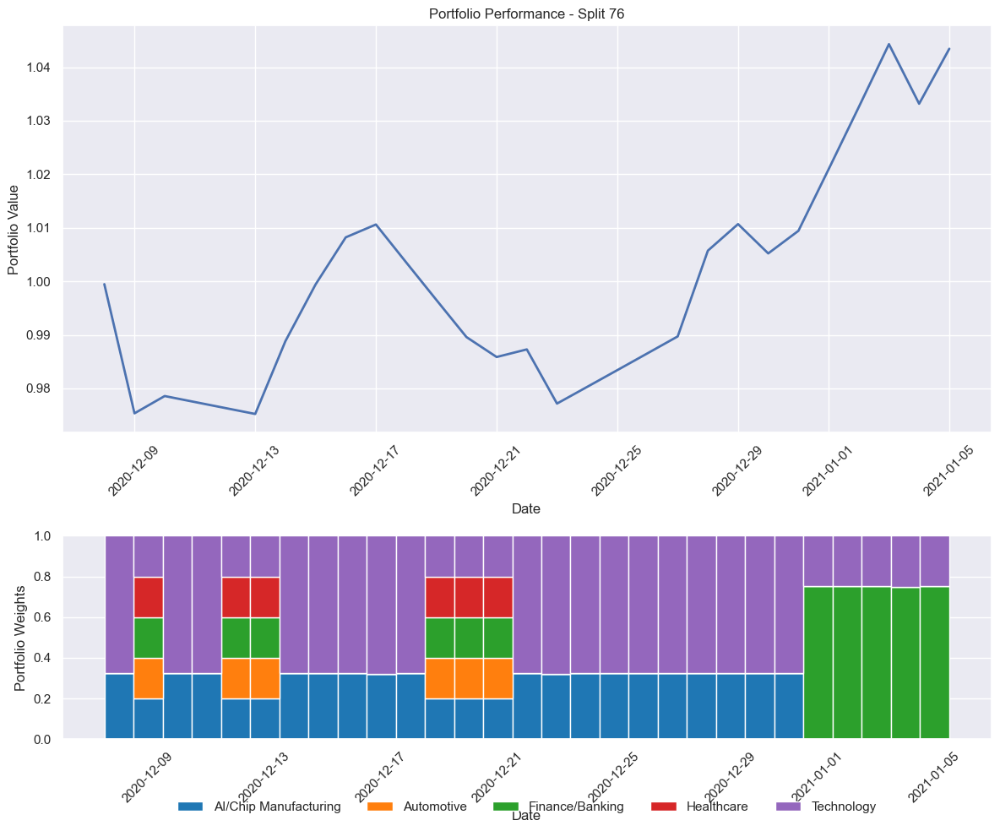


Processing split 77/124
Train period: 2014-01-02 00:00:00 to 2020-12-07 00:00:00
Validation period: 2020-12-08 00:00:00 to 2021-01-06 00:00:00
Test period: 2021-01-07 00:00:00 to 2021-02-05 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.0352
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 408  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 397          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

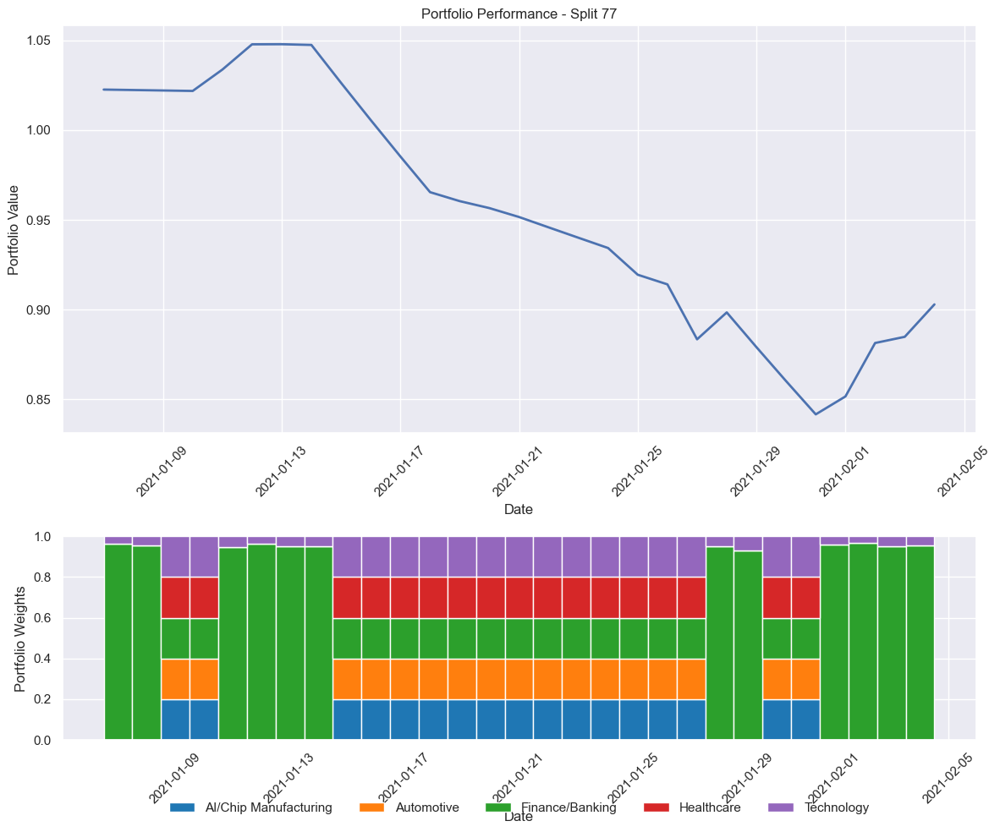


Processing split 78/124
Train period: 2014-01-02 00:00:00 to 2021-01-06 00:00:00
Validation period: 2021-01-07 00:00:00 to 2021-02-05 00:00:00
Test period: 2021-02-06 00:00:00 to 2021-03-07 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9858
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 403  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 393          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

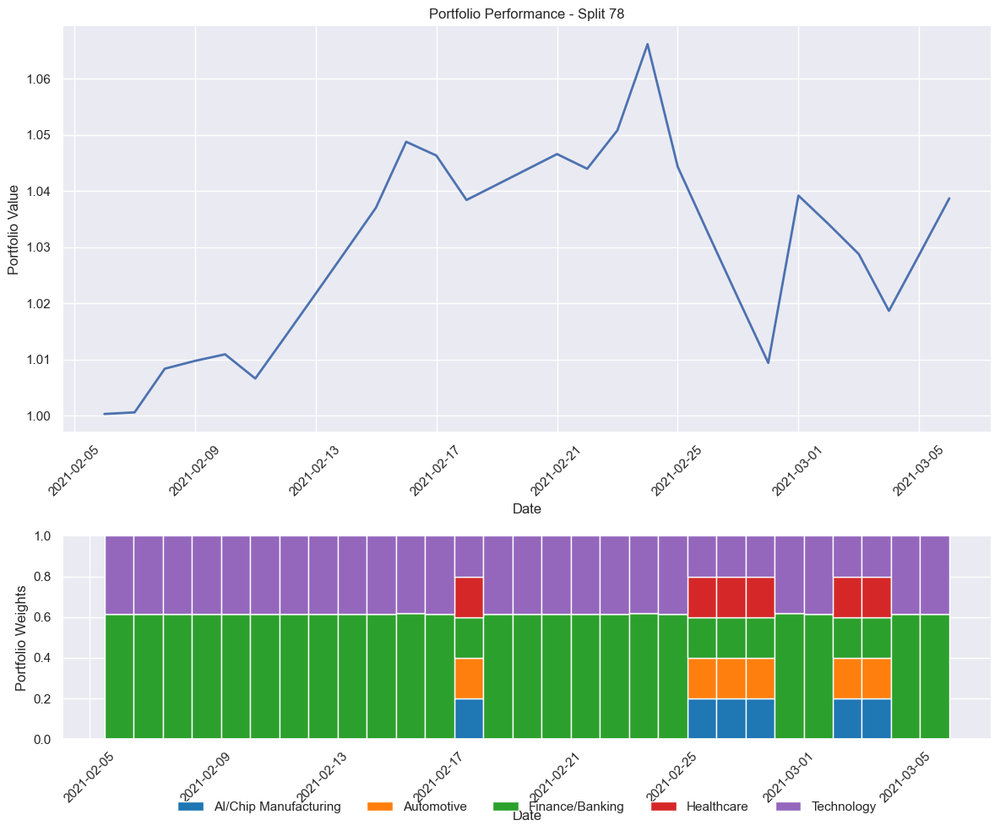


Processing split 79/124
Train period: 2014-01-02 00:00:00 to 2021-02-05 00:00:00
Validation period: 2021-02-06 00:00:00 to 2021-03-07 00:00:00
Test period: 2021-03-08 00:00:00 to 2021-04-06 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9821
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 408  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 409          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

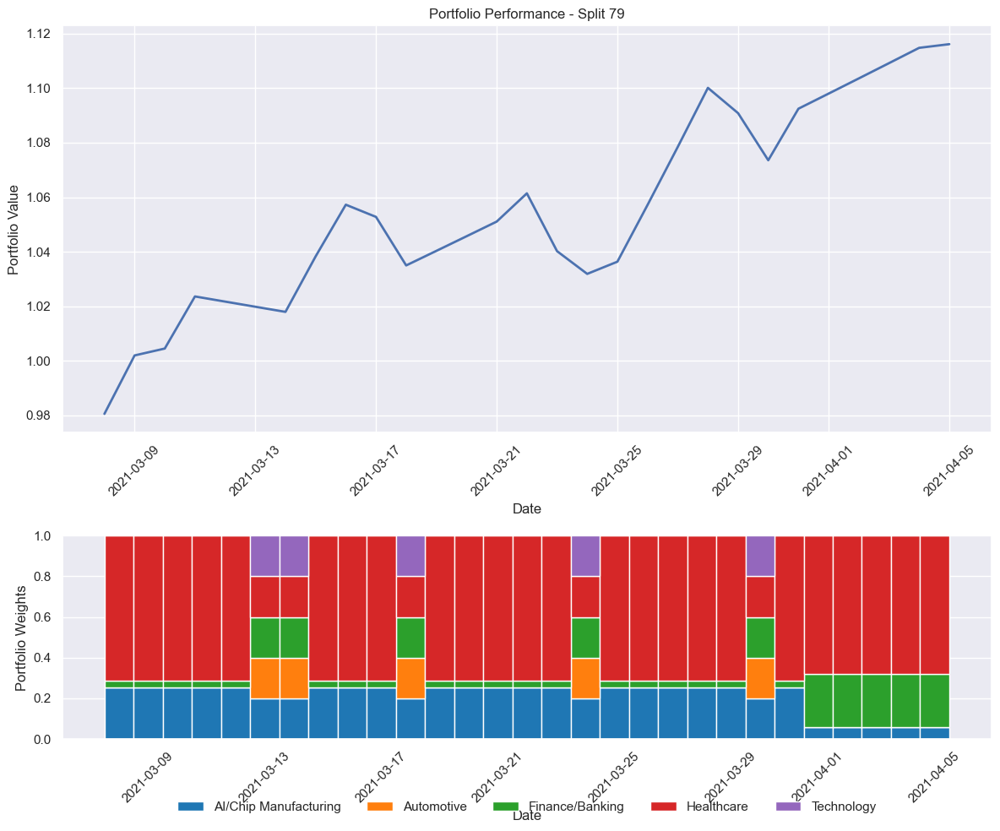


Processing split 80/124
Train period: 2014-01-02 00:00:00 to 2021-03-07 00:00:00
Validation period: 2021-03-08 00:00:00 to 2021-04-06 00:00:00
Test period: 2021-04-07 00:00:00 to 2021-05-06 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9676
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 412  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 405          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

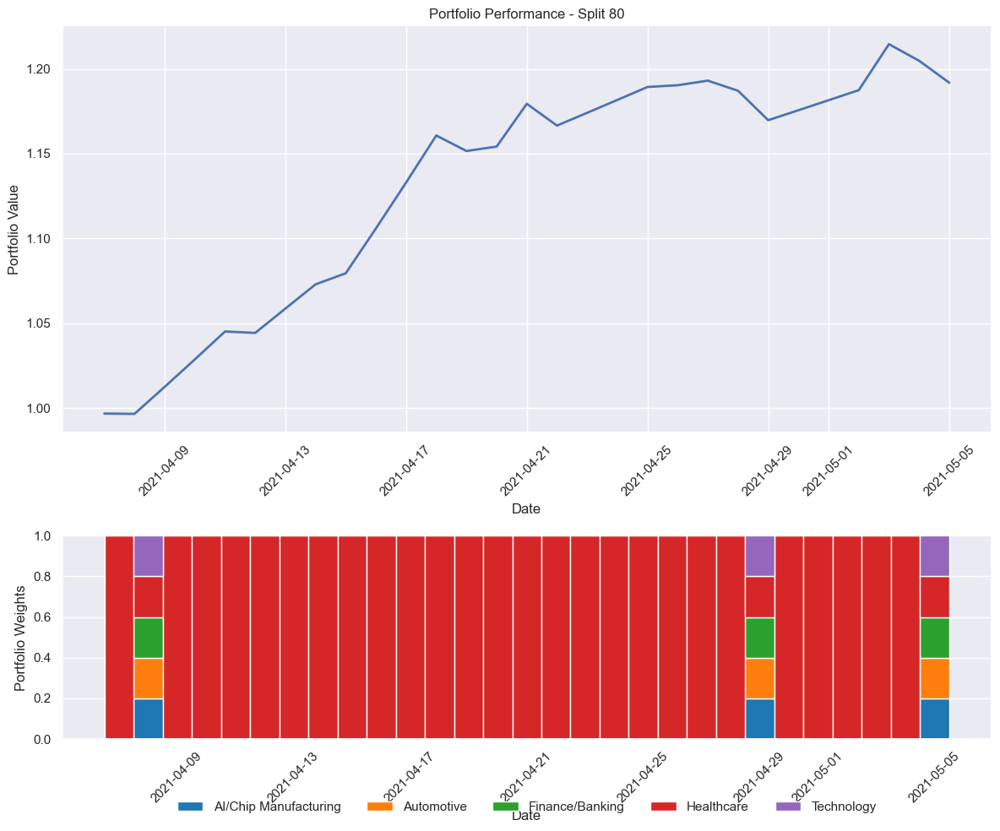


Processing split 81/124
Train period: 2014-01-02 00:00:00 to 2021-04-06 00:00:00
Validation period: 2021-04-07 00:00:00 to 2021-05-06 00:00:00
Test period: 2021-05-07 00:00:00 to 2021-06-05 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.0199
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 400  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 397          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

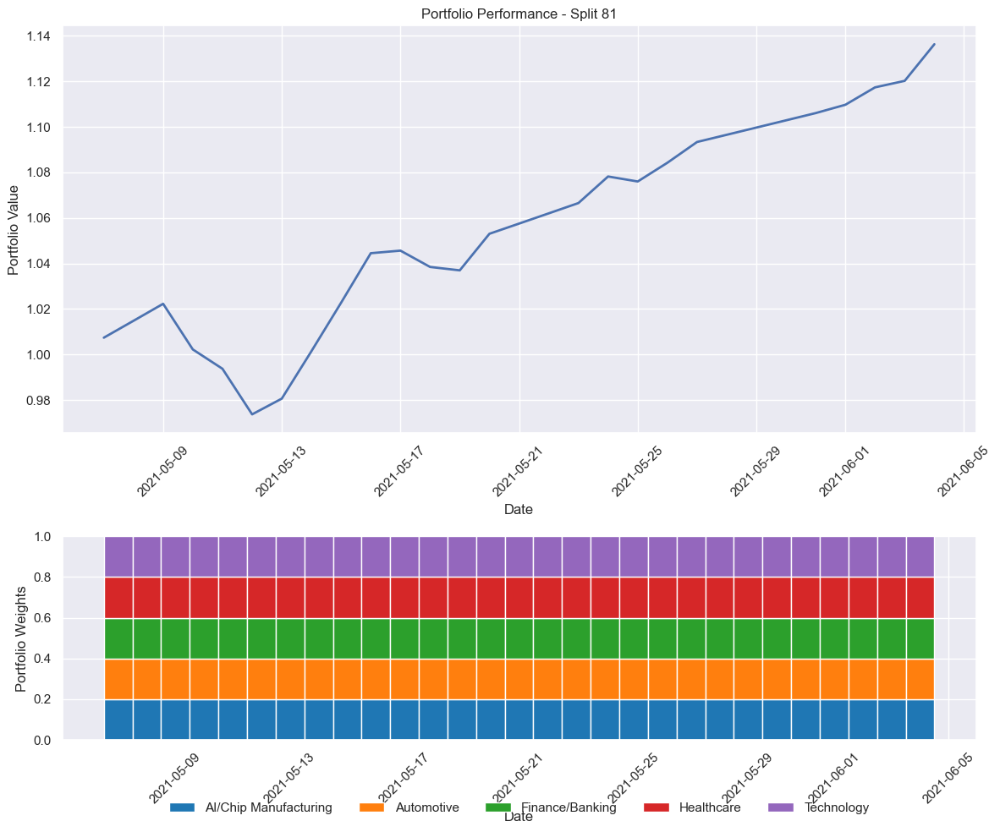


Processing split 82/124
Train period: 2014-01-02 00:00:00 to 2021-05-06 00:00:00
Validation period: 2021-05-07 00:00:00 to 2021-06-05 00:00:00
Test period: 2021-06-06 00:00:00 to 2021-07-05 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.0574
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 412  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 405          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

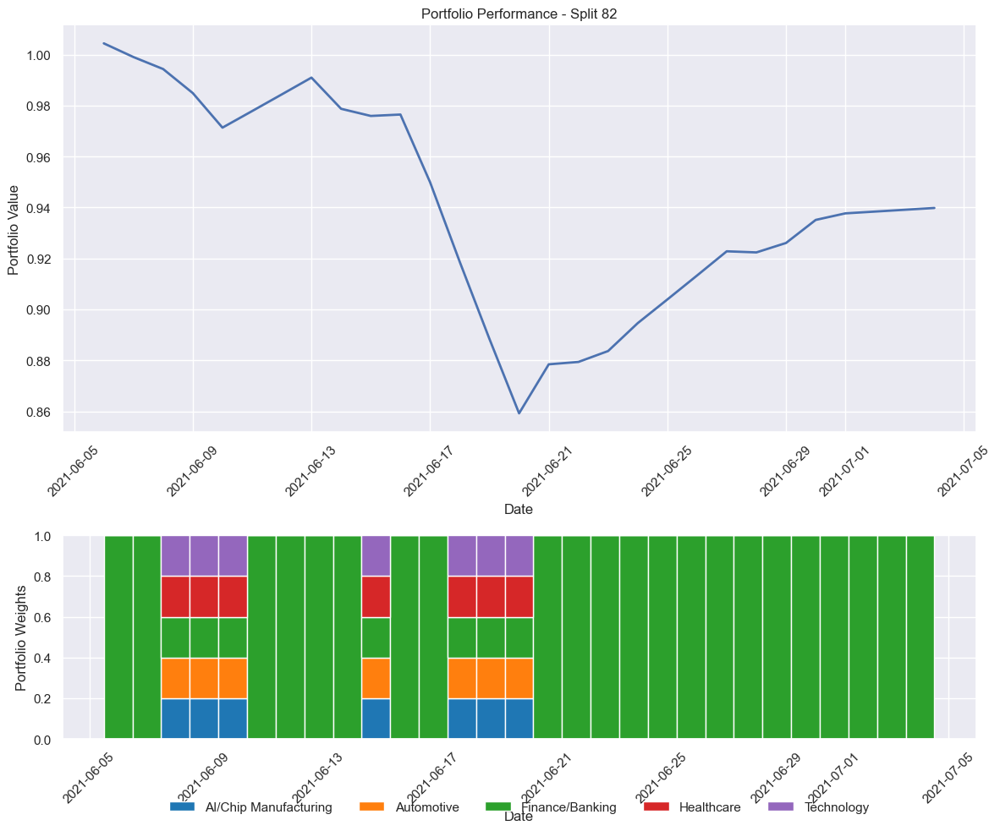


Processing split 83/124
Train period: 2014-01-02 00:00:00 to 2021-06-05 00:00:00
Validation period: 2021-06-06 00:00:00 to 2021-07-05 00:00:00
Test period: 2021-07-06 00:00:00 to 2021-08-04 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.1118
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 415  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 407          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

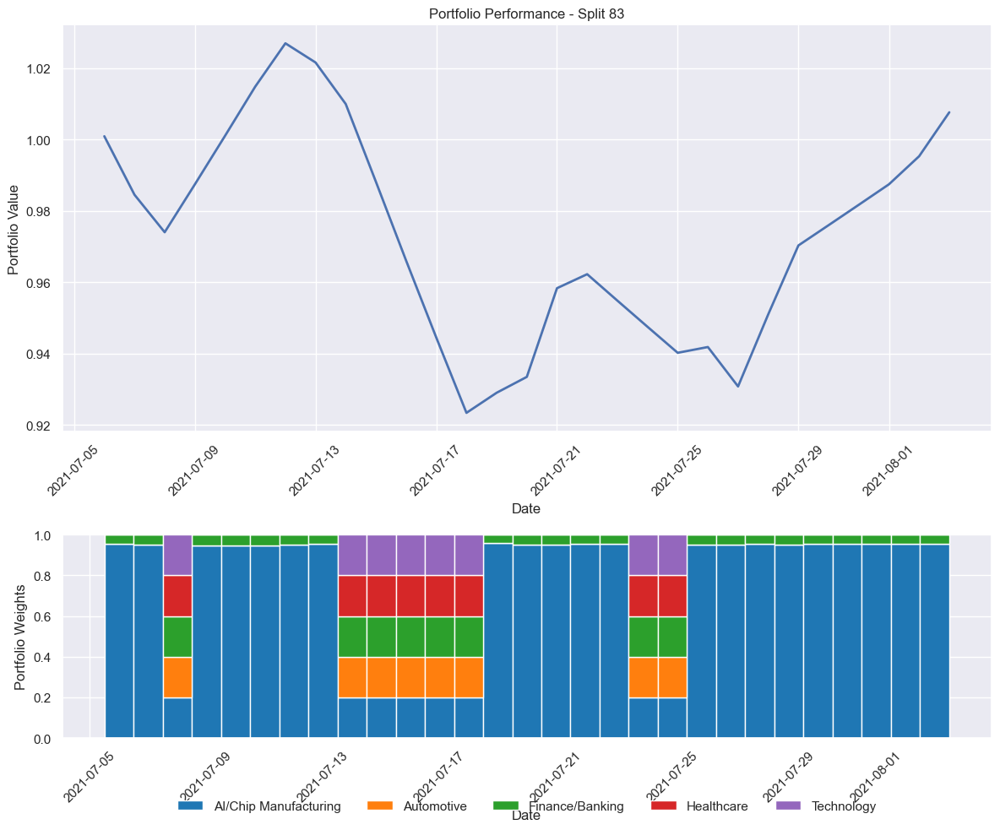


Processing split 84/124
Train period: 2014-01-02 00:00:00 to 2021-07-05 00:00:00
Validation period: 2021-07-06 00:00:00 to 2021-08-04 00:00:00
Test period: 2021-08-05 00:00:00 to 2021-09-03 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.1312
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 421  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 406          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

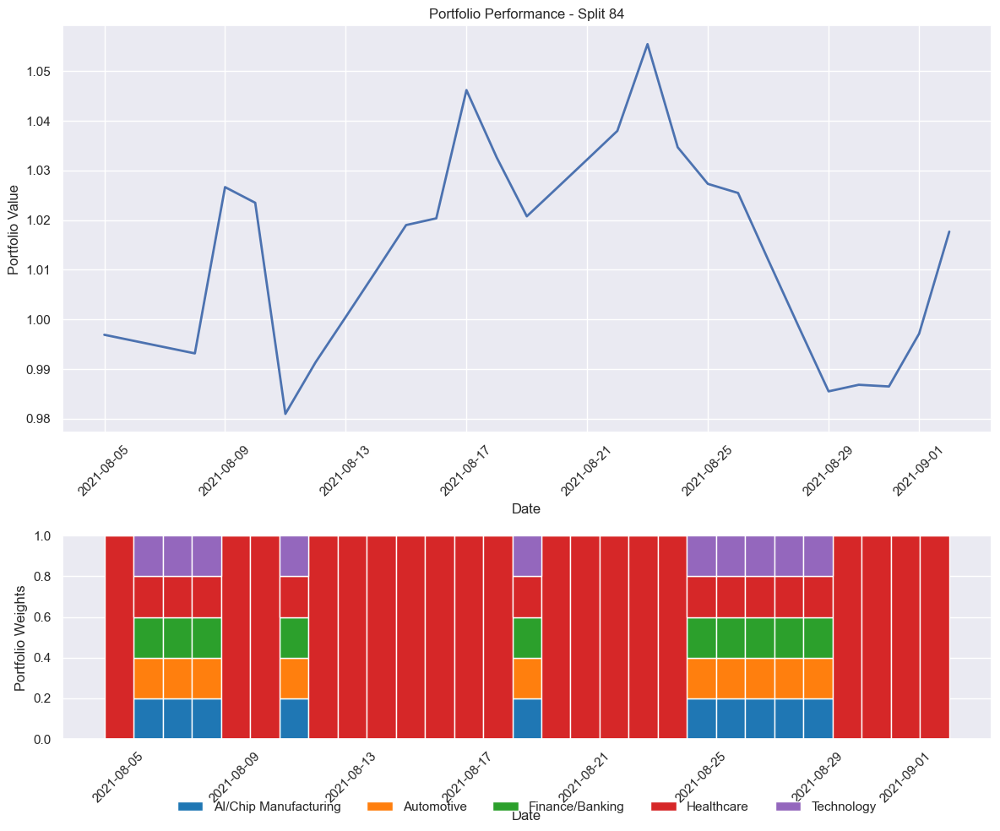


Processing split 85/124
Train period: 2014-01-02 00:00:00 to 2021-08-04 00:00:00
Validation period: 2021-08-05 00:00:00 to 2021-09-03 00:00:00
Test period: 2021-09-04 00:00:00 to 2021-10-03 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.1914
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 425  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 407          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

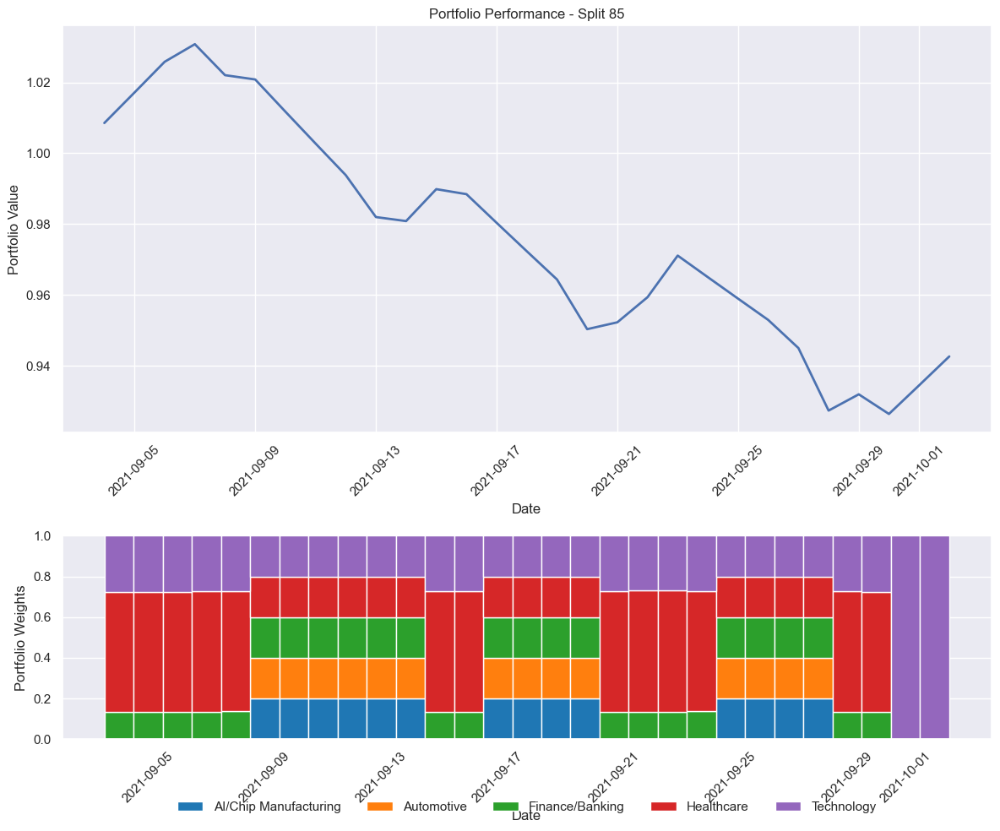


Processing split 86/124
Train period: 2014-01-02 00:00:00 to 2021-09-03 00:00:00
Validation period: 2021-09-04 00:00:00 to 2021-10-03 00:00:00
Test period: 2021-10-04 00:00:00 to 2021-11-02 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.2086
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 409  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 400          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

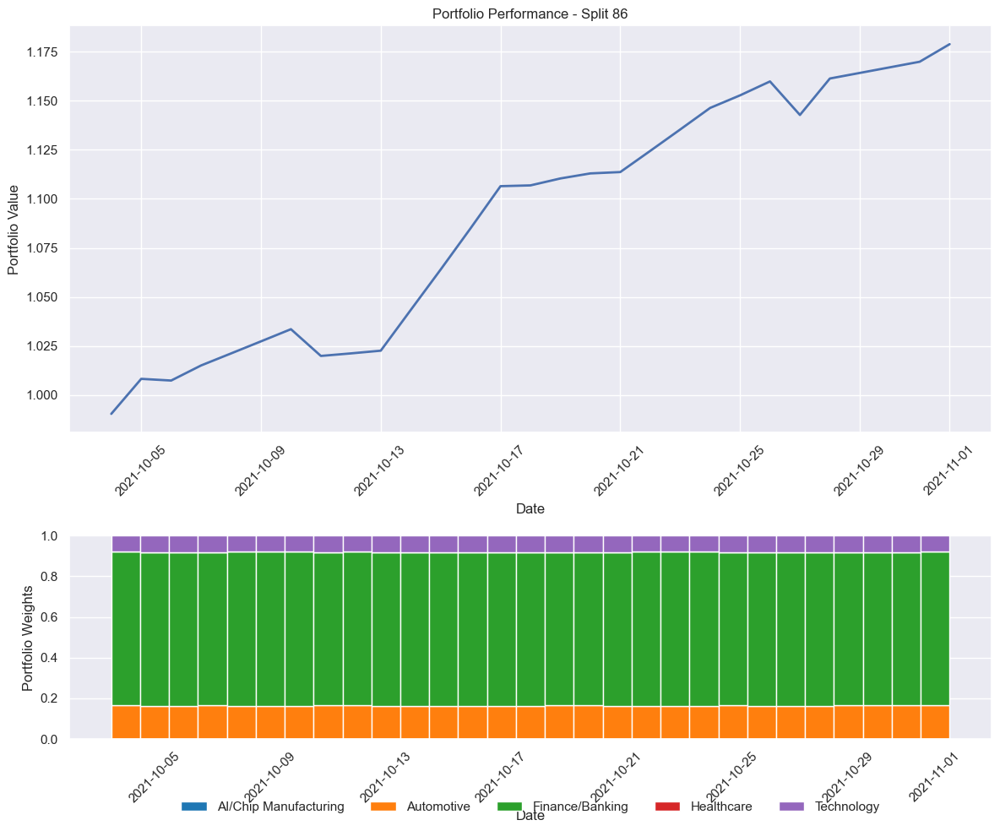


Processing split 87/124
Train period: 2014-01-02 00:00:00 to 2021-10-03 00:00:00
Validation period: 2021-10-04 00:00:00 to 2021-11-02 00:00:00
Test period: 2021-11-03 00:00:00 to 2021-12-02 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.1618
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 431  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 405          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

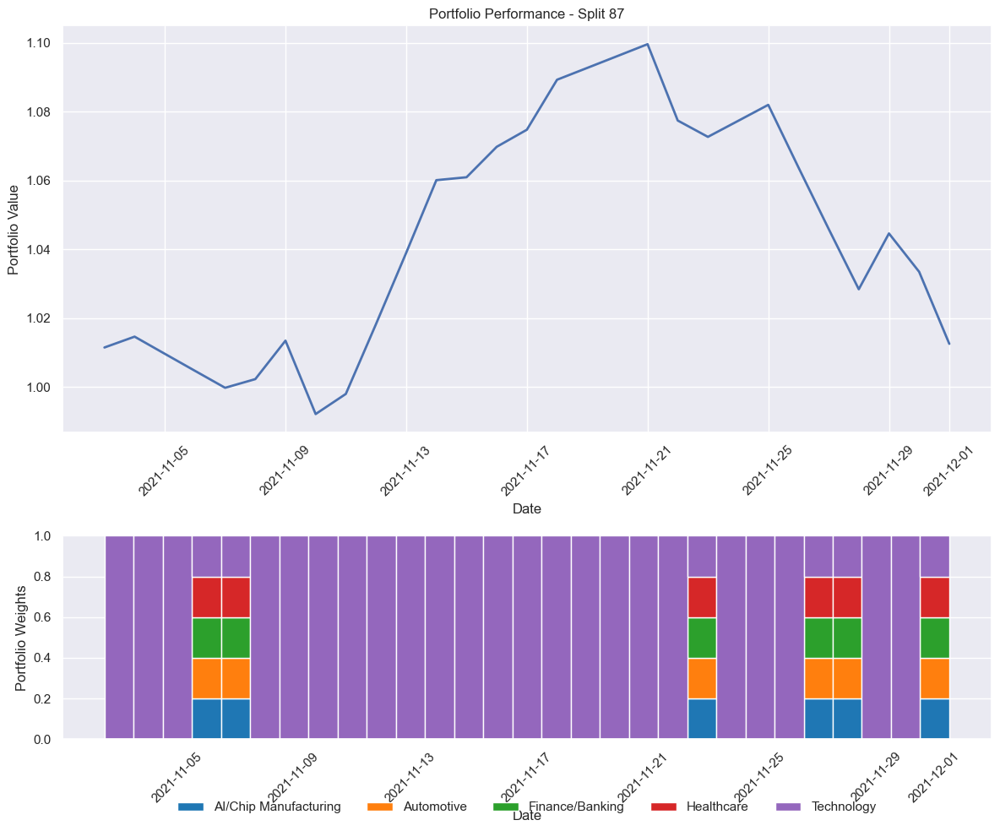


Processing split 88/124
Train period: 2014-01-02 00:00:00 to 2021-11-02 00:00:00
Validation period: 2021-11-03 00:00:00 to 2021-12-02 00:00:00
Test period: 2021-12-03 00:00:00 to 2022-01-01 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.1703
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 406  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 408          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

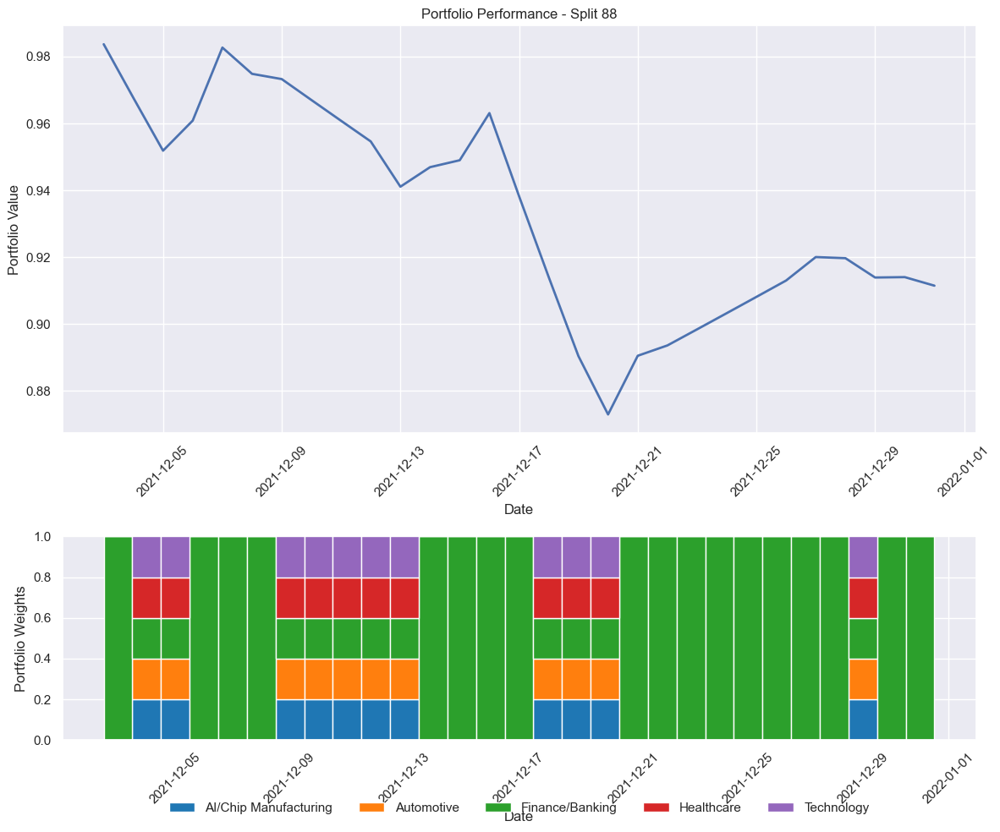


Processing split 89/124
Train period: 2014-01-02 00:00:00 to 2021-12-02 00:00:00
Validation period: 2021-12-03 00:00:00 to 2022-01-01 00:00:00
Test period: 2022-01-02 00:00:00 to 2022-01-31 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.1552
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 413  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 405          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

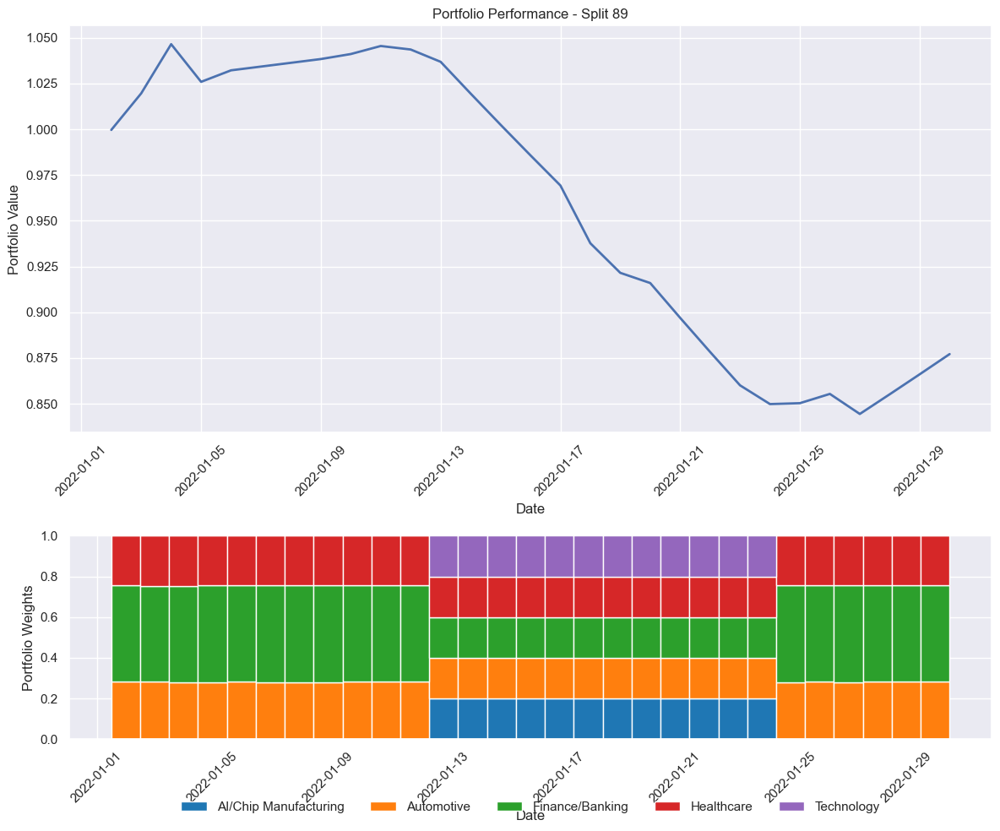


Processing split 90/124
Train period: 2014-01-02 00:00:00 to 2022-01-01 00:00:00
Validation period: 2022-01-02 00:00:00 to 2022-01-31 00:00:00
Test period: 2022-02-01 00:00:00 to 2022-03-02 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.1561
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 418  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 402          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

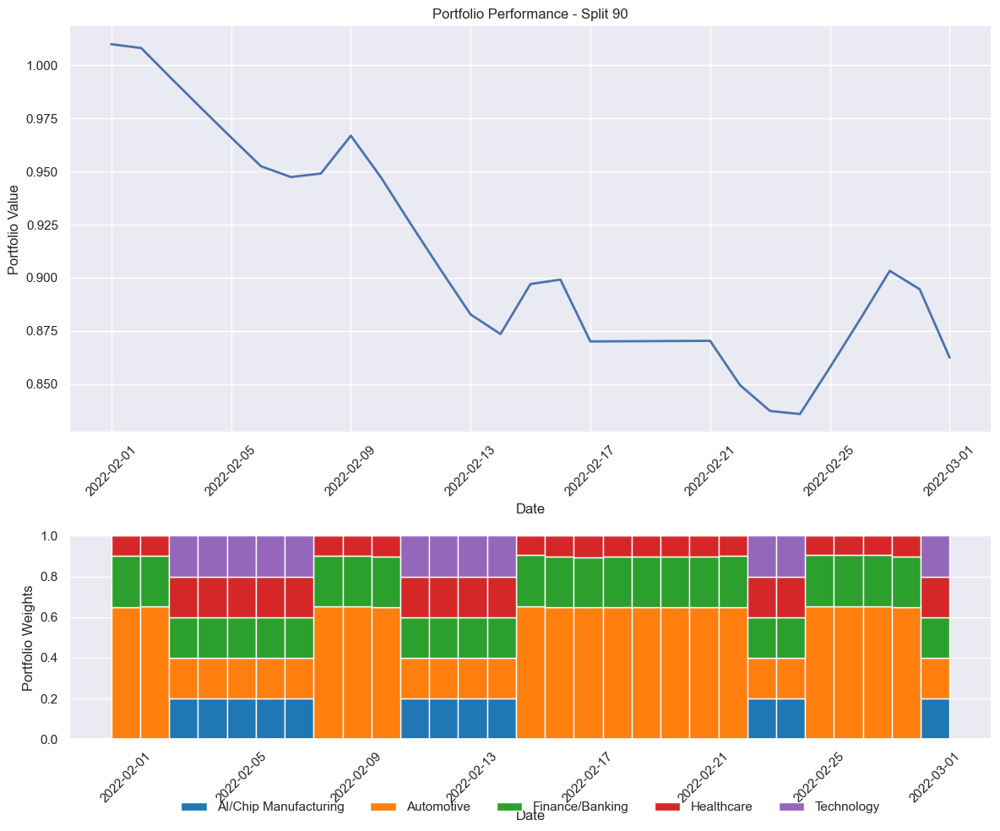


Processing split 91/124
Train period: 2014-01-02 00:00:00 to 2022-01-31 00:00:00
Validation period: 2022-02-01 00:00:00 to 2022-03-02 00:00:00
Test period: 2022-03-03 00:00:00 to 2022-04-01 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.0860
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 420  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 410          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

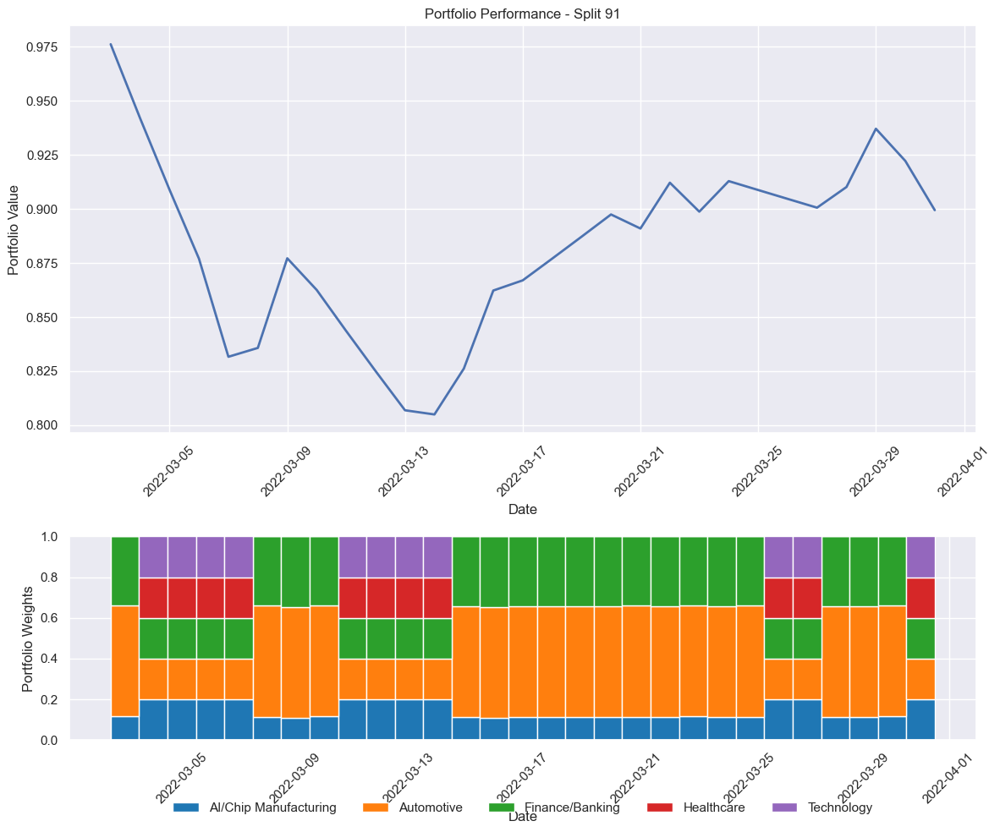


Processing split 92/124
Train period: 2014-01-02 00:00:00 to 2022-03-02 00:00:00
Validation period: 2022-03-03 00:00:00 to 2022-04-01 00:00:00
Test period: 2022-04-02 00:00:00 to 2022-05-01 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.0407
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 419  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 409          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

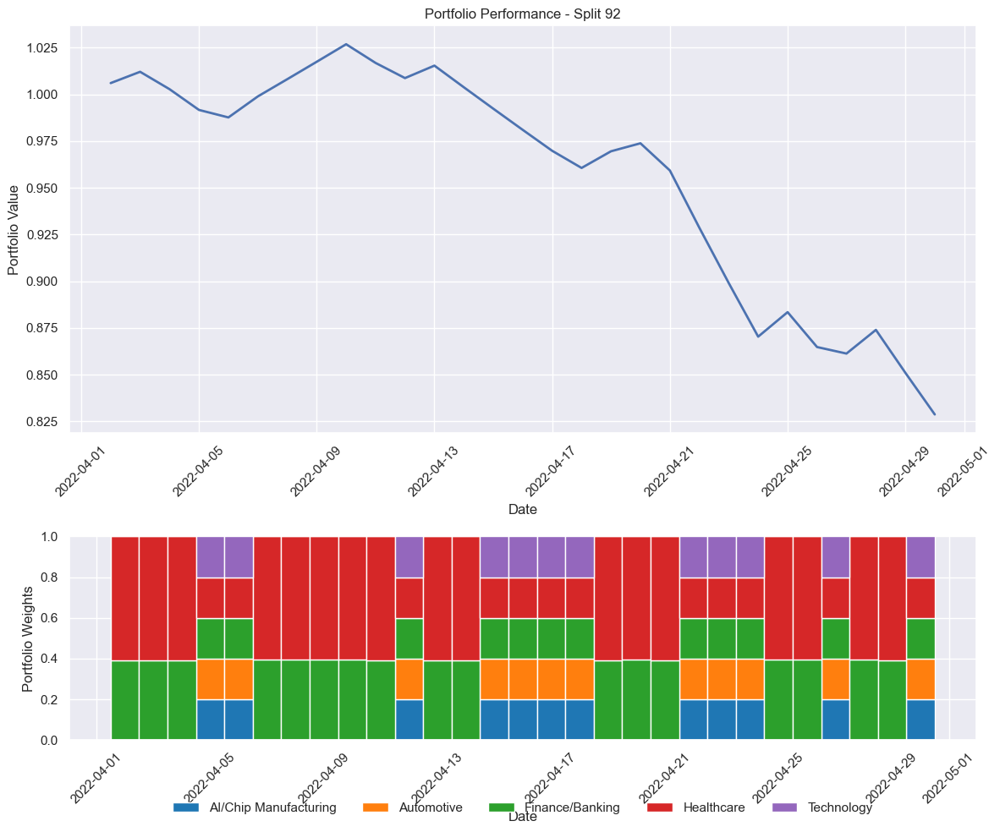


Processing split 93/124
Train period: 2014-01-02 00:00:00 to 2022-04-01 00:00:00
Validation period: 2022-04-02 00:00:00 to 2022-05-01 00:00:00
Test period: 2022-05-02 00:00:00 to 2022-05-31 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 1.0426
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 413  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 400          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

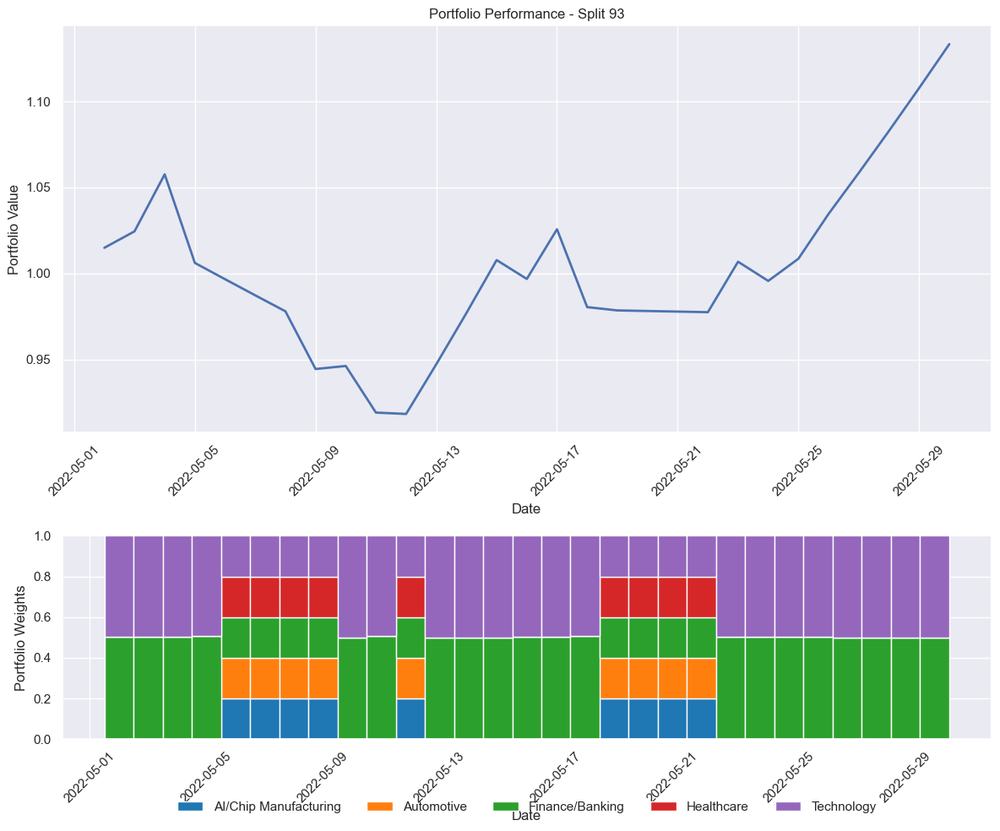


Processing split 94/124
Train period: 2014-01-02 00:00:00 to 2022-05-01 00:00:00
Validation period: 2022-05-02 00:00:00 to 2022-05-31 00:00:00
Test period: 2022-06-01 00:00:00 to 2022-06-30 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8921
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 418  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 414          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

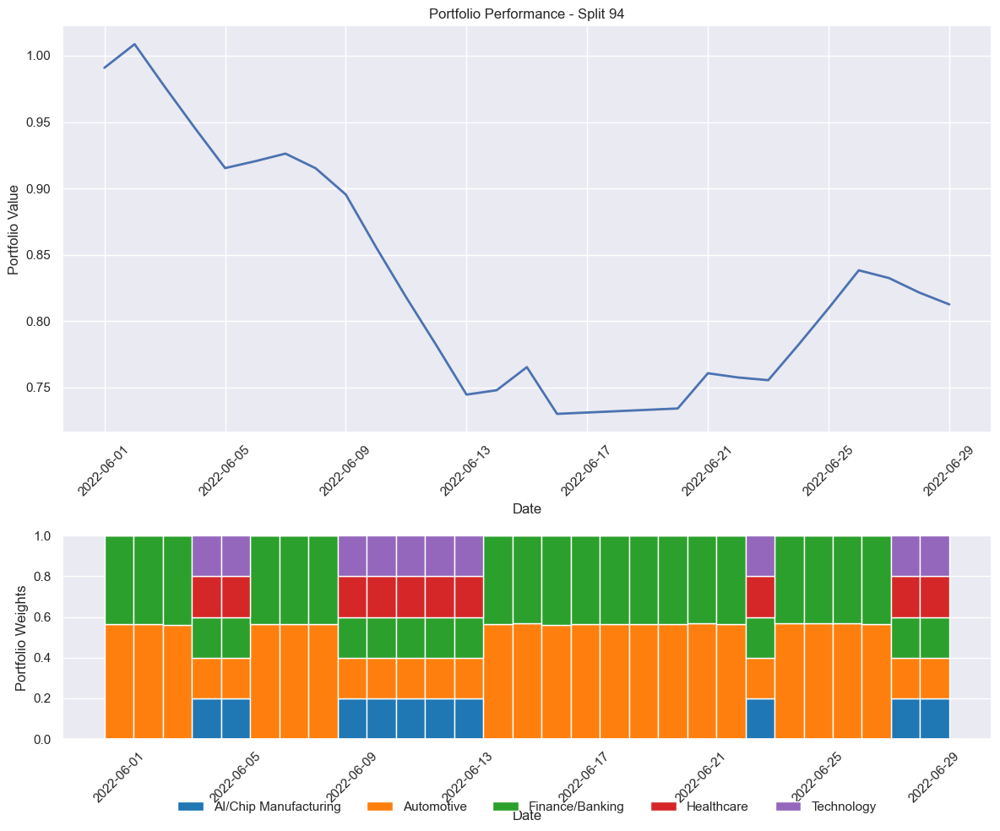


Processing split 95/124
Train period: 2014-01-02 00:00:00 to 2022-05-31 00:00:00
Validation period: 2022-06-01 00:00:00 to 2022-06-30 00:00:00
Test period: 2022-07-01 00:00:00 to 2022-07-30 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9475
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 404  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 397          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

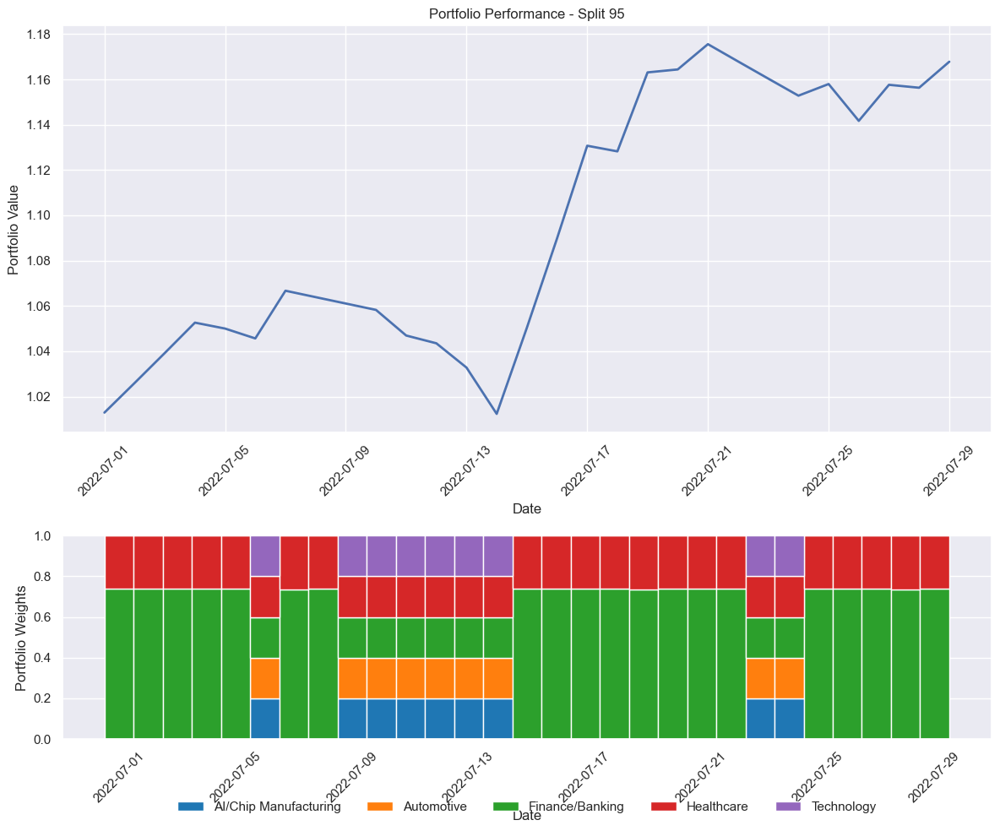


Processing split 96/124
Train period: 2014-01-02 00:00:00 to 2022-06-30 00:00:00
Validation period: 2022-07-01 00:00:00 to 2022-07-30 00:00:00
Test period: 2022-07-31 00:00:00 to 2022-08-29 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8778
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 444  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 432          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

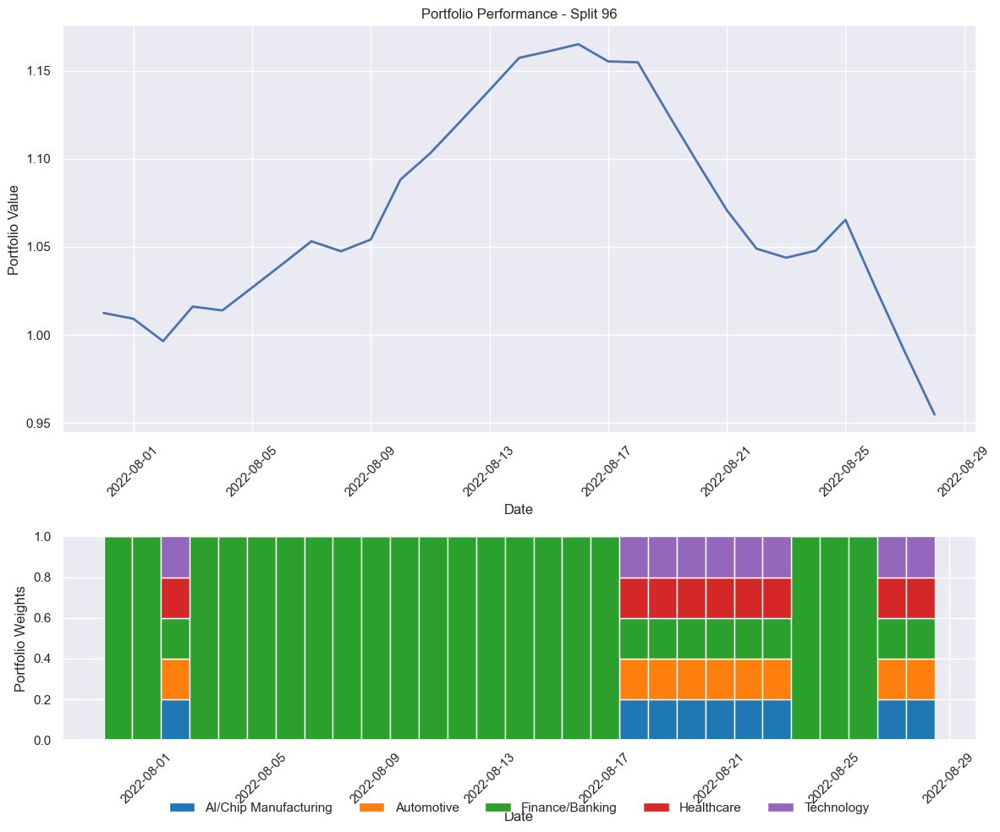


Processing split 97/124
Train period: 2014-01-02 00:00:00 to 2022-07-30 00:00:00
Validation period: 2022-07-31 00:00:00 to 2022-08-29 00:00:00
Test period: 2022-08-30 00:00:00 to 2022-09-28 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9012
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 443  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 434          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

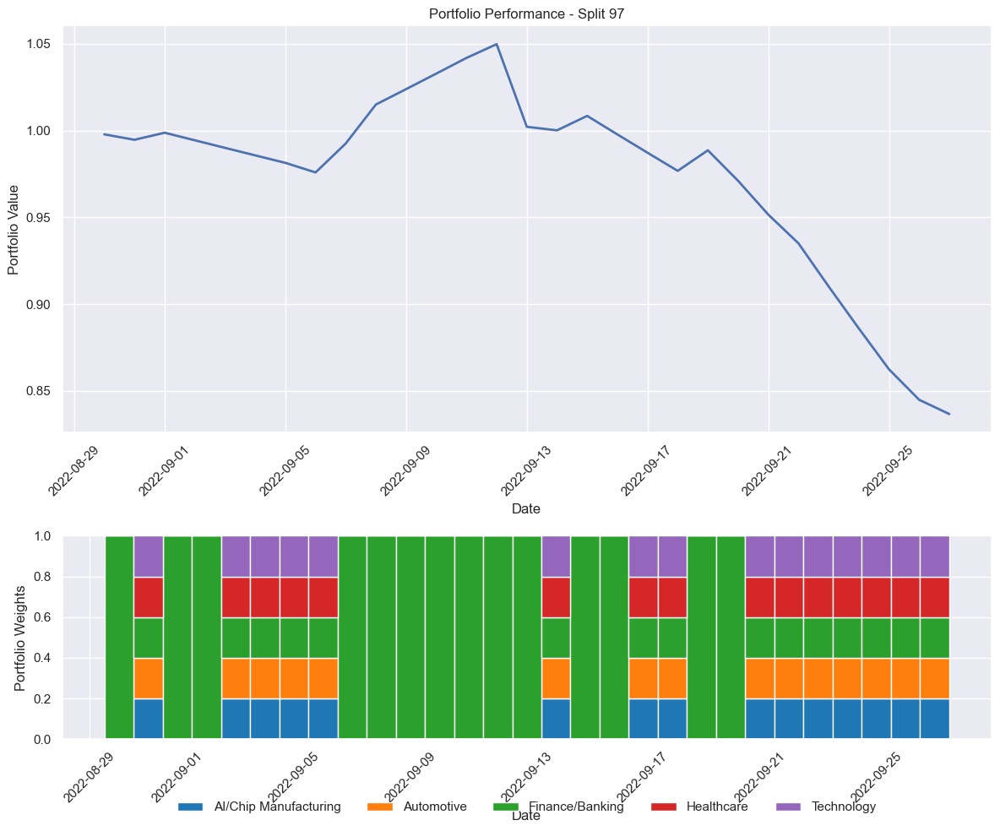


Processing split 98/124
Train period: 2014-01-02 00:00:00 to 2022-08-29 00:00:00
Validation period: 2022-08-30 00:00:00 to 2022-09-28 00:00:00
Test period: 2022-09-29 00:00:00 to 2022-10-28 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8248
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 448  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 432          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

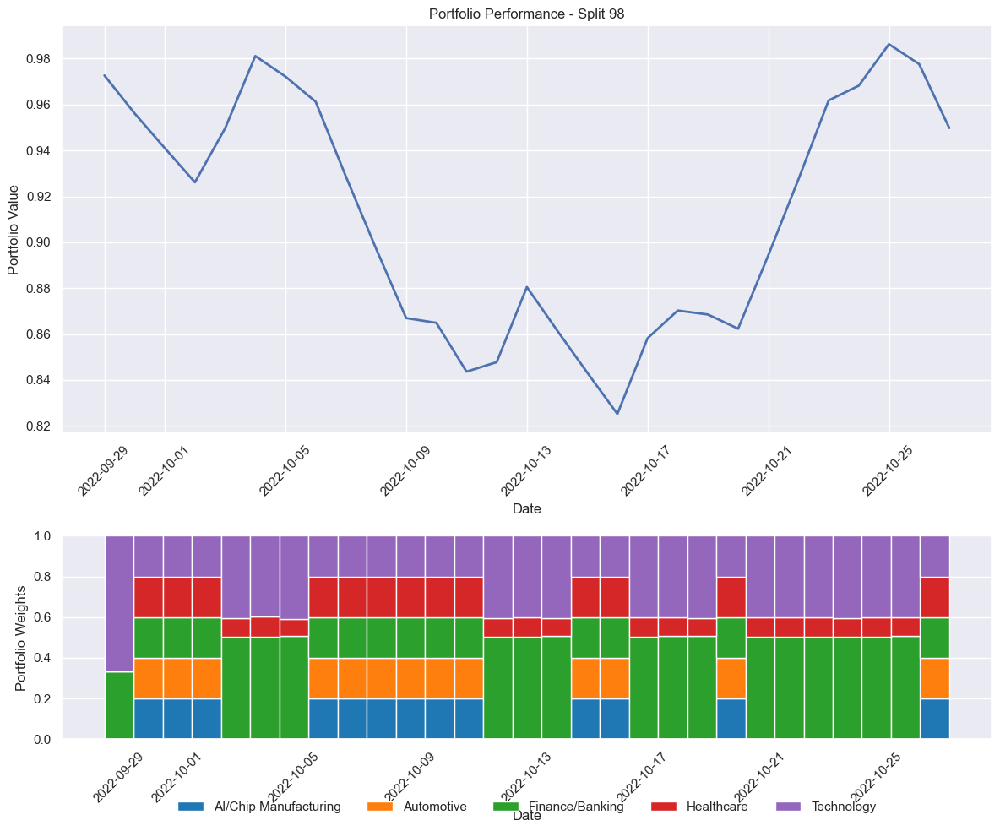


Processing split 99/124
Train period: 2014-01-02 00:00:00 to 2022-09-28 00:00:00
Validation period: 2022-09-29 00:00:00 to 2022-10-28 00:00:00
Test period: 2022-10-29 00:00:00 to 2022-11-27 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.7754
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 442  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 432          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range         

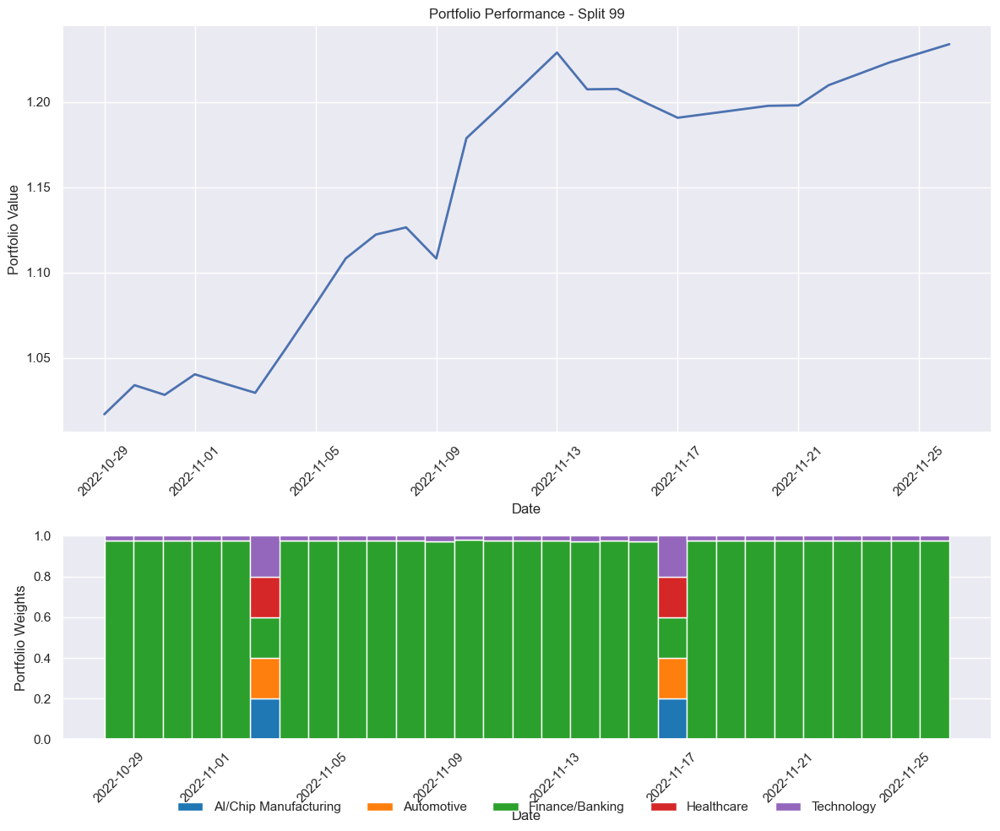


Processing split 100/124
Train period: 2014-01-02 00:00:00 to 2022-10-28 00:00:00
Validation period: 2022-10-29 00:00:00 to 2022-11-27 00:00:00
Test period: 2022-11-28 00:00:00 to 2022-12-27 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.7781
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 440  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 429          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

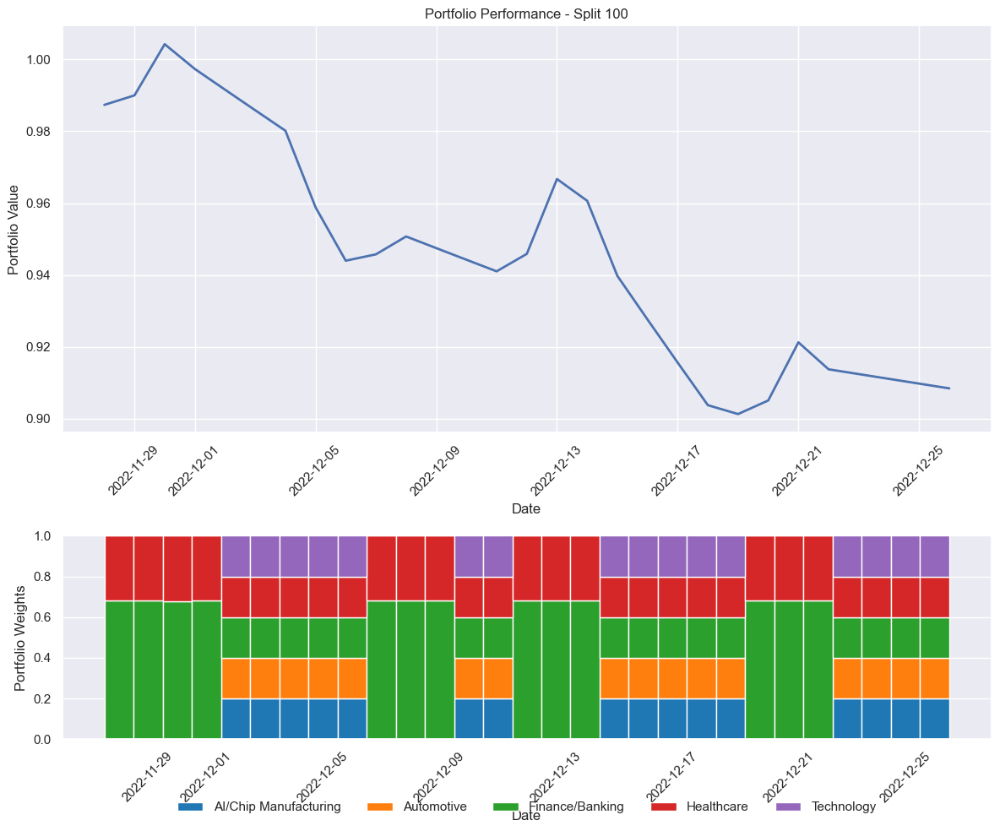


Processing split 101/124
Train period: 2014-01-02 00:00:00 to 2022-11-27 00:00:00
Validation period: 2022-11-28 00:00:00 to 2022-12-27 00:00:00
Test period: 2022-12-28 00:00:00 to 2023-01-26 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8493
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 445  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 433          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

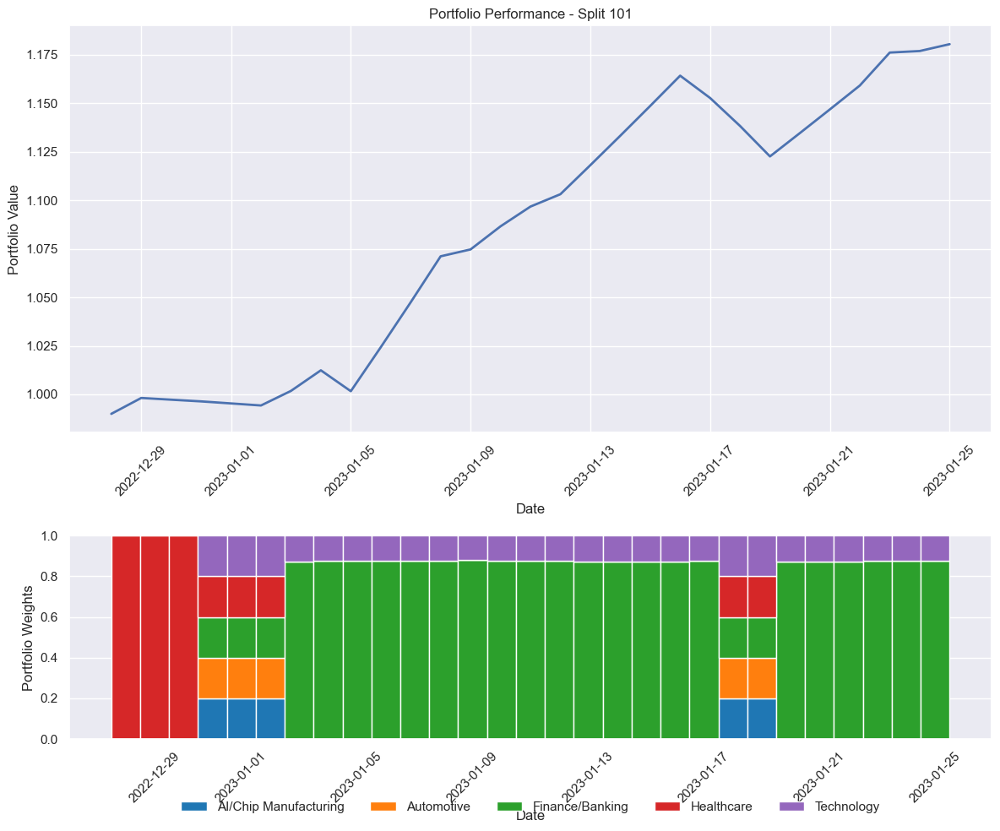


Processing split 102/124
Train period: 2014-01-02 00:00:00 to 2022-12-27 00:00:00
Validation period: 2022-12-28 00:00:00 to 2023-01-26 00:00:00
Test period: 2023-01-27 00:00:00 to 2023-02-25 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.7921
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 445  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 434          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

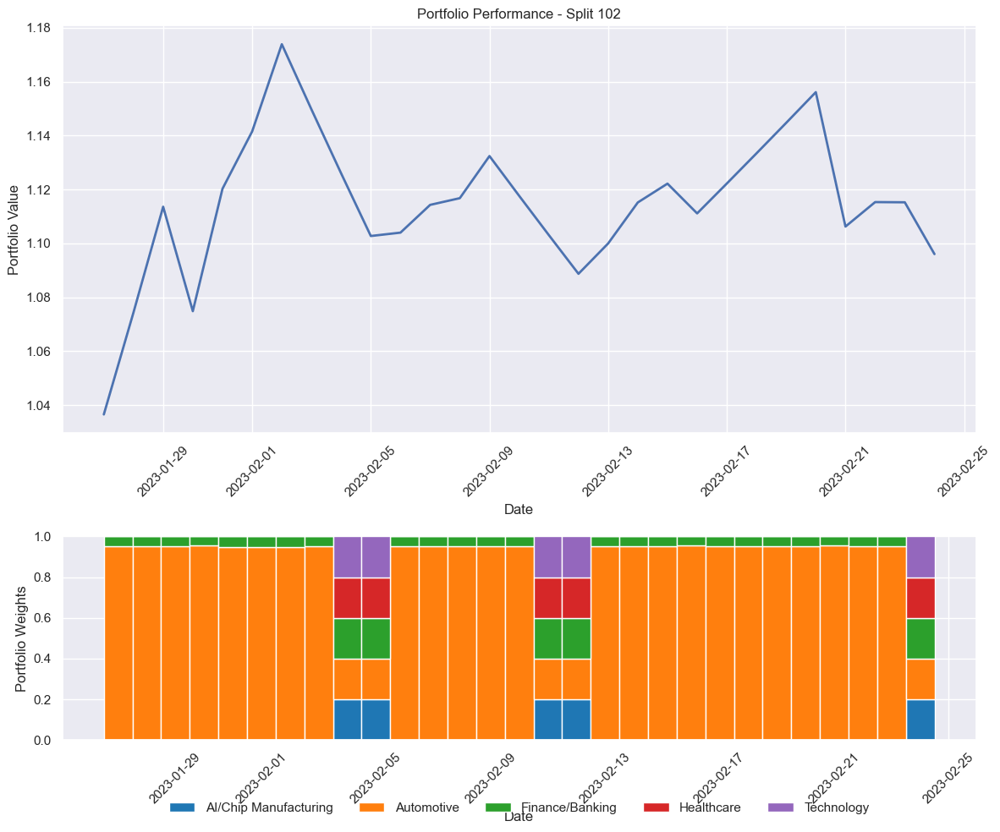


Processing split 103/124
Train period: 2014-01-02 00:00:00 to 2023-01-26 00:00:00
Validation period: 2023-01-27 00:00:00 to 2023-02-25 00:00:00
Test period: 2023-02-26 00:00:00 to 2023-03-27 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8101
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 447  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 431          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

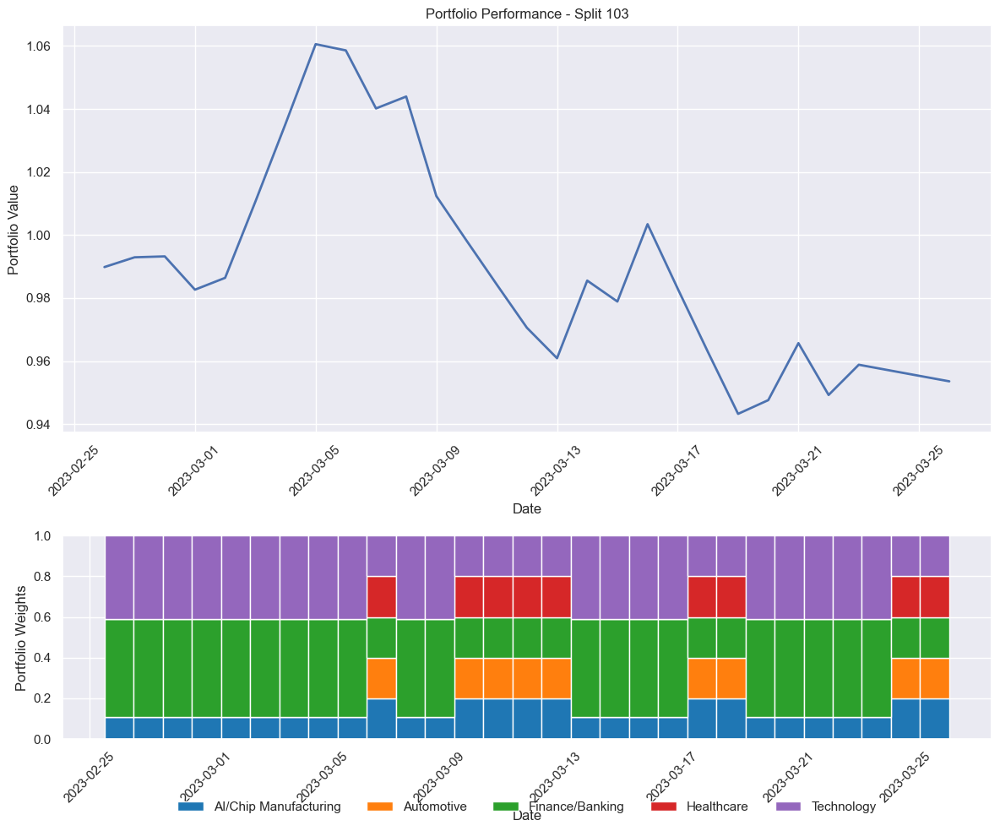


Processing split 104/124
Train period: 2014-01-02 00:00:00 to 2023-02-25 00:00:00
Validation period: 2023-02-26 00:00:00 to 2023-03-27 00:00:00
Test period: 2023-03-28 00:00:00 to 2023-04-26 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.7616
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 436  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 426          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

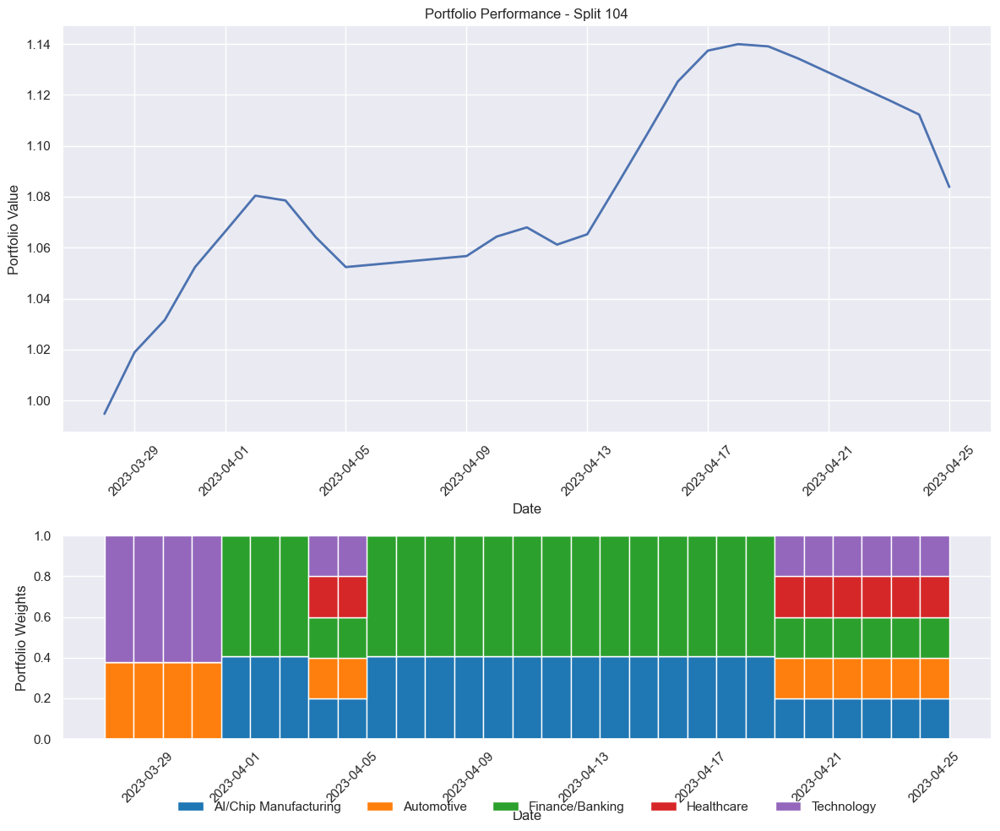


Processing split 105/124
Train period: 2014-01-02 00:00:00 to 2023-03-27 00:00:00
Validation period: 2023-03-28 00:00:00 to 2023-04-26 00:00:00
Test period: 2023-04-27 00:00:00 to 2023-05-26 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.7624
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 440  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 431          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

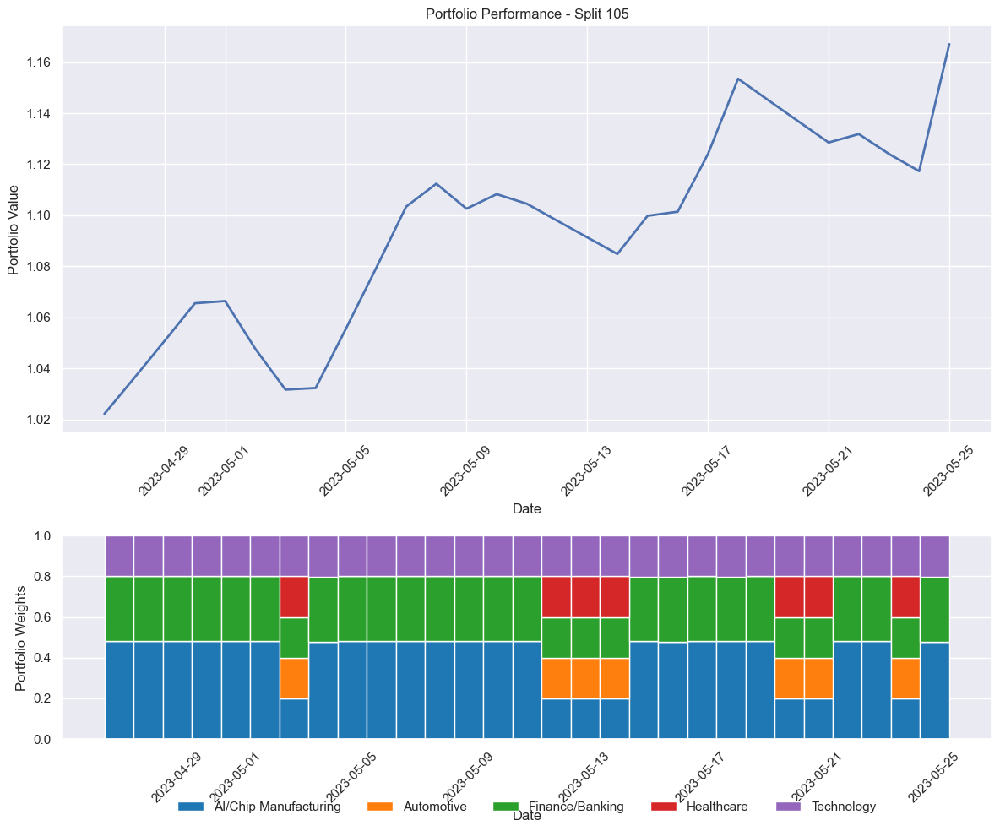


Processing split 106/124
Train period: 2014-01-02 00:00:00 to 2023-04-26 00:00:00
Validation period: 2023-04-27 00:00:00 to 2023-05-26 00:00:00
Test period: 2023-05-27 00:00:00 to 2023-06-25 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.7741
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 441  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 432          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

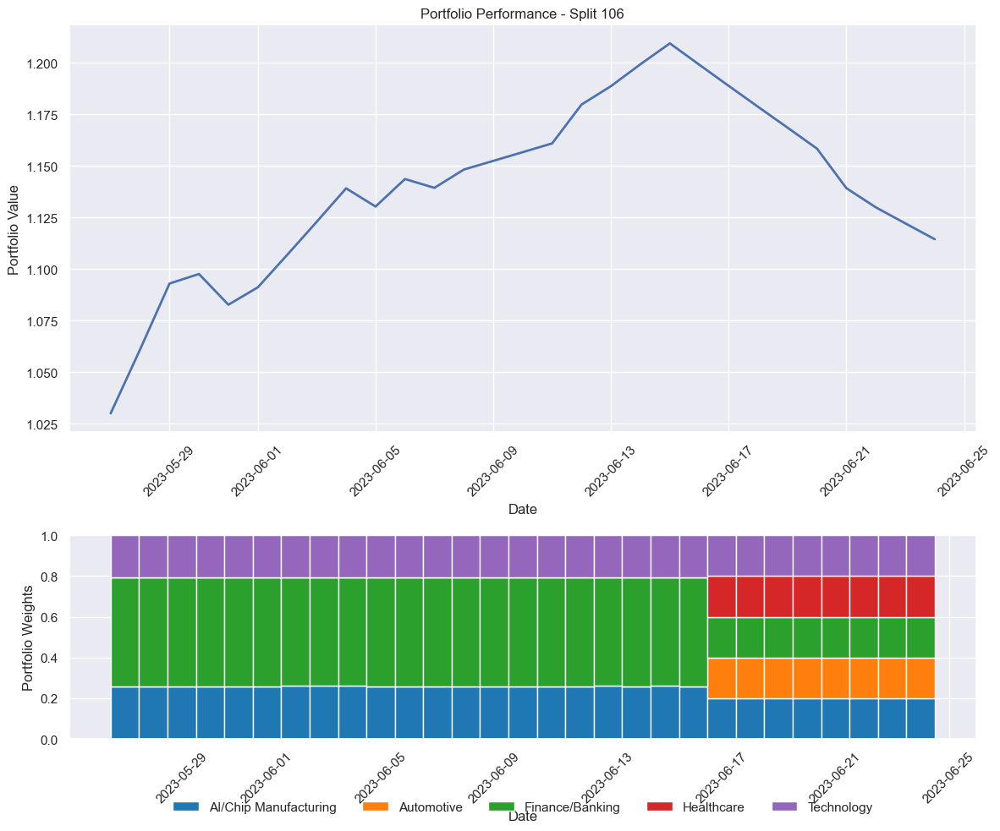


Processing split 107/124
Train period: 2014-01-02 00:00:00 to 2023-05-26 00:00:00
Validation period: 2023-05-27 00:00:00 to 2023-06-25 00:00:00
Test period: 2023-06-26 00:00:00 to 2023-07-25 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8055
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 441  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 431          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

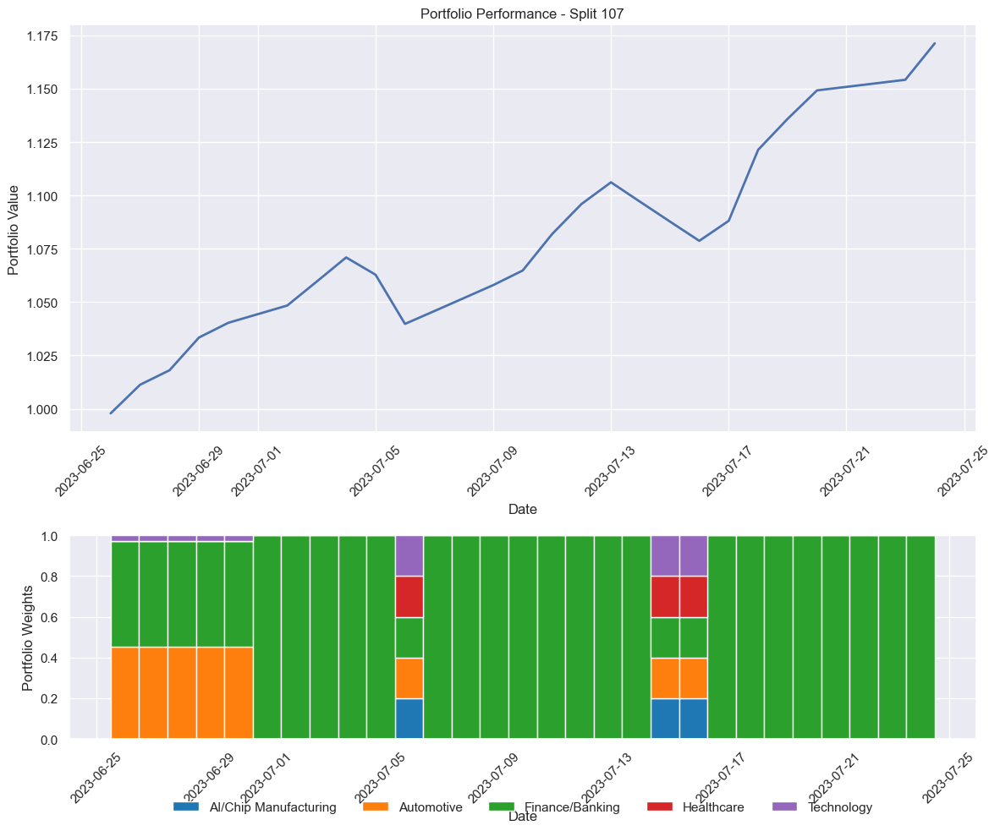


Processing split 108/124
Train period: 2014-01-02 00:00:00 to 2023-06-25 00:00:00
Validation period: 2023-06-26 00:00:00 to 2023-07-25 00:00:00
Test period: 2023-07-26 00:00:00 to 2023-08-24 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8320
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 442  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 431          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

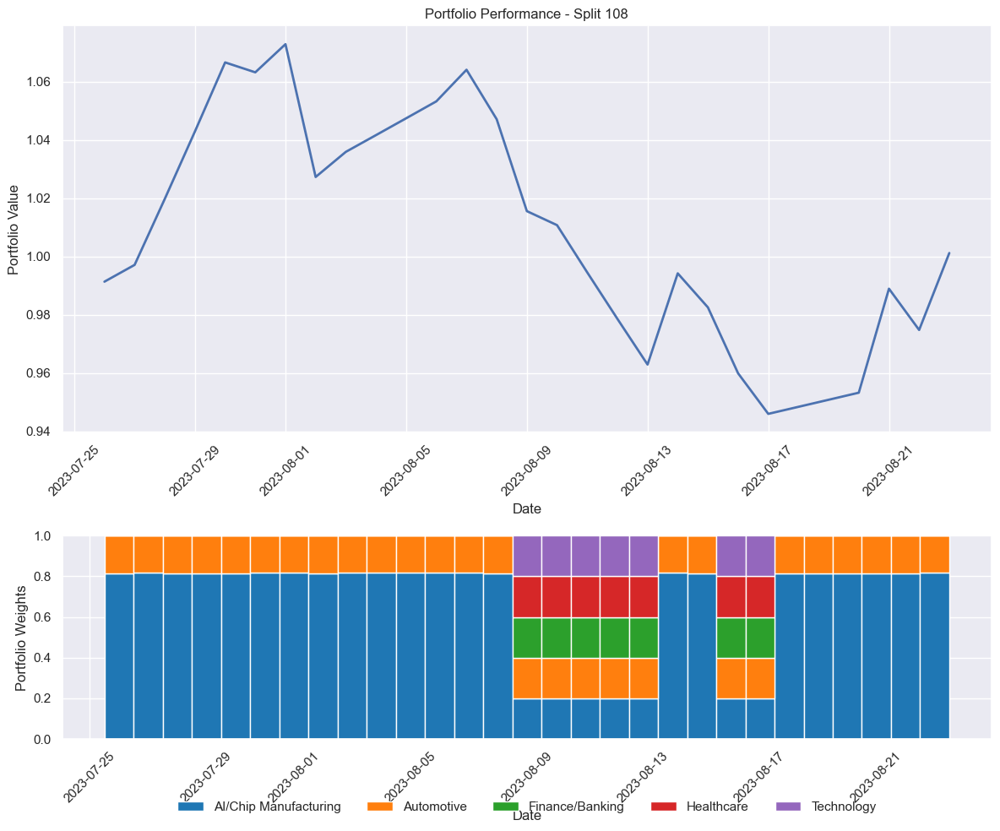


Processing split 109/124
Train period: 2014-01-02 00:00:00 to 2023-07-25 00:00:00
Validation period: 2023-07-26 00:00:00 to 2023-08-24 00:00:00
Test period: 2023-08-25 00:00:00 to 2023-09-23 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8425
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 456  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 445          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

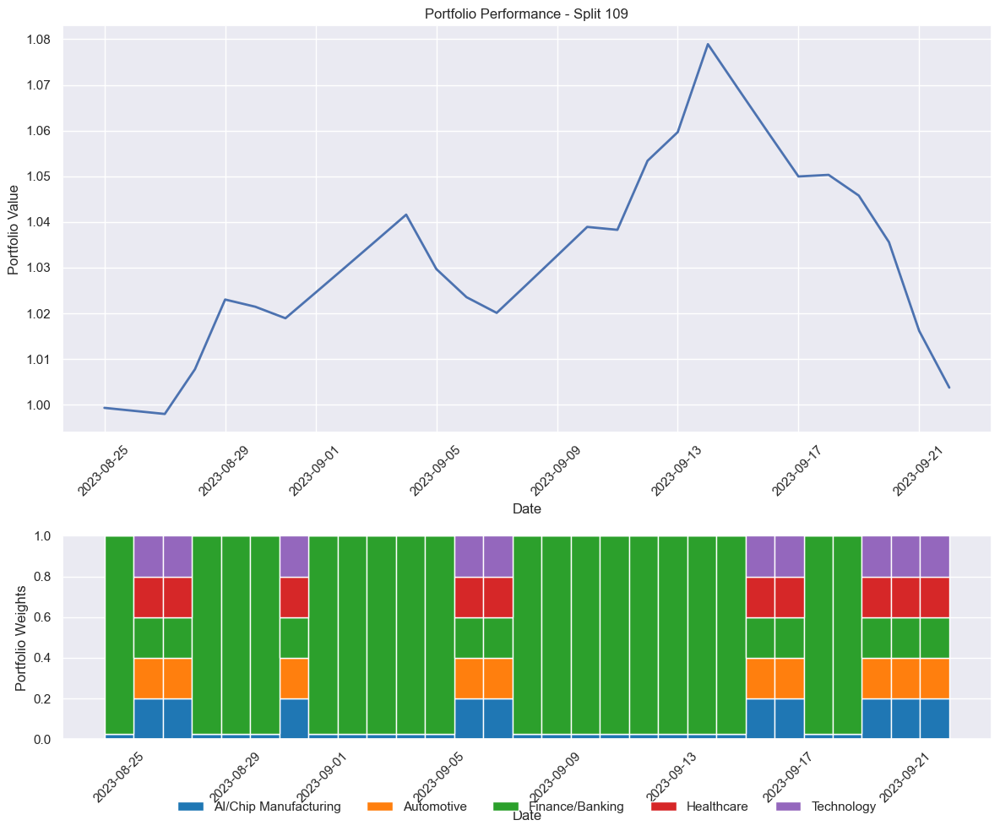


Processing split 110/124
Train period: 2014-01-02 00:00:00 to 2023-08-24 00:00:00
Validation period: 2023-08-25 00:00:00 to 2023-09-23 00:00:00
Test period: 2023-09-24 00:00:00 to 2023-10-23 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8226
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 455  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 444          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

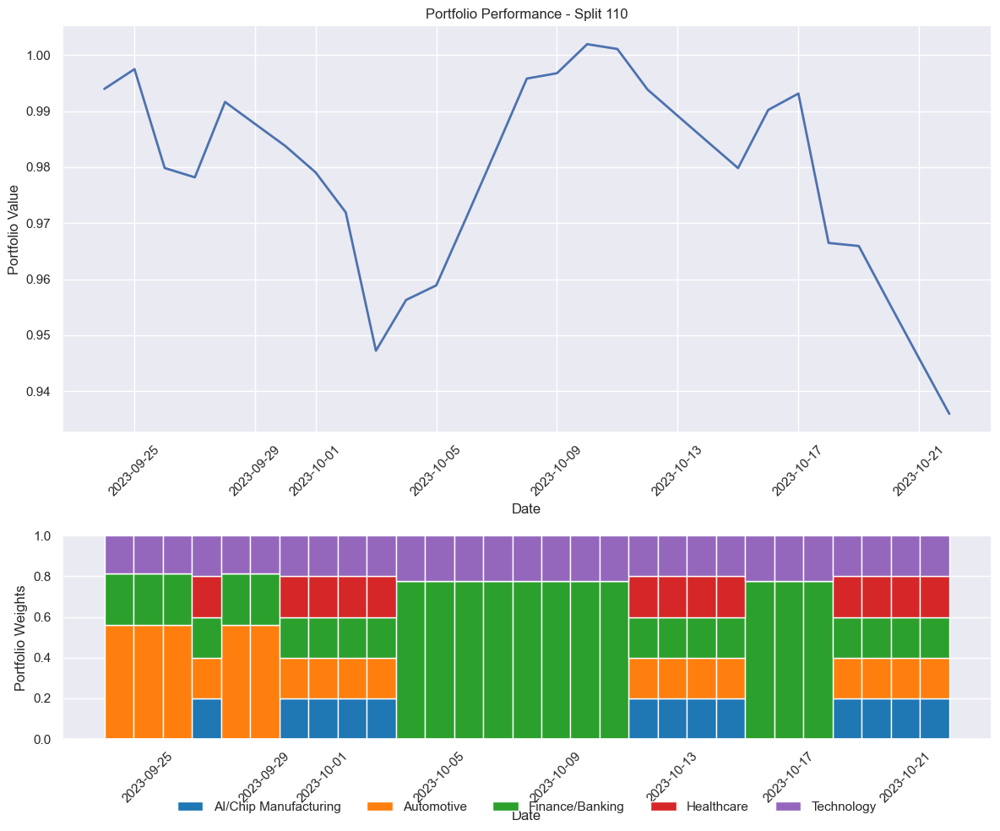


Processing split 111/124
Train period: 2014-01-02 00:00:00 to 2023-09-23 00:00:00
Validation period: 2023-09-24 00:00:00 to 2023-10-23 00:00:00
Test period: 2023-10-24 00:00:00 to 2023-11-22 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.7901
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 450  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 442          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

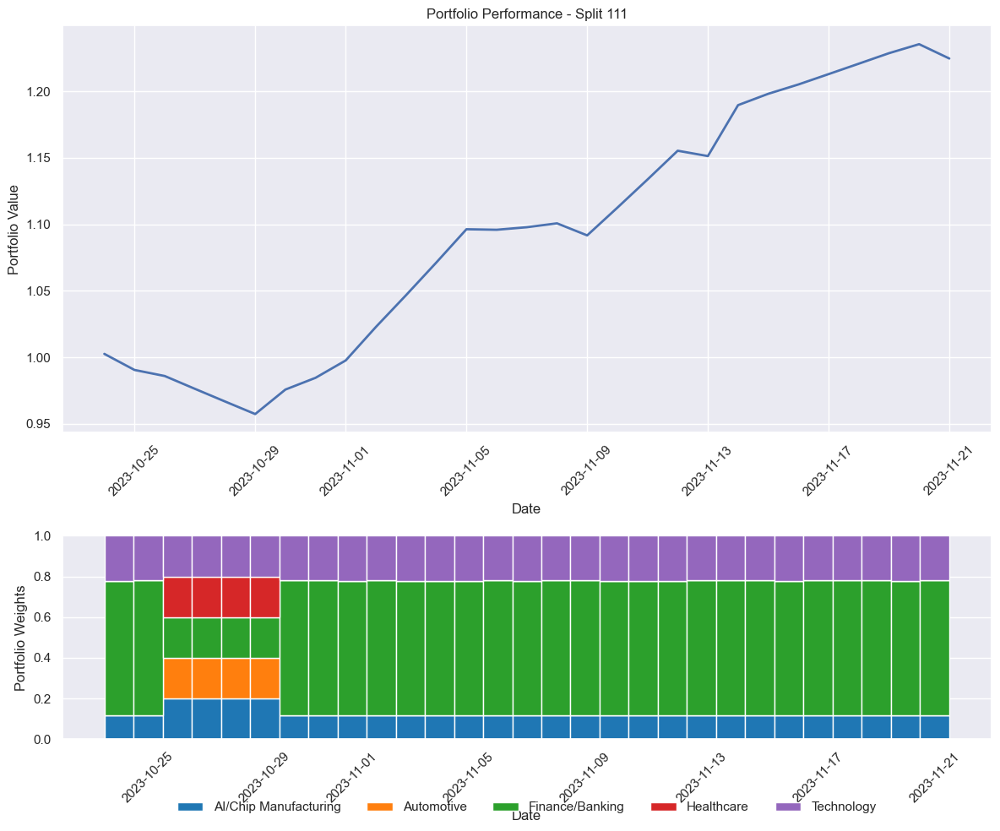


Processing split 112/124
Train period: 2014-01-02 00:00:00 to 2023-10-23 00:00:00
Validation period: 2023-10-24 00:00:00 to 2023-11-22 00:00:00
Test period: 2023-11-23 00:00:00 to 2023-12-22 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.7569
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 455  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 445          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

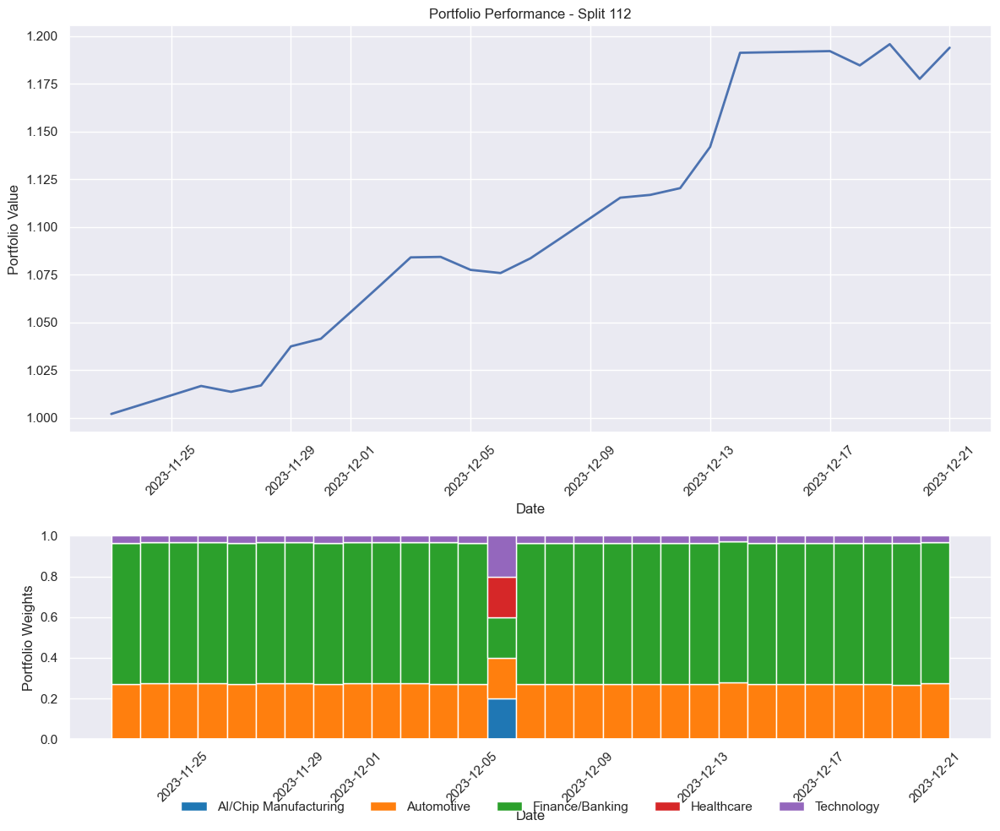


Processing split 113/124
Train period: 2014-01-02 00:00:00 to 2023-11-22 00:00:00
Validation period: 2023-11-23 00:00:00 to 2023-12-22 00:00:00
Test period: 2023-12-23 00:00:00 to 2024-01-21 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.7943
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 455  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 445          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

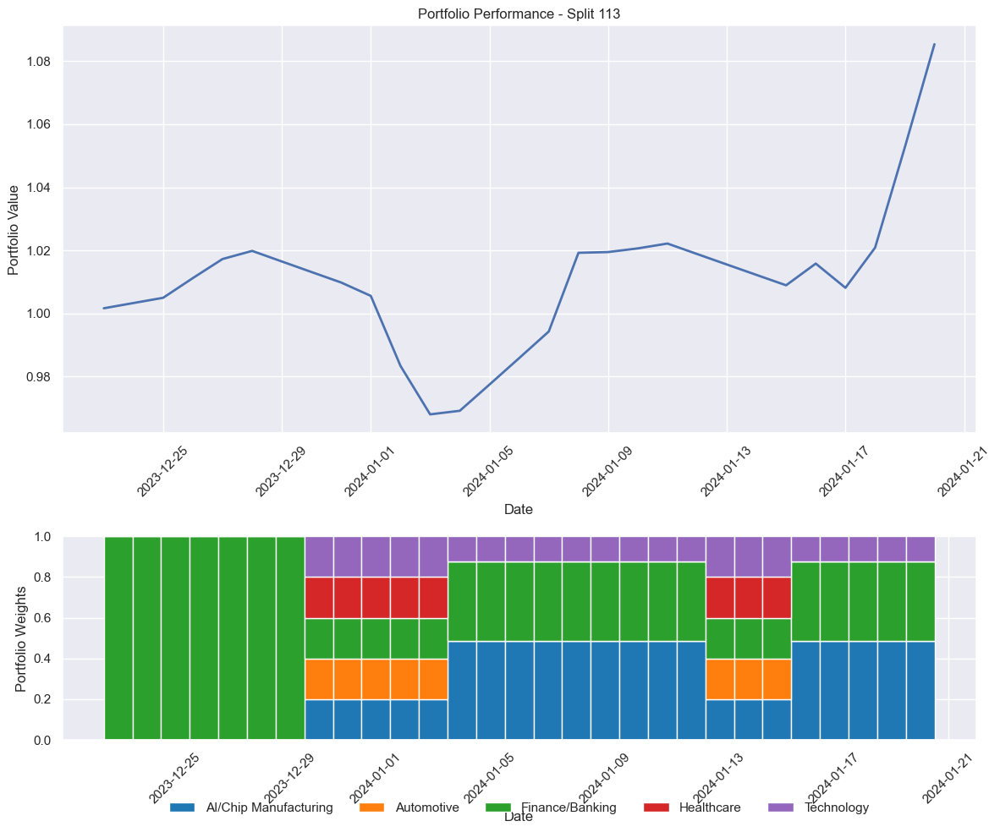


Processing split 114/124
Train period: 2014-01-02 00:00:00 to 2023-12-22 00:00:00
Validation period: 2023-12-23 00:00:00 to 2024-01-21 00:00:00
Test period: 2024-01-22 00:00:00 to 2024-02-20 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8234
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 450  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 442          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

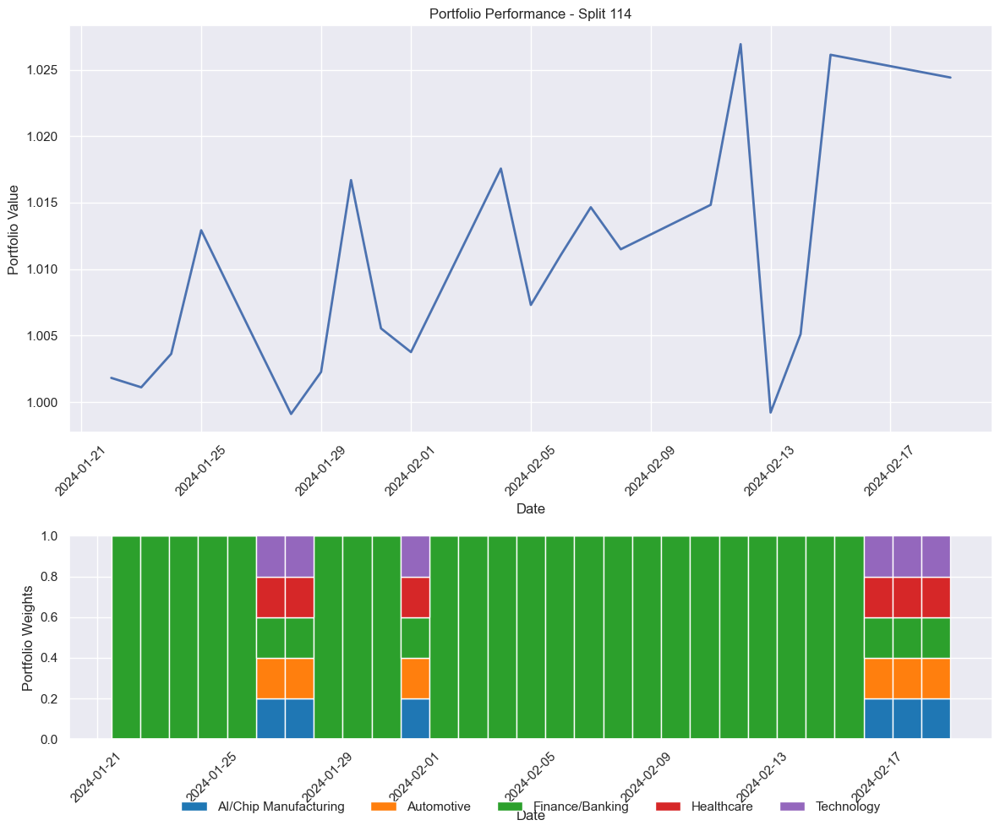


Processing split 115/124
Train period: 2014-01-02 00:00:00 to 2024-01-21 00:00:00
Validation period: 2024-01-22 00:00:00 to 2024-02-20 00:00:00
Test period: 2024-02-21 00:00:00 to 2024-03-21 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8629
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 418  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 426          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

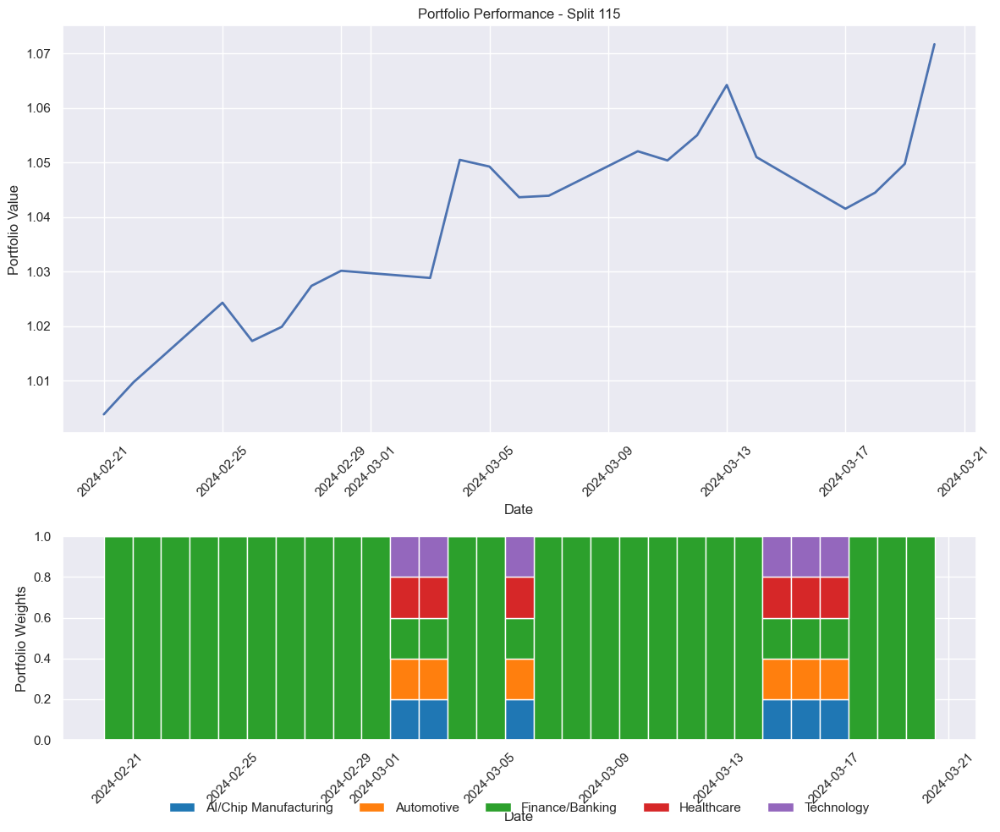


Processing split 116/124
Train period: 2014-01-02 00:00:00 to 2024-02-20 00:00:00
Validation period: 2024-02-21 00:00:00 to 2024-03-21 00:00:00
Test period: 2024-03-22 00:00:00 to 2024-04-20 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8435
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 458  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 446          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

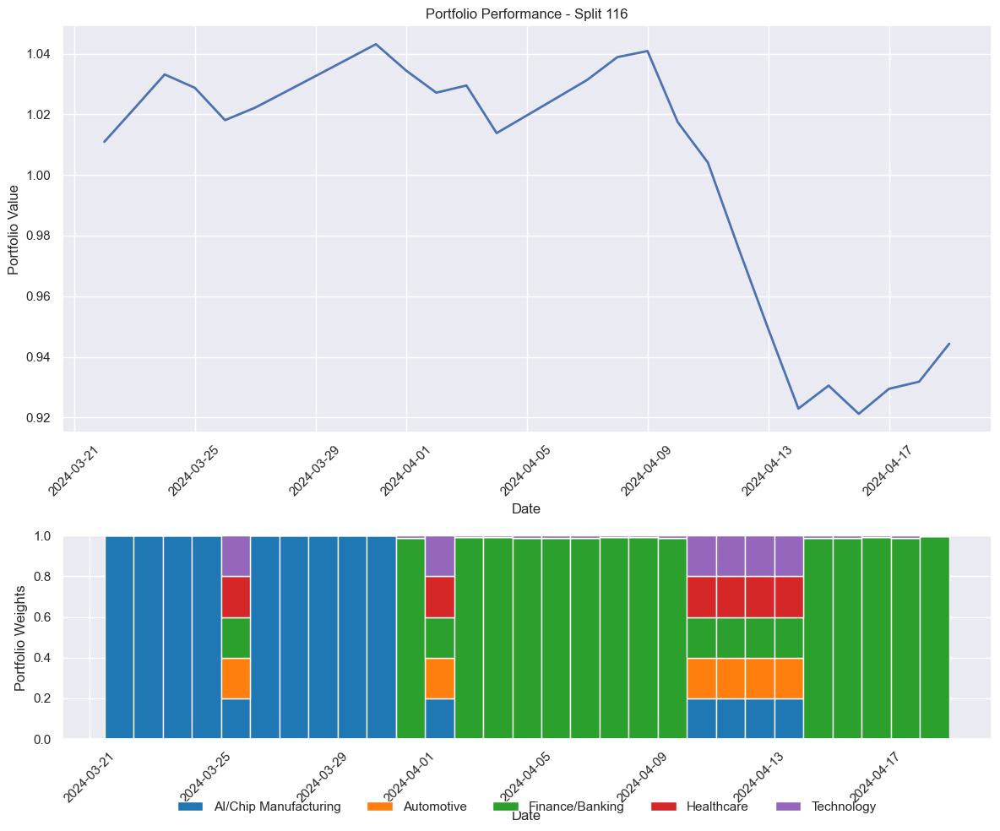


Processing split 117/124
Train period: 2014-01-02 00:00:00 to 2024-03-21 00:00:00
Validation period: 2024-03-22 00:00:00 to 2024-04-20 00:00:00
Test period: 2024-04-21 00:00:00 to 2024-05-20 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8594
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 455  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 444          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

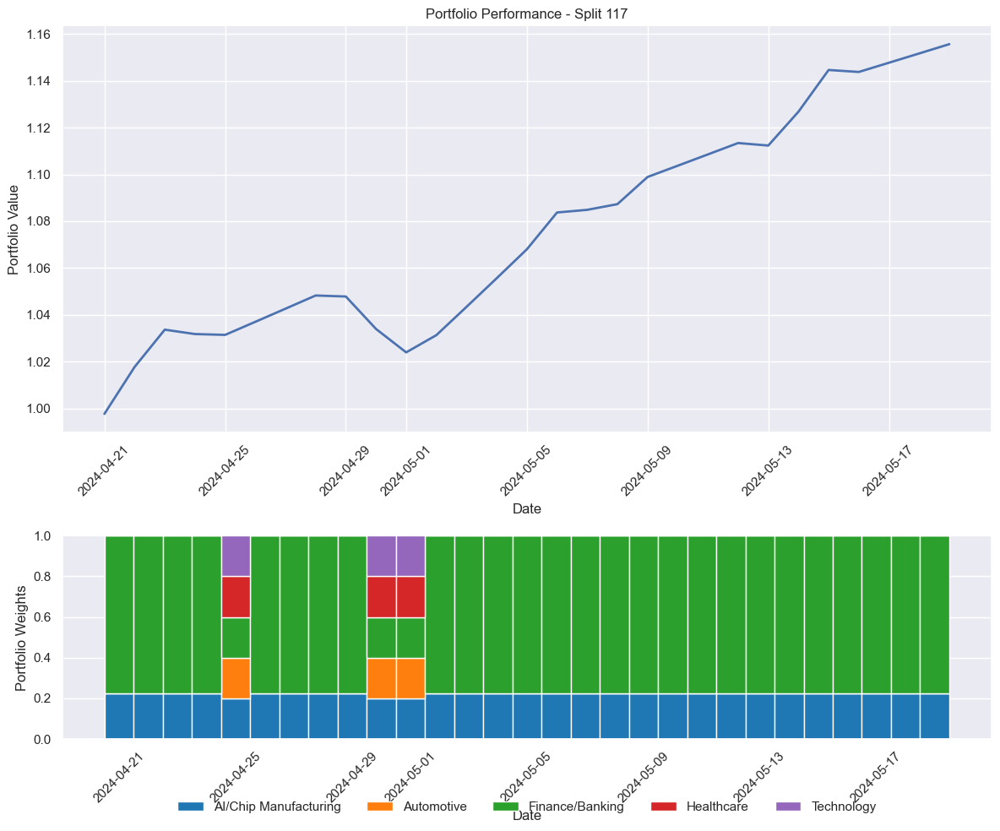


Processing split 118/124
Train period: 2014-01-02 00:00:00 to 2024-04-20 00:00:00
Validation period: 2024-04-21 00:00:00 to 2024-05-20 00:00:00
Test period: 2024-05-21 00:00:00 to 2024-06-19 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8063
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 458  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 446          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

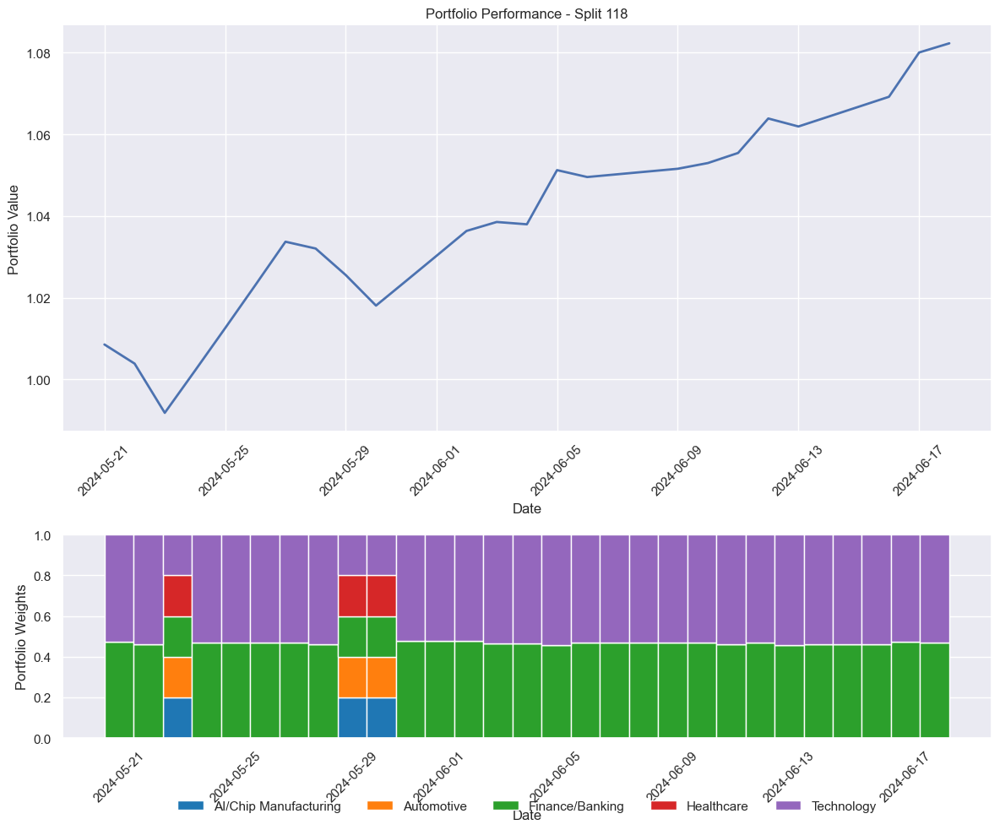


Processing split 119/124
Train period: 2014-01-02 00:00:00 to 2024-05-20 00:00:00
Validation period: 2024-05-21 00:00:00 to 2024-06-19 00:00:00
Test period: 2024-06-20 00:00:00 to 2024-07-19 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8301
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 456  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 445          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

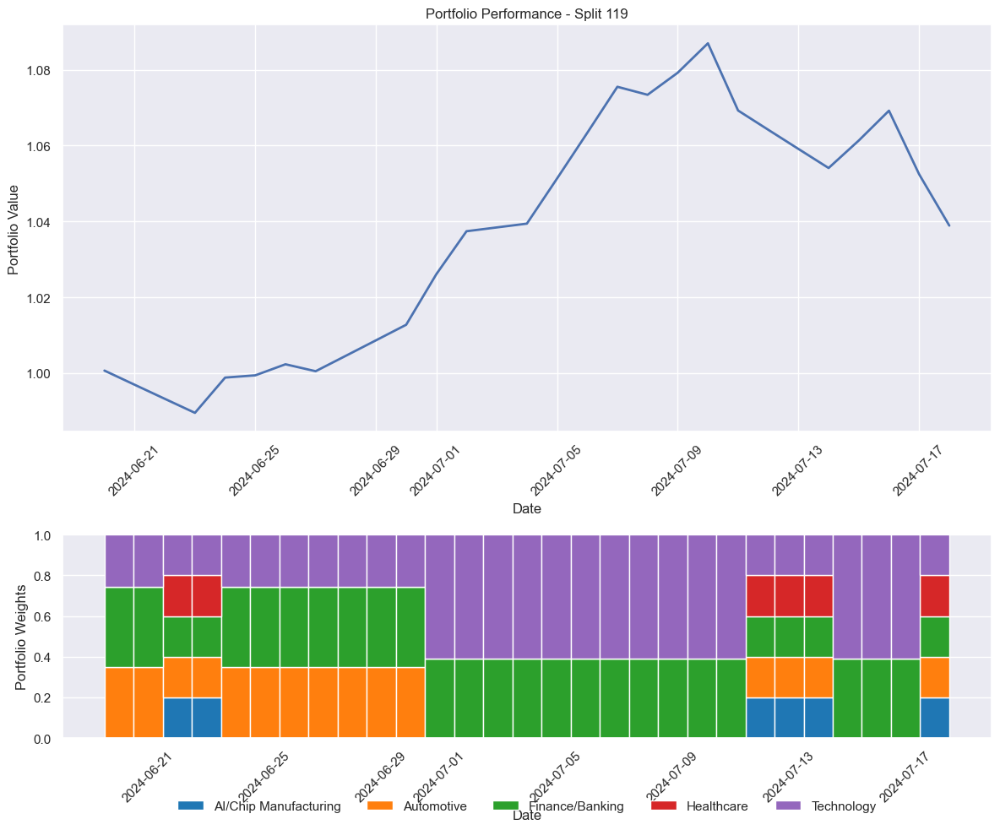


Processing split 120/124
Train period: 2014-01-02 00:00:00 to 2024-06-19 00:00:00
Validation period: 2024-06-20 00:00:00 to 2024-07-19 00:00:00
Test period: 2024-07-20 00:00:00 to 2024-08-18 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8340
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 450  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 442          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

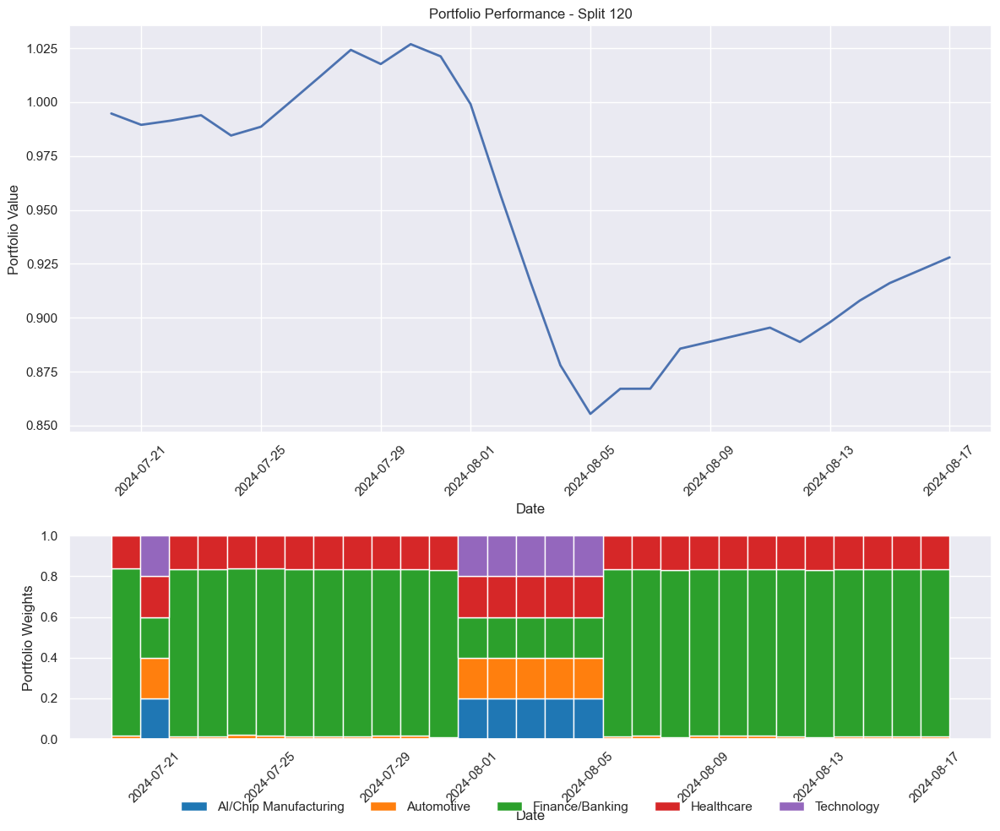


Processing split 121/124
Train period: 2014-01-02 00:00:00 to 2024-07-19 00:00:00
Validation period: 2024-07-20 00:00:00 to 2024-08-18 00:00:00
Test period: 2024-08-19 00:00:00 to 2024-09-17 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.8331
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 457  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 445          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

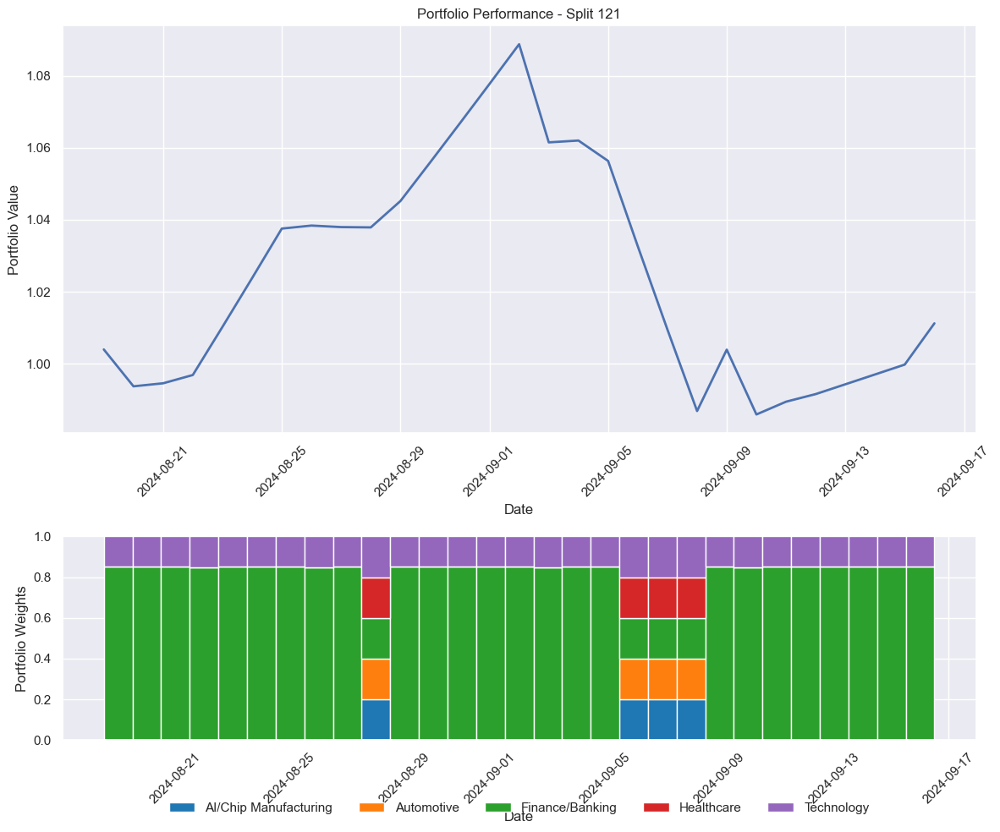


Processing split 122/124
Train period: 2014-01-02 00:00:00 to 2024-08-18 00:00:00
Validation period: 2024-08-19 00:00:00 to 2024-09-17 00:00:00
Test period: 2024-09-18 00:00:00 to 2024-10-17 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.7718
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 456  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 444          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

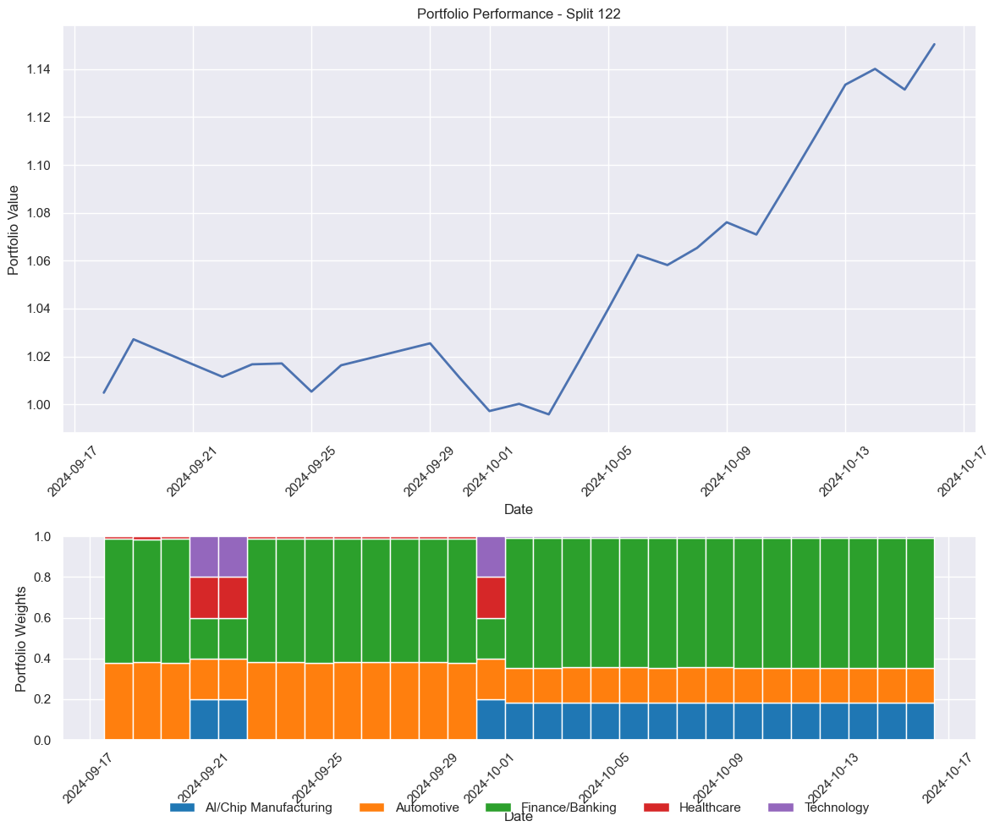


Processing split 123/124
Train period: 2014-01-02 00:00:00 to 2024-09-17 00:00:00
Validation period: 2024-09-18 00:00:00 to 2024-10-17 00:00:00
Test period: 2024-10-18 00:00:00 to 2024-11-16 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.7828
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 451  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 442          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

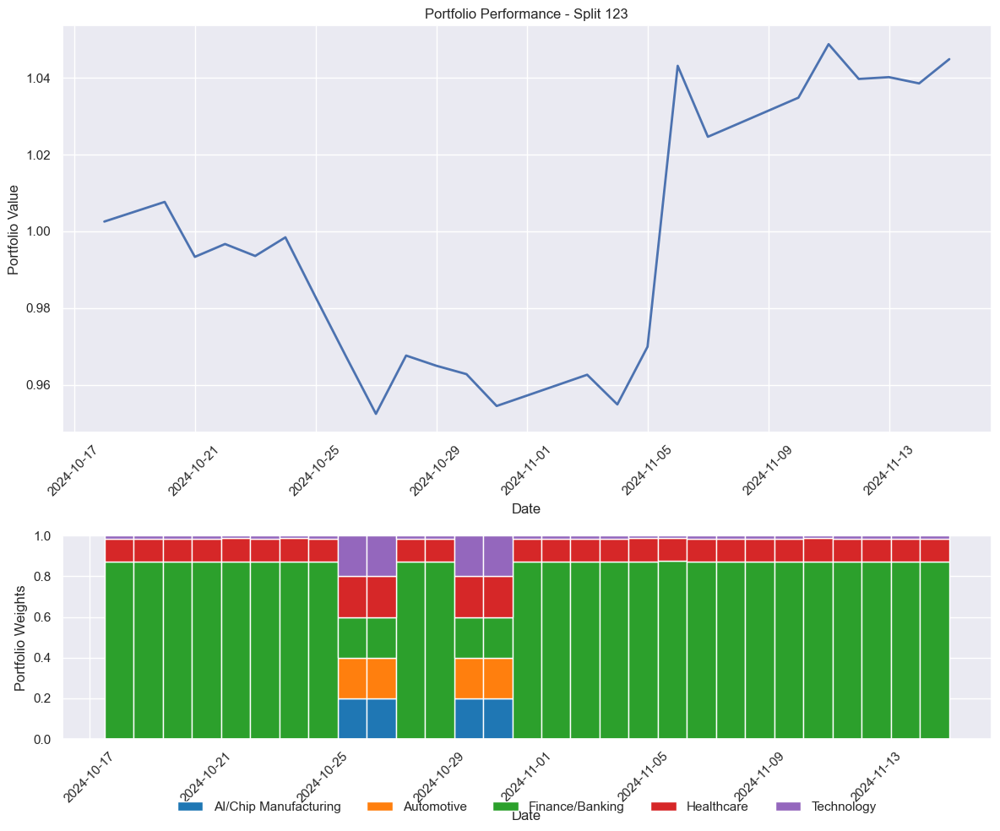


Processing split 124/124
Train period: 2014-01-02 00:00:00 to 2024-10-17 00:00:00
Validation period: 2024-10-18 00:00:00 to 2024-11-16 00:00:00
Test period: 2024-11-17 00:00:00 to 2024-12-16 00:00:00
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.7775
Using Monte Carlo optimized initial weights
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 457  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 446          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|    clip_range        

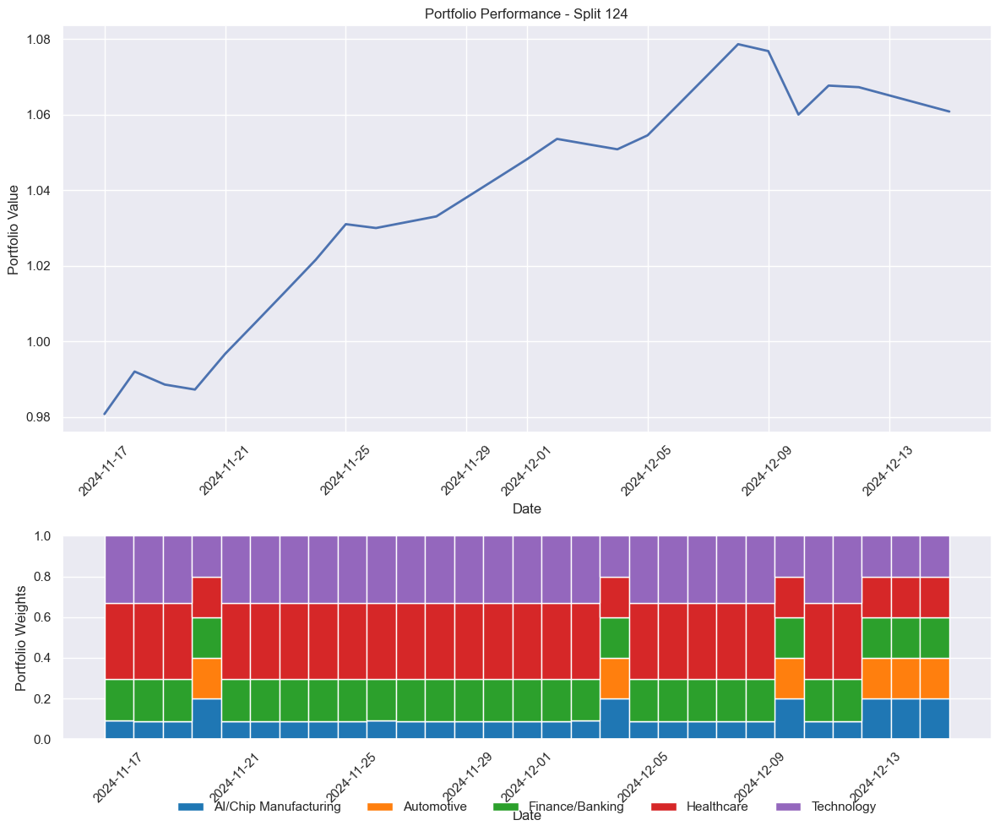


Overall Results:
            Split          Train_Start            Train_End  \
count  124.000000                  124                  124   
mean    62.500000  2014-01-02 00:00:00  2019-09-29 00:00:00   
min      1.000000  2014-01-02 00:00:00  2014-09-10 00:00:00   
25%     31.750000  2014-01-02 00:00:00  2017-03-20 12:00:00   
50%     62.500000  2014-01-02 00:00:00  2019-09-29 00:00:00   
75%     93.250000  2014-01-02 00:00:00  2022-04-08 12:00:00   
max    124.000000  2014-01-02 00:00:00  2024-10-17 00:00:00   
std     35.939764                  NaN                  NaN   

                Test_Start             Test_End  Total_Return  \
count                  124                  124    124.000000   
mean   2019-10-30 00:00:00  2019-11-28 00:00:00      0.024002   
min    2014-10-11 00:00:00  2014-11-09 00:00:00     -0.287181   
25%    2017-04-20 12:00:00  2017-05-19 12:00:00     -0.045486   
50%    2019-10-30 00:00:00  2019-11-28 00:00:00      0.026093   
75%    2022-05-09 12:00:

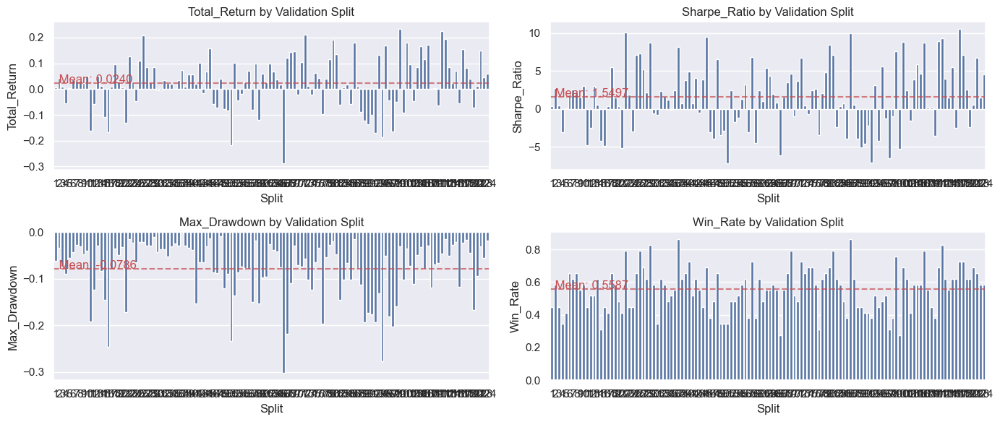


Aggregate Performance Across All Splits:
Mean Sharpe Ratio: 1.5497
Total Cumulative Return: 2.9762
Mean Max Drawdown: -0.0786
Mean Win Rate: 0.5587

Representative Split Chosen for Retraining: 67 (Closest to Median Sharpe)
Created 124 walk-forward validation splits
Running Monte Carlo simulation with 10000 iterations...
Monte Carlo simulation complete. Optimal Sharpe ratio: 0.9224
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 458  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 445          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0065288832 |
|    clip_fraction        | 0.0615       |
|

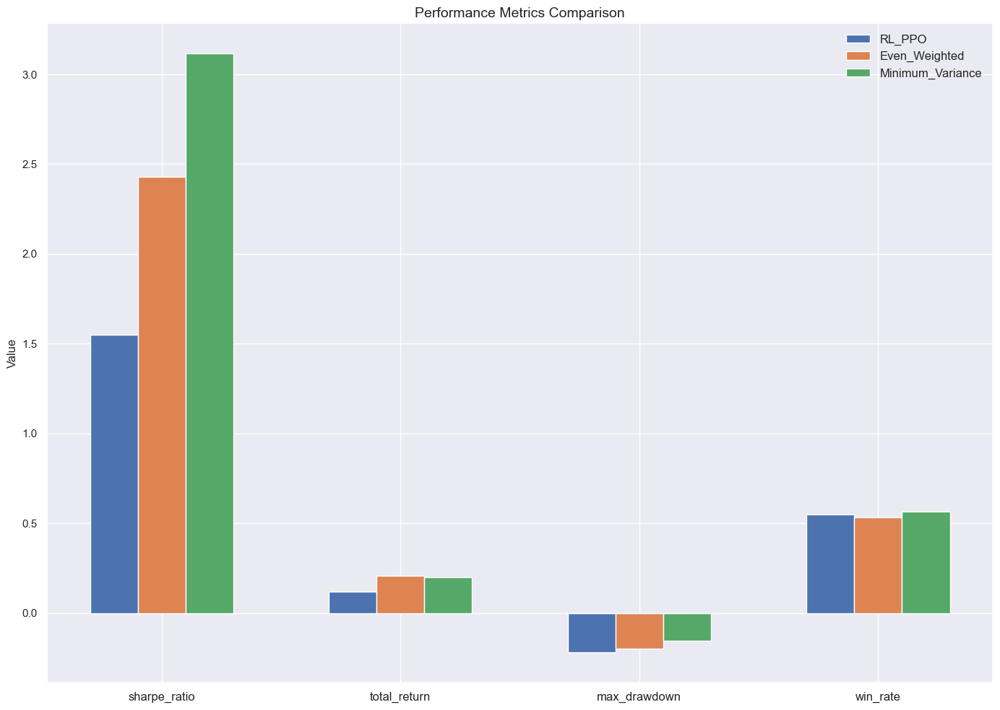

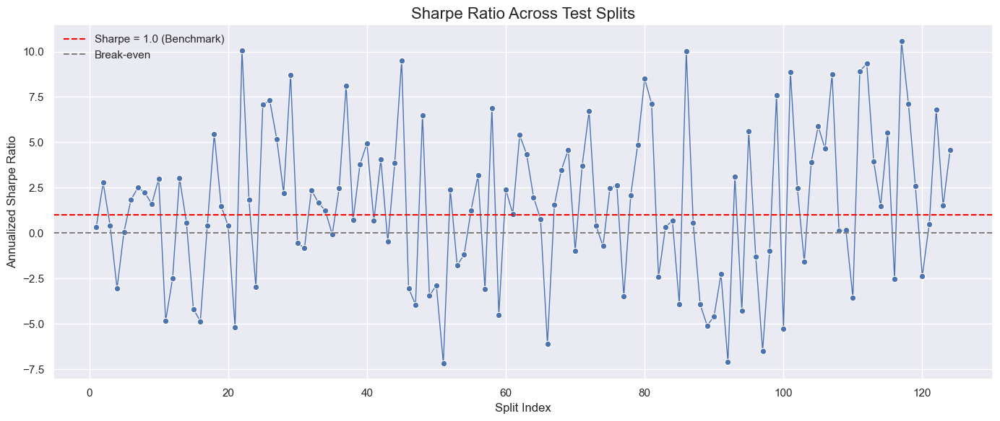

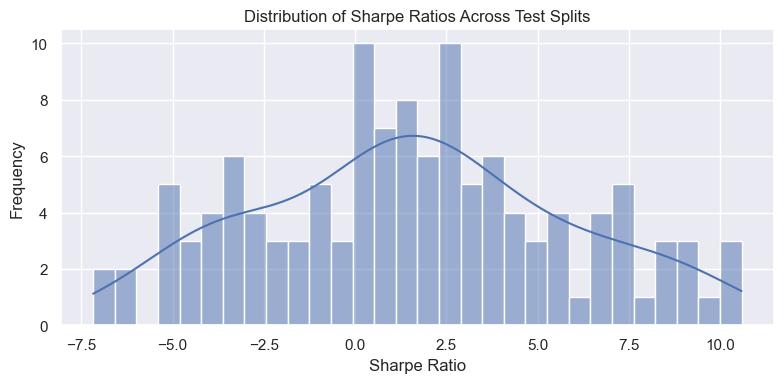

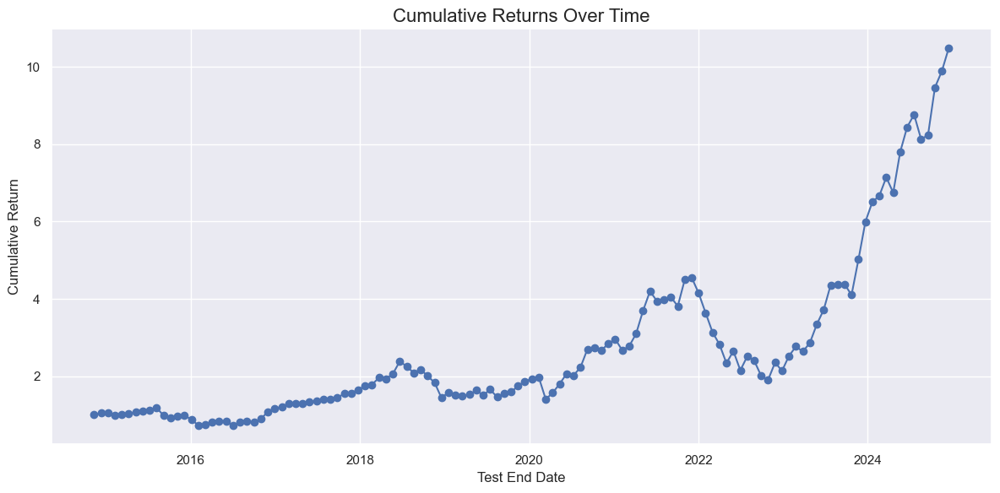

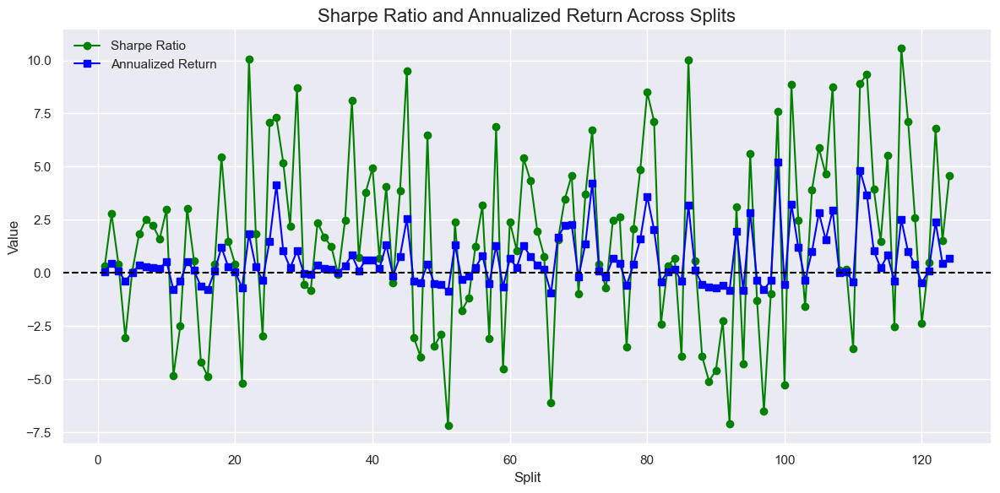

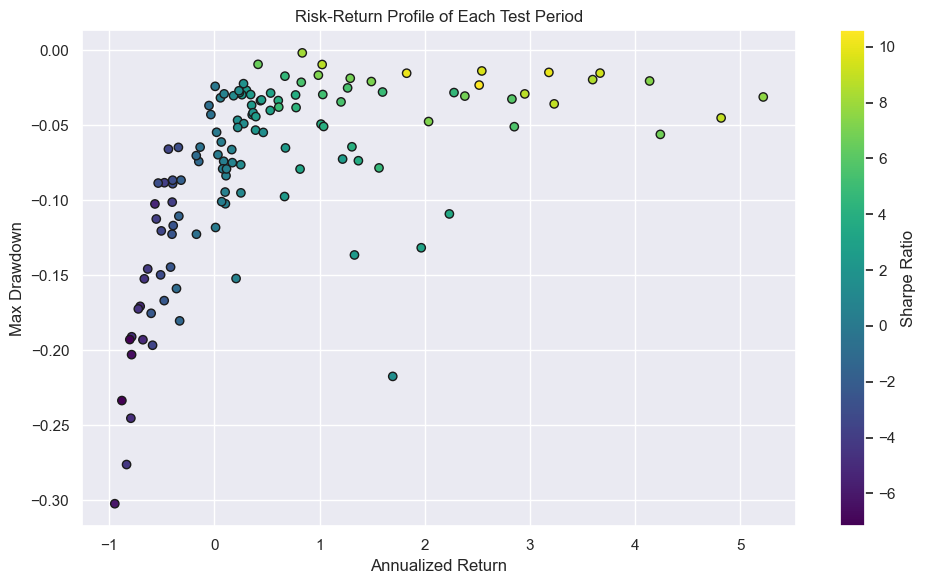


Final Portfolio Allocation (Last Split):
AI/Chip Manufacturing: 0.2000
Automotive: 0.2000
Finance/Banking: 0.2000
Healthcare: 0.2000
Technology: 0.2000

Portfolio Optimization complete!


In [15]:
# MAIN EXECUTION

if __name__ == "__main__":
    print("Portfolio Optimization with Reinforcement Learning")
    print("=" * 50)

    # Load data sources
stock_returns, fundamental_data, sentiment_data, economic_data = load_data_sources()

# Preprocess and merge data
merged_data = preprocess_data(stock_returns, fundamental_data, sentiment_data, economic_data)

# Step 3: Perform walk-forward training and evaluation
results_df = train_and_evaluate_with_walk_forward(merged_data, total_timesteps=20000, verbose=1)
results_df

# Print and plot overall results
print("\nOverall Results:")
print("=" * 50)
print(results_df.describe())

plot_metrics_comparison(results_df)

# Aggregate model performance across all splits
mean_sharpe = results_df['Sharpe_Ratio'].mean()
mean_drawdown = results_df['Max_Drawdown'].mean()
mean_winrate = results_df['Win_Rate'].mean()
total_return = results_df['Total_Return'].sum()

print("\nAggregate Performance Across All Splits:")
print(f"Mean Sharpe Ratio: {mean_sharpe:.4f}")
print(f"Total Cumulative Return: {total_return:.4f}")
print(f"Mean Max Drawdown: {mean_drawdown:.4f}")
print(f"Mean Win Rate: {mean_winrate:.4f}")

# Identify the split closest to the median Sharpe Ratio as representative
median_sharpe = results_df['Sharpe_Ratio'].median()
representative_split_idx = (results_df['Sharpe_Ratio'] - median_sharpe).abs().idxmin()
representative_split = results_df.loc[representative_split_idx, 'Split']

print(f"\nRepresentative Split Chosen for Retraining: {representative_split} (Closest to Median Sharpe)")

# Prepare data using the representative split
splits = walk_forward_validation(merged_data)
train_data, validation_data, test_data = splits[int(representative_split) - 1]

# Create initial portfolio weights
try:
    initial_weights = monte_carlo_portfolio_optimization(train_data)
except:
    return_cols = [col for col in train_data.columns if '_Return' in col]
    num_assets = len(return_cols)
    initial_weights = np.ones(num_assets) / num_assets

# Train model on representative split
final_model, train_env = train_portfolio_model(
    train_data=train_data,
    validation_data=validation_data,
    initial_weights=initial_weights,
    total_timesteps=20000,
    verbose=1
)

# Evaluate final model
final_test_results = evaluate_model(final_model, test_data, initial_weights)
final_test_results
# Compare with baseline portfolios
print("\nComparing with baseline strategies...")
baseline_comparison, improvement_df = compare_model_with_baselines(
    final_test_results,
    merged_data,
    representative_split_idx,
    results_df
)


# Sharpe Ratio 
plot_sharpe_ratios(results_df)

# Cumulative reuturn
plot_total_cumulative_return(results_df)

# Sharpe Ratio vs Annualized Return
plot_sharpe_and_return(results_df)

# Risk vs Return
plot_risk_return_profile(results_df)

# Final portfolio weight allocation
last_split_allocation = results_df.iloc[-1]['Asset_Allocation']
print("\nFinal Portfolio Allocation (Last Split):")
for asset, weight in last_split_allocation.items():
    print(f"{asset}: {weight:.4f}")

print("\nPortfolio Optimization complete!")


In [16]:
final_test_results['weights_history'][-1]

array([0.43578506, 0.39022136, 0.        , 0.        , 0.17399359],
      dtype=float32)